### This code is used to automatically measure how ever many samples are are the coverslip. There are multiple locations where the values of the number of samples, patient names, and number of data points to be measured need to be edited per run through

In [1]:
from utilityraman import Camera
#Import relevant auxiliary package
import numpy as np
import time
from time import sleep
from ctypes import *
import matplotlib.pyplot as plt
import pandas as pd
from scipy.linalg import cholesky
from scipy.sparse import csc_matrix, eye, diags
from scipy.sparse.linalg import spsolve

import os

def moving_average(data,window_size):
    weights = np.ones(window_size)/window_size  
    return np.convolve(data,weights,mode='valid')

def calculate_entropy(intensities):
#     window_size = 3
#     intensities = moving_average(intensities,window_size)
    normalized_int = intensities / np.sum(intensities)
    entropy = -np.sum(normalized_int * np.log2(normalized_int))
    return entropy

def calculate_sharpness(intensities):
#     window_size = 3
#     intensities = moving_average(intensities,window_size)
    gradient = np.gradient(intensities)
    sharpness = np.sum(np.abs(gradient))
    return sharpness

folder_dir = 'data/Bec'
if not os.path.exists(folder_dir):
    os.makedirs(folder_dir)
    print(f'Directory {folder_dir}')
    
else:
    print(f'Directory {folder_dir} already exist')

Directory data/Bec already exist


In [2]:
#Initialize all relevant modules
##TO EDIT: grating and center wavelength
grating = 3;
centerWavelength = 853;

#Import Stage Control for ASI
from ms2k import MS2000

print(f"COM Ports: {MS2000.scan_ports()}")

#Initiate MS2000
border_pos = np.zeros((4,2))

# connect to the MS2000
ms2k = MS2000("COM1", 9600)
ms2k.connect_to_serial()
if not ms2k.is_open():
    print("Exiting the program...")

#Import MCL and initiate
# change the path to match your system.
mcldll = CDLL("C:/Users/Carney Lab/Desktop/Death Star/Automation Code/MCL Height Adjustment/Madlib.dll")

# The correct return types for the functions used must be set.
mcldll.MCL_ReleaseHandle.restype = None
mcldll.MCL_SingleReadN.restype = c_double

# Acquire a device handle
handle = mcldll.MCL_InitHandle()
print("MCL Handle = ", handle)

#Initialize Camera
cam = Camera()
cam.init()
cam.start_cooler()
cam.setup_camera(grating, centerWavelength)

#Initialize z axis position
axis = c_uint(3)
pos = c_double(0)

# Move to a new position
error = mcldll.MCL_SingleWriteN(pos, axis, handle)
print("Error = ", error)

# Wait for nanopositioner to settle
sleep(0.025)

# Read the new position
position = mcldll.MCL_SingleReadN(axis, handle)
print("Position = ", position)

COM Ports: ['COM1', 'COM3', 'COM5']
Connected to the serial port.
Serial port = COM1 :: Baud rate = 9600
MCL Handle =  1
Initializing Camera
Function Initialize returned SUCCESS
Function Initialize returned 20002
Successfully initialize camera
Function GetCameraSerialNumber returned 20002 Serial No: 22728
Function SetTemperature returned 20002 target temperature -60
Function CoolerON returned 20002
Function GetTemperature returned 20036 current temperature = -59
Temperature stabilized
Function SetAcquisitionMode returned 20002 mode = Single Scan
Function SetReadMode returned 20002 mode = FVB
Function SetTriggerMode returned 20002 mode = Internal
Function GetDetector returned 20002 xpixels =1024 ypixels = 256
Function SetImage returned 20002 hbin = 1 vbin = 1 hstart = 1 hend = 1024 vstart = 1 vend = 256
Function GetAcquisitionTimings returned 20002 exposure = 0.00368 accumulate = 0.00739 kinetic = 0.00739
Function PrepareAcquisition returned 20002
Function GetSerialNumber returned : SUC

In [ ]:
# Reconnect to camera ONLY if it did not work the first time (if MCL handle is not = 1)
ms2k = MS2000("COM1", 9600)
ms2k.connect_to_serial()
if not ms2k.is_open():
    print("Exiting the program...")

In [3]:
##TO EDIT: filename inputs
date = "20240515"
filename = "60x_1mm_42mW_cw-853_grating3_quartz"


folder_path = os.path.join(folder_dir, date)
if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print(f'Directory {folder_path}')
    
else:
    print(f'Directory {folder_path} already exist')

Directory data/Bec\20240515


In [4]:
#spectral collection function for single control measurements
def controls(controlfile,exposure):    
    df_list = []
    num_rep = 5
    data_point = 1024
    int_array = np.zeros((num_rep,data_point))
    wa_array = np.zeros((num_rep,data_point))

    exp_time = exposure
    for rep in range(num_rep):
        wavenumbers, intensity = cam.camera_aquisition(exp_time)
        df = pd.DataFrame({
            'Wavelength':wavenumbers,
            'Intensity':intensity
        })
        df_list.append(df)
    final_df = pd.concat(df_list)

    final_df.to_csv(f'{folder_path}/{controlfile}.txt',index=False,sep = ',',header = False)
    print()
    plt.figure()
    plt.plot(wavenumbers,intensity,'r')
    plt.show()

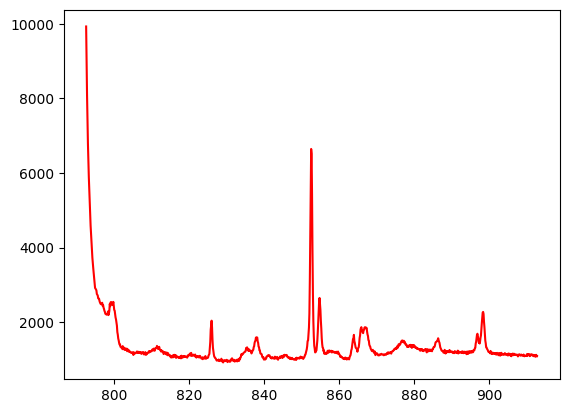

In [5]:
#PS Beads
psfilename = date + "_PS-beads_60x_1mm_42mW_cw-853_grating3_glass_1"
controls(psfilename,3)

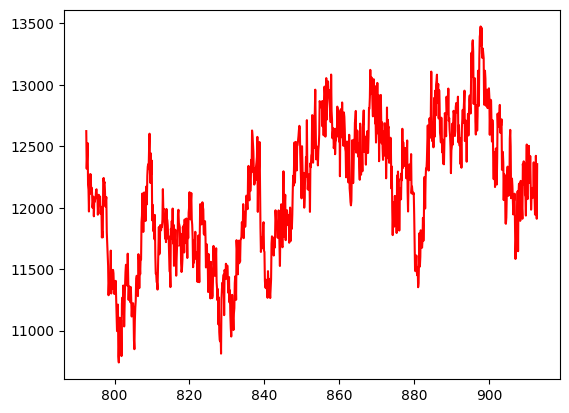

In [6]:
#Spectral Calibration
scfilename = date + "_spectralcal_60x_1mm_42mW_cw-853_grating3_air_1"
controls(scfilename,.05)

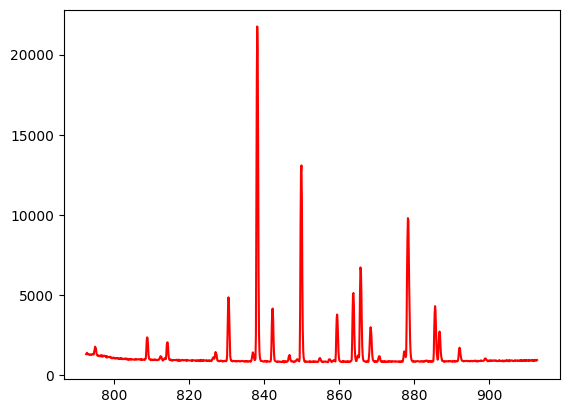

In [7]:
#Neon calibration
nfilename = date + "_neon-cal_1mm"
controls(nfilename,3)

In [8]:
##TO EDIT
#Change the number 'samples' to match how many dried samples droplets are being measured
#also change 'sample_names' to match the patient numbers for each spot in order
samples = 1
sample_names = ["346"]
border_pos = np.zeros((samples,4,2))

In [9]:
##TO EDIT
#Change this number to match which spot position is being saved, but python 0 indexed (ie. 1st spot = 0, nth spot = n-1)

spot_number = 0

In [10]:
#Define border position, go through all 4 for each spot being measured, changing 'spot_number' in between to match each one
#TOP
border_pos[spot_number,0] = ms2k.get_XYposition()
ms2k.wait_for_device()


Recv: :A 22579
Waiting for device...

Recv: :A -147911
Waiting for device...


In [11]:
#LEFT
border_pos[spot_number,1] = ms2k.get_XYposition()
ms2k.wait_for_device()


Recv: :A 33259
Waiting for device...

Recv: :A -159372
Waiting for device...


In [12]:
#BOTTOM
border_pos[spot_number,2] = ms2k.get_XYposition()
ms2k.wait_for_device()


Recv: :A 45094
Waiting for device...

Recv: :A -148710
Waiting for device...


In [13]:
#RIGHT
border_pos[spot_number,3] = ms2k.get_XYposition()
ms2k.wait_for_device()


Recv: :A 34613
Waiting for device...

Recv: :A -136636
Waiting for device...


In [14]:
#Check that the correct number of edges were inputed per number of spots measured

spot_num = border_pos.shape[0]
print(spot_num)

1


In [15]:
#check that all edges are saved in the right place
for h in range(spot_num):
    for k in range(4):
        ms2k.move(border_pos[h,k,0],border_pos[h,k,1])
        ms2k.wait_for_device()
        if k == 0:
            time.sleep(1.5)
        else:
            time.sleep(0.75)

Send: MOVE X=22579.0 Y=-147911.0 Z=0
Recv: :A
Waiting for device...
Send: MOVE X=33259.0 Y=-159372.0 Z=0
Recv: :A
Waiting for device...
Send: MOVE X=45094.0 Y=-148710.0 Z=0
Recv: :A
Waiting for device...
Send: MOVE X=34613.0 Y=-136636.0 Z=0
Recv: :A
Waiting for device...


In [16]:
##Calculate the grids for all spots for radial line measurements
##TO EDIT: measurements per line in the grid
data_points = 50

#name all x and y axis positions, average between the two corresponding values on each edge
y_pos = np.zeros(spot_num)
x_pos = np.zeros(spot_num)
y_min = np.zeros(spot_num)
y_max = np.zeros(spot_num)
x_min = np.zeros(spot_num)
x_max = np.zeros(spot_num)
#loop to make an n-D array with the spots in different columns
for a in range(spot_num):
    y_pos[a] = np.round((border_pos[a][0][1]+border_pos[a][2][1])/2)
    x_pos[a] = np.round((border_pos[a][1][0]+border_pos[a][3][0])/2)
    y_min[a] = border_pos[a][1][1]
    y_max[a] = border_pos[a][3][1]
    x_min[a] = border_pos[a][0][0]
    x_max[a] = border_pos[a][2][0]

#create vectors that correspond to the x and y axes
#make straight lines along each axis with evenly spaced points
vertical_line = np.round(np.linspace(x_min, x_max, data_points))
horizontal_line = np.round(np.linspace(y_min, y_max, data_points))
line_vert_y_pos = np.tile(y_pos,(data_points,1))
line_hor_x_pos = np.tile(x_pos,(data_points,1))

#create vectors that correspond to diagonal 45deg lines
#remove 30% from the maxes and mins to account for the geometry of a circle inscribed in a square
removed_range_x_min = (x_pos-x_min)*(1-1/2**(1/2))
removed_range_x_max = (x_max-x_pos)*(1-1/2**(1/2))
removed_range_y_max = (y_max-y_pos)*(1-1/2**(1/2))
removed_range_y_min = (y_pos-y_min)*(1-1/2**(1/2))

#calculate the new maxes and mins for the angles lines
angled_x_min = x_min + removed_range_x_min
angled_x_max = x_max - removed_range_x_max
angled_y_min = y_min + removed_range_y_min
angled_y_max = y_max - removed_range_y_max

#create x and y vectors that correspond to the angled vectors
#y vectors are mirrored so we get both diagonal 45deg lines
angled_vector_x = np.round(np.linspace(angled_x_min,angled_x_max,data_points))
angled_vector_y_1 = np.round(np.linspace(angled_y_min,angled_y_max,data_points))
angled_vector_y_2 = np.round(np.linspace(angled_y_max,angled_y_min,data_points))

#create n matrices for all x and y vectors in order, to put through the 2 for loops
#each grid vector has n-D for each spot, and 50x4 for each of the 4 rows
x_vectors_grid = np.zeros((spot_num,4,data_points))
y_vectors_grid = np.zeros((spot_num,4,data_points))
for b in range(spot_num):
    x_vectors_grid[b] = np.row_stack((vertical_line[:,b], line_hor_x_pos[:,b], angled_vector_x[:,b], angled_vector_x[:,b]))
    y_vectors_grid[b] = np.row_stack((line_vert_y_pos[:,b], horizontal_line[:,b], angled_vector_y_2[:,b], angled_vector_y_1[:,b]))

In [ ]:
#For double checking all grid locations for all spots, will take FOREVER if doing more than a few grid spots, use at own risk
for h in range(spot_num):
    for k in range(4):
        for i in range(data_points):
            ms2k.move(x_vectors_grid[h,k,i],y_vectors_grid[h,k,i])
            ms2k.wait_for_device()
            time.sleep(0.75)

In [17]:
#Preprocessing function for visualization (NOT what is being saved, raw data is saved)
#INPUTS: 1024x2 matrix of spectra (wavelengths and intensitites)

#whittaker smooth is a part of airPLS
def WhittakerSmooth(x,w,lambda_,differences=1):

    X=np.matrix(x)
    m=X.size
    E=eye(m,format='csc')
    for i in range(differences):
        E=E[1:]-E[:-1] # numpy.diff() does not work with sparse matrix. This is a workaround.
    W=diags(w,0,shape=(m,m))
    A=csc_matrix(W+(lambda_*E.T*E))
    B=csc_matrix(W*X.T)
    background=spsolve(A,B)
    return np.array(background)

#airPLS corrects baseline
def airPLS(x, lambda_=100, porder=1, itermax=15):

    m=x.shape[0]
    w=np.ones(m)
    for i in range(1,itermax+1):
        z = WhittakerSmooth(x,w,lambda_, porder)
        d=x-z
        dssn=np.abs(d[d<0].sum())
        if(dssn<0.001*(abs(x)).sum() or i==itermax):
            if(i==itermax): print('WARING max iteration reached!')
            break
        w[d>=0]=0 # d>0 means that this point is part of a peak, so its weight is set to 0 in order to ignore it
        w[d<0]=np.exp(i*np.abs(d[d<0])/dssn)
        w[0]=np.exp(i*(d[d<0]).max()/dssn) 
        w[-1]=w[0]
    return z

def preprocessing(spectra):
    ##TO EDIT: lower crop limit
    crop =600
    
    #change from wl to wn
    wavelength = spectra[:,0]
    intensity = spectra[:,1]
    factor = 1e7/785
    wn = [factor - 1e7 / num for num in wavelength]
    
    #Crop lower limit to 'crop'
    wn = np.array(wn)
    intensity = np.array(intensity)
    crop_location = wn >= crop
    wn = wn[crop_location]
    intensity = intensity[crop_location]

    #smoothing function to reduce noise:
    z = []
    m = len(intensity)
    E = np.eye(m)
    D = np.diff(E, axis=0)
    C = cholesky(E + 5 * D.T @ D, lower=True)
    z = np.linalg.solve(C @ C.T, intensity)
    
    baseline = airPLS(z)
    #output of smoothing function minus the baseline found in airPLS gives corrected intensity:
    corrected_intensity = z - baseline
    
#Outputs: new matrix of corrected wavenumbers and intensities
    return np.column_stack((wn,corrected_intensity))

In [18]:
def autofocus(exp_time):
    #Rough Autofocusing
    entropy_list = []
    start_time = time.time()
    #For polystyrene use 65 as upper limit
    #For biofluid, use 5 as upper limit
    ##TO EDIT: range of autofocus z-axis, (min, max, number of steps)
    z_axis_range = np.linspace(0,30,25)
    #exp_time = 0.1
    # set to false if using the old fused quartz substrates, to true if using the new crystal quartz (large)
    quartzCrystal = True

    num_rep = 5
    data_point = 1024
    
    ###TO EDIT: for changing the range of wavenumbers that are included in entropy calculations, 0 for square quartz, 250
    #for crystal quartz, 570 to get rid of quartz peak overwhelming the entropy and messing up focus
    pixelsToCrop = 630 #630
    
    if quartzCrystal:
        data_point -= pixelsToCrop
        
    int_array = np.zeros((num_rep,data_point))

    for z_pos in z_axis_range:
        # Choose axis to move and new position in micrometers
        axis = c_uint(3)
        pos = c_double(z_pos)
        # Move to a new position
        error = mcldll.MCL_SingleWriteN(pos, axis, handle)
        # Wait for nanopositioner to settle
        sleep(0.025)
        # Read the new position
        position = mcldll.MCL_SingleReadN(axis, handle)

        for rep in range(num_rep):
            wavenumbers, intensity = cam.camera_aquisition(exp_time)         
            if quartzCrystal:
                intensity = intensity[pixelsToCrop:]               
            int_array[rep] = intensity
  
        intensities = np.median(int_array,0)
        ent = calculate_entropy(intensities)
        entropy_list.append(ent)

    print("Time elapsed = ", time.time()-start_time)
    entropy_graph = entropy_list
    z_axis = z_axis_range
    #plt.figure()
    #plt.plot(z_axis_range,entropy_list)
    
    ##For testing pixel range of entropy calculations based on pixelstocrop changes
    #wavetest = wavenumbers[pixelsToCrop:]
    #plt.plot(wavetest,intensities)
    #print(wavetest[0])
    
    k = np.argmin(entropy_list)
    fineMin = z_axis_range[np.clip(k-1,0,len(z_axis_range)-1)]
    fineMax = z_axis_range[np.clip(k+1,0,len(z_axis_range)-1)]

    #Fine Autofocusing
    entropy_list = []
    z_axis_range = np.linspace(fineMin,fineMax,2)

    num_rep = 5
    data_point = 1024
    if quartzCrystal:
        data_point -= pixelsToCrop
    int_array = np.zeros((num_rep,data_point))
    
    for z_pos in z_axis_range:
        # Choose axis to move and new position in micrometers
        axis = c_uint(3)
        pos = c_double(z_pos)
        # Move to a new position
        error = mcldll.MCL_SingleWriteN(pos, axis, handle)
        # Wait for nanopositioner to settle
        sleep(0.025)
        # Read the new position
        position = mcldll.MCL_SingleReadN(axis, handle)
        
        for rep in range(num_rep):
            wavenumbers, intensity = cam.camera_aquisition(exp_time)
            if quartzCrystal:
                intensity = intensity[pixelsToCrop:]
            int_array[rep] = intensity
            
        int_array = int_array[:250]
        intensities = np.median(int_array,0)
        ent = calculate_entropy(intensities)
        entropy_list.append(ent)

    focusedPos = z_axis_range[np.argmin(entropy_list)] 
    axis = c_uint(3)
    pos = c_double(focusedPos)

    # Move to a new position
    error = mcldll.MCL_SingleWriteN(pos, axis, handle)
    # Wait for nanopositioner to settle
    sleep(0.025)
    # Read the new position
    position = mcldll.MCL_SingleReadN(axis, handle)
    
    print("Position = ", position)
    return (z_axis,entropy_graph)

In [19]:
def singlespectra(exposure):    
    df_list = []
    num_rep = 1
    data_point = 1024
    int_array = np.zeros((num_rep,data_point))
    wa_array = np.zeros((num_rep,data_point))

    exp_time = exposure
    (z_axis_range,entropy_graph) = autofocus(.1)

    for rep in range(num_rep):
        wavenumbers, intensity = cam.camera_aquisition(exp_time)
        df = pd.DataFrame({
            'Wavelength':wavenumbers,
            'Intensity':intensity
        })
        df_list.append(df)
    final_df = pd.concat(df_list)
    
    collected_spectra = np.column_stack((wavenumbers,intensity))
    processed = preprocessing(collected_spectra)
    plt.figure()
    plt.figure(figsize=(11,4))
    plt.subplot(1,2,1)
    plt.plot(z_axis_range,entropy_graph)
    plt.subplot(1,2,2)
    plt.plot(processed[:,0],processed[:,1])
    plt.show()

Send: MOVE X=28257.5 Y=-153841.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.559675216674805
Position =  13.784605768176386


<Figure size 640x480 with 0 Axes>

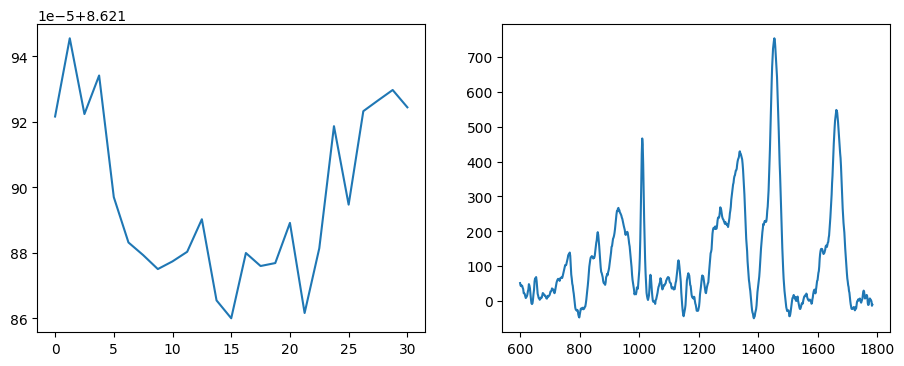

Send: MOVE X=33936.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.50611710548401
Position =  12.49329517467571


<Figure size 640x480 with 0 Axes>

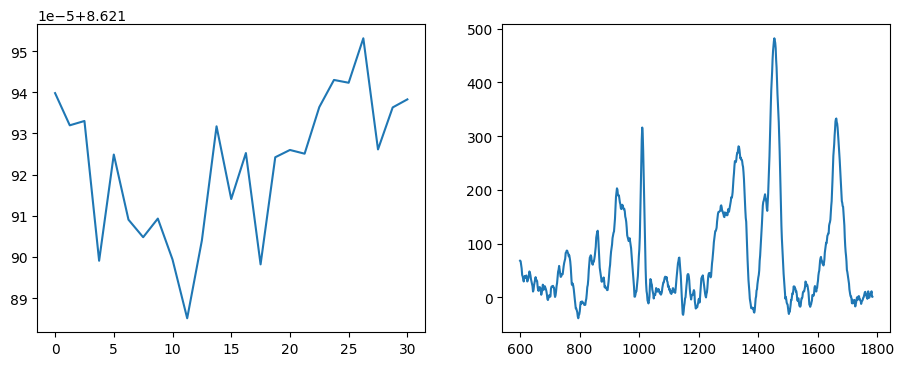

Send: MOVE X=39515.0 Y=-142473.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.67654585838318
Position =  8.789376906179344


<Figure size 640x480 with 0 Axes>

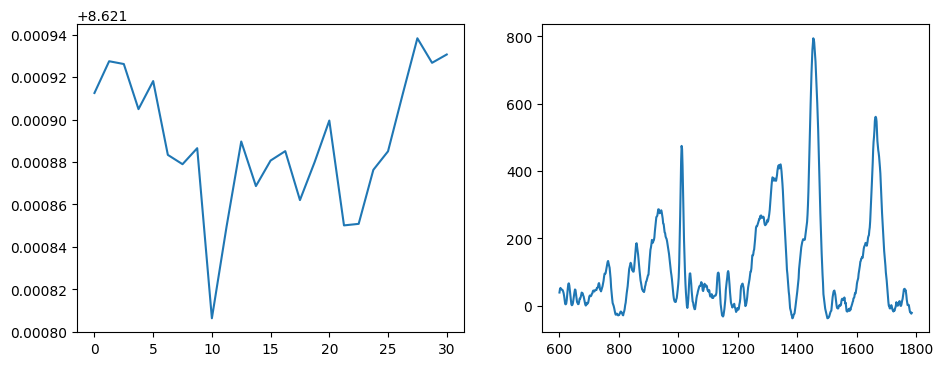

In [20]:
#Perform rough autofocusing on a grid
for q in range(spot_num):
    x_grid_1 = (x_pos[q] + x_min[q])/2
    x_grid_2 = x_pos[q]
    x_grid_3 = (x_max[q] + x_pos[q])/2
    x_grid = (x_grid_1, x_grid_2, x_grid_3)
    y_grid_1 = (y_min[q] + y_pos[q])/2
    y_grid_2 = y_pos[q]
    y_grid_3 = (y_pos[q] + y_max[q])/2
    y_grid = (y_grid_1, y_grid_2, y_grid_3)
#for 3 spot diagonal for each sample:
    for r in range(3):
        ms2k.move(x_grid[r],y_grid[r])
        ms2k.wait_for_device()
        time.sleep(0.75)
        singlespectra(10)
#for 9 spot grid for each sample:
    #for r in range(3):
        #for t in range(3):
            #ms2k.move(x_grid[r],y_grid[t])
            #ms2k.wait_for_device()
            #time.sleep(0.75)
            #singlespectra(10)

Send: MOVE X=22579.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.548885345458984
Position =  2.5415709154043182


<Figure size 640x480 with 0 Axes>

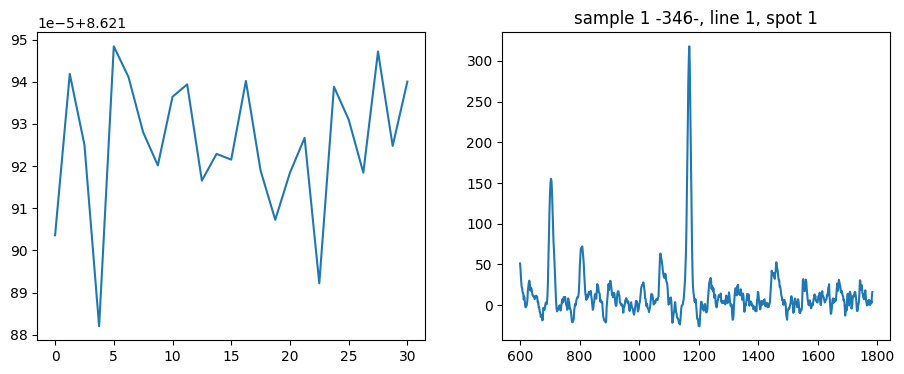

Send: MOVE X=23038.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.535240173339844
Position =  9.996732865624441


<Figure size 640x480 with 0 Axes>

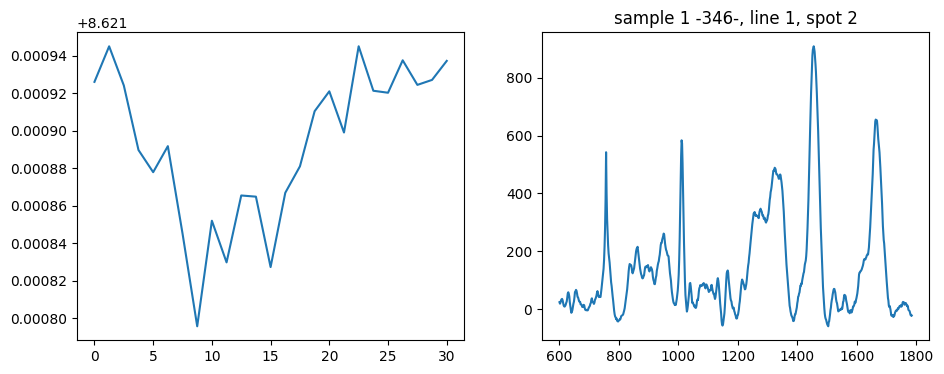

Send: MOVE X=23498.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.50386929512024
Position =  12.493403793722567


<Figure size 640x480 with 0 Axes>

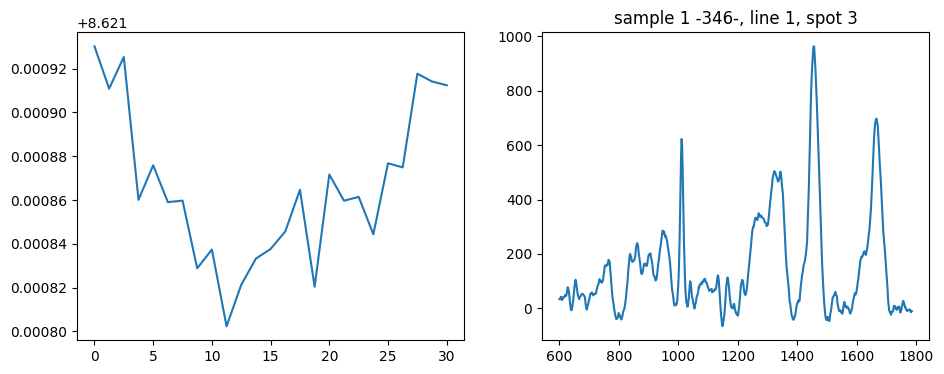

Send: MOVE X=23957.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.617857694625854
Position =  9.99646038023258


<Figure size 640x480 with 0 Axes>

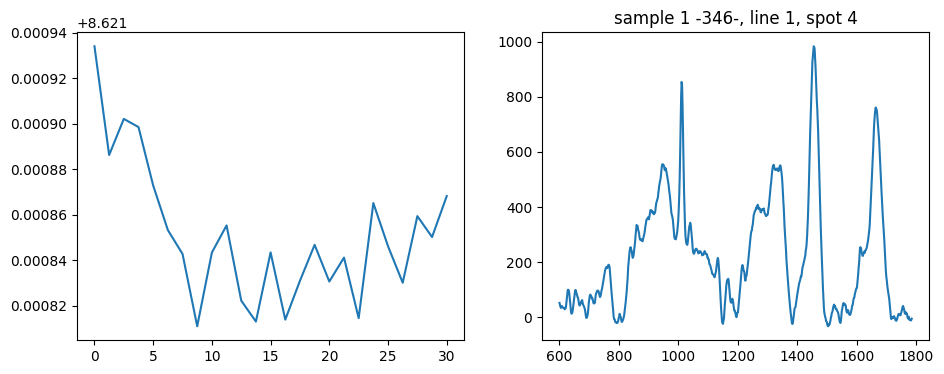

Send: MOVE X=24417.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.549390077590942
Position =  9.996514877434171


<Figure size 640x480 with 0 Axes>

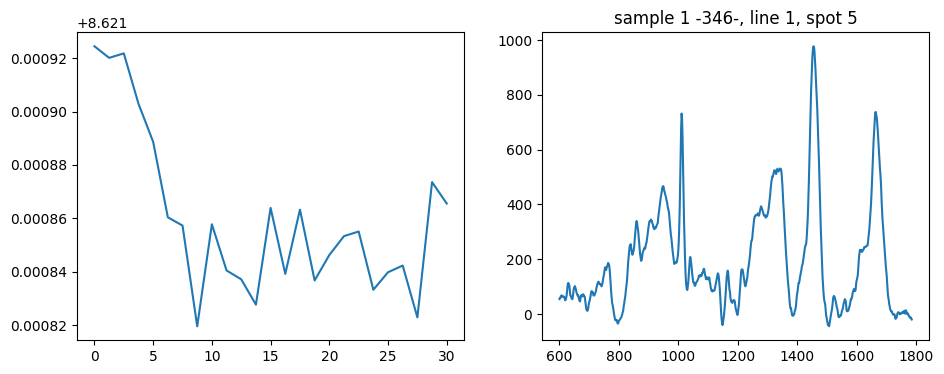

Send: MOVE X=24876.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.564207077026367
Position =  9.996732865747655


<Figure size 640x480 with 0 Axes>

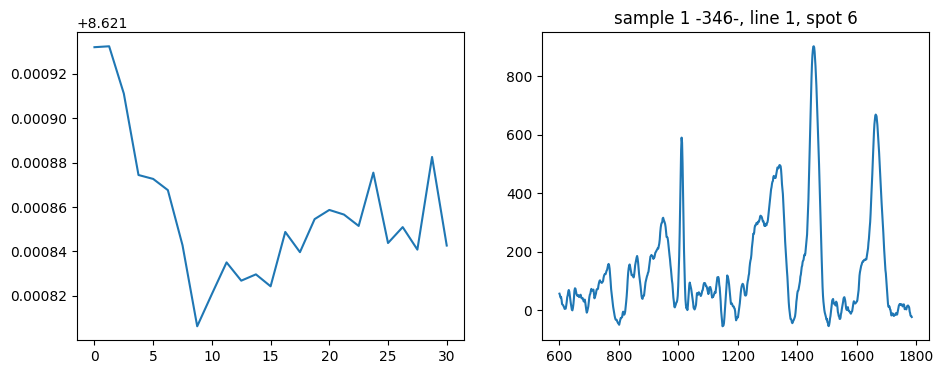

Send: MOVE X=25336.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.40354323387146
Position =  14.9965594820593


<Figure size 640x480 with 0 Axes>

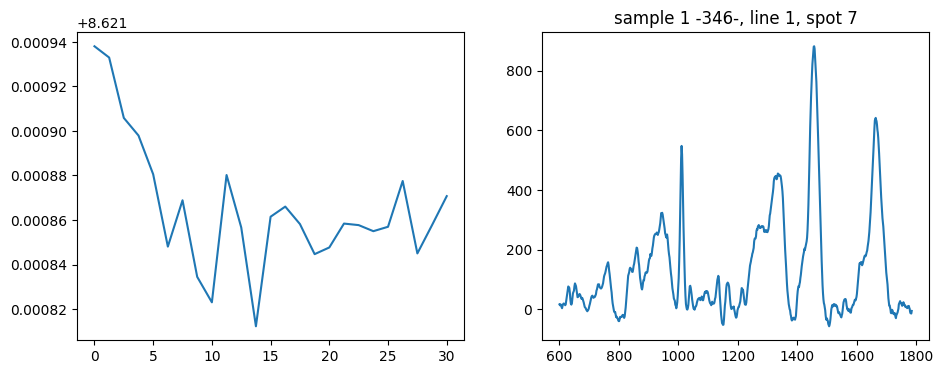

Send: MOVE X=25795.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.56119441986084
Position =  16.2462123478867


<Figure size 640x480 with 0 Axes>

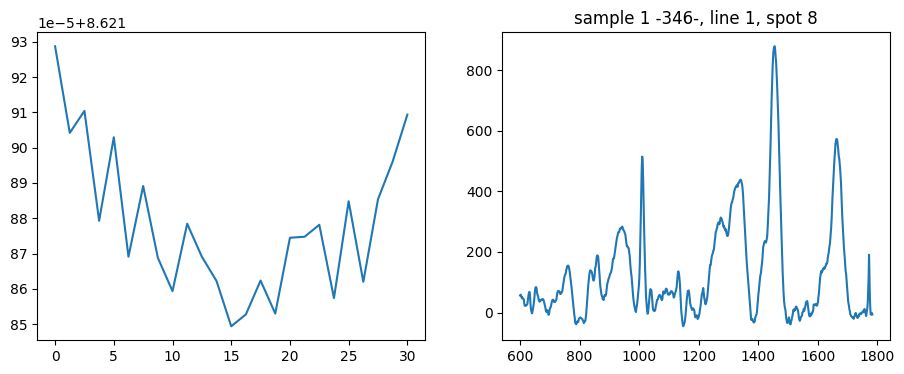

Send: MOVE X=26255.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.507283449172974
Position =  20.02351055756668


<Figure size 640x480 with 0 Axes>

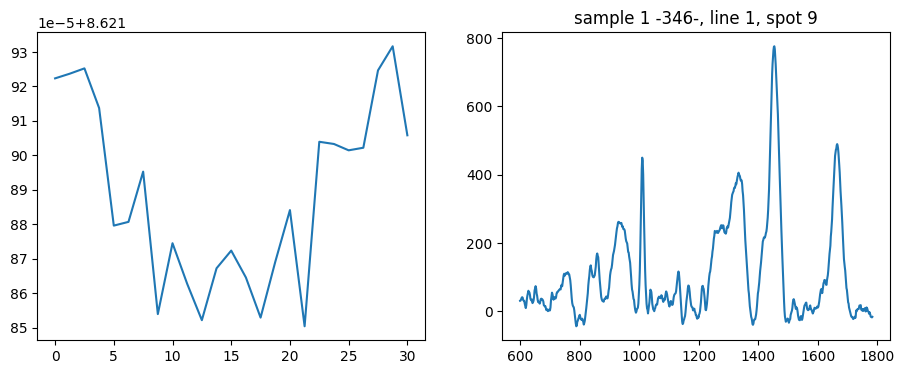

Send: MOVE X=26714.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.600769996643066
Position =  9.996460380355796


<Figure size 640x480 with 0 Axes>

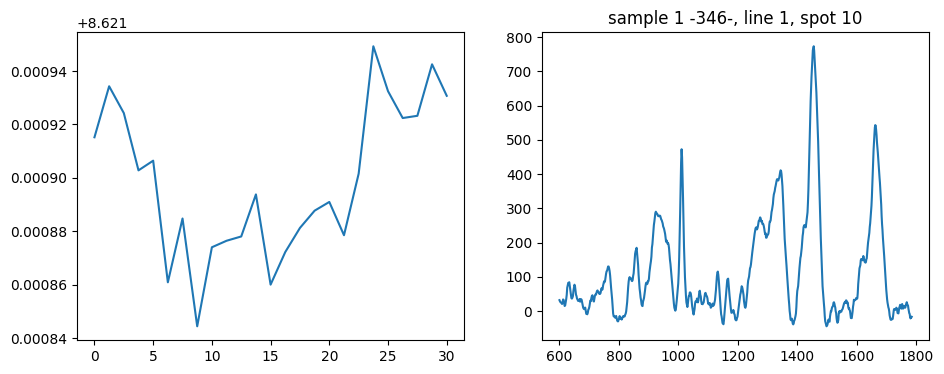

Send: MOVE X=27174.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.42499542236328
Position =  17.53331699106918


<Figure size 640x480 with 0 Axes>

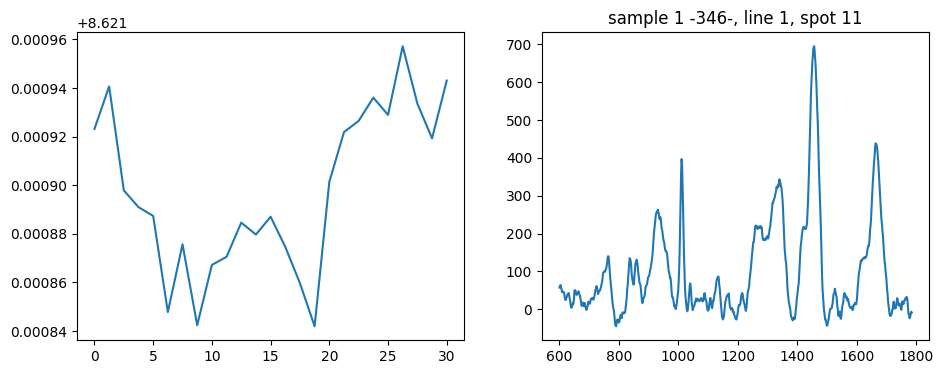

Send: MOVE X=27633.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.657235145568848
Position =  9.996351386075833


<Figure size 640x480 with 0 Axes>

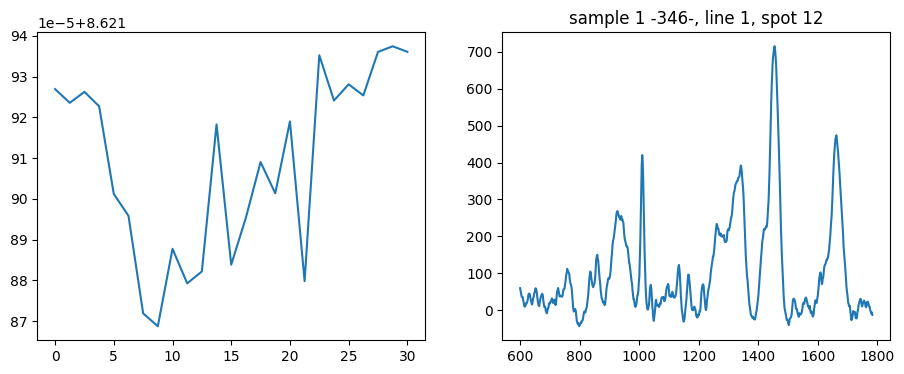

Send: MOVE X=28093.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.429645538330078
Position =  12.52126406913227


<Figure size 640x480 with 0 Axes>

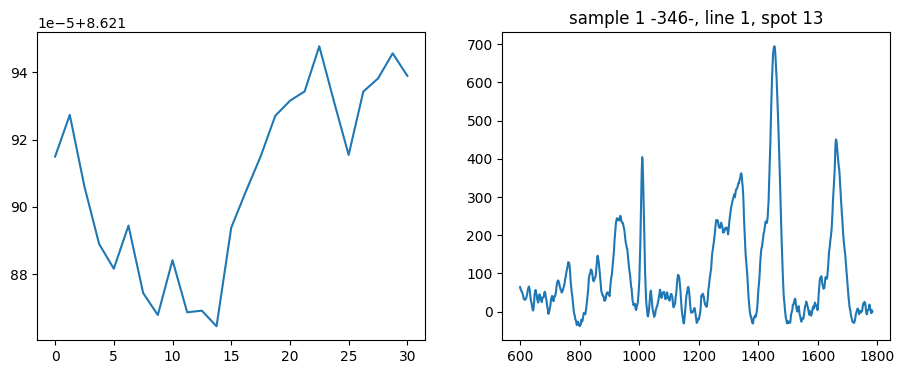

Send: MOVE X=28552.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.632994890213013
Position =  7.496989403461949


<Figure size 640x480 with 0 Axes>

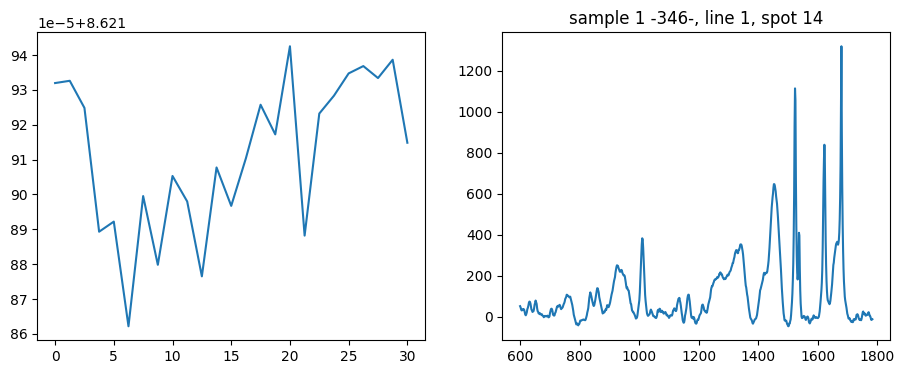

Send: MOVE X=29012.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.51602029800415
Position =  11.283735611153249


<Figure size 640x480 with 0 Axes>

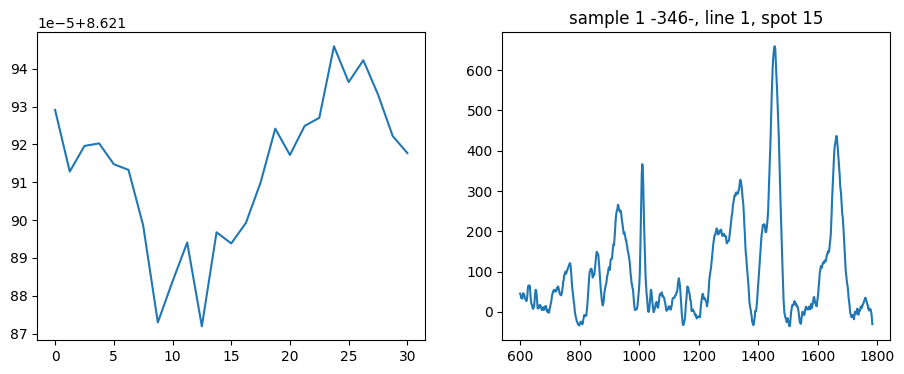

Send: MOVE X=29471.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.63314962387085
Position =  12.527183562563978


<Figure size 640x480 with 0 Axes>

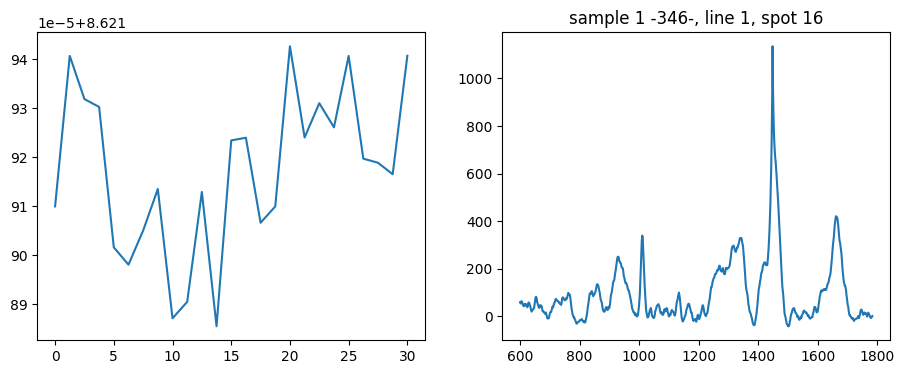

Send: MOVE X=29931.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.530653715133667
Position =  6.2732770981557975


<Figure size 640x480 with 0 Axes>

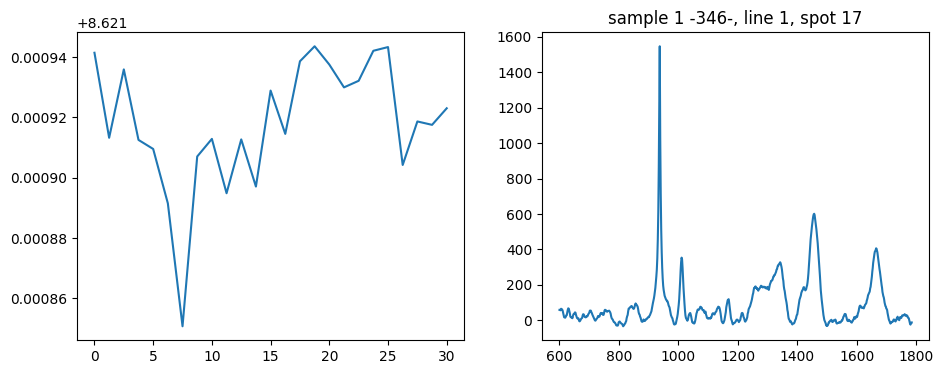

Send: MOVE X=30390.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.512349605560303
Position =  10.043598857221365


<Figure size 640x480 with 0 Axes>

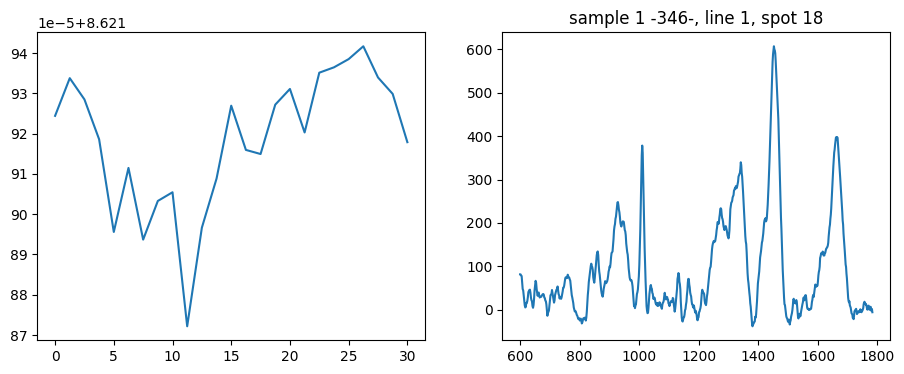

Send: MOVE X=30850.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.426578044891357
Position =  5.023444911009152


<Figure size 640x480 with 0 Axes>

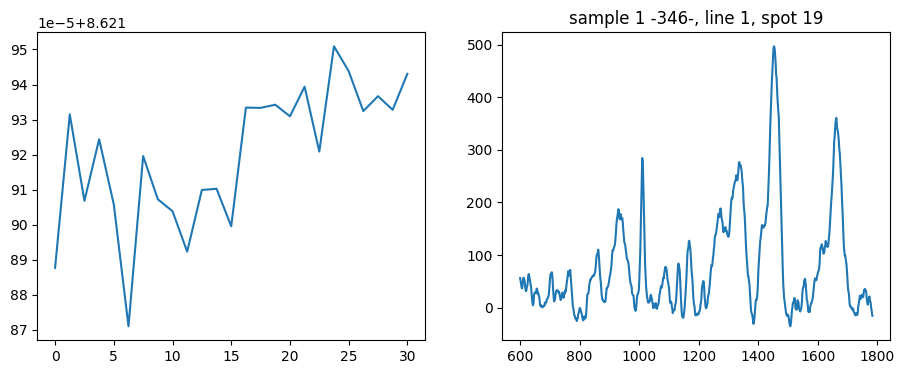

Send: MOVE X=31309.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.355353593826294
Position =  7.523292963477599


<Figure size 640x480 with 0 Axes>

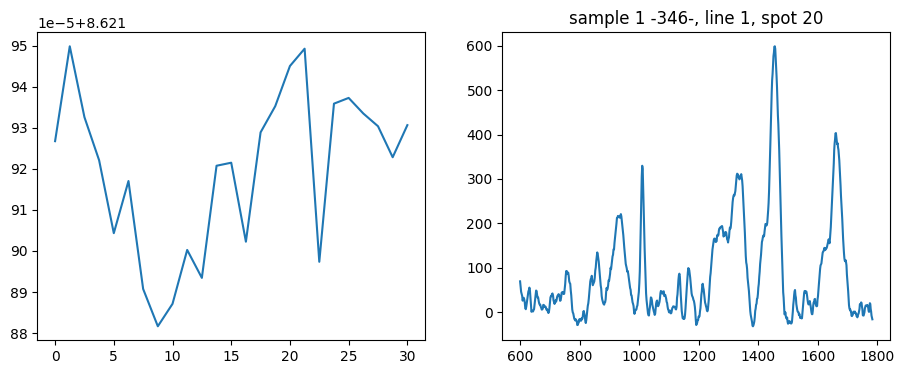

Send: MOVE X=31769.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.4024178981781
Position =  5.020865803588828


<Figure size 640x480 with 0 Axes>

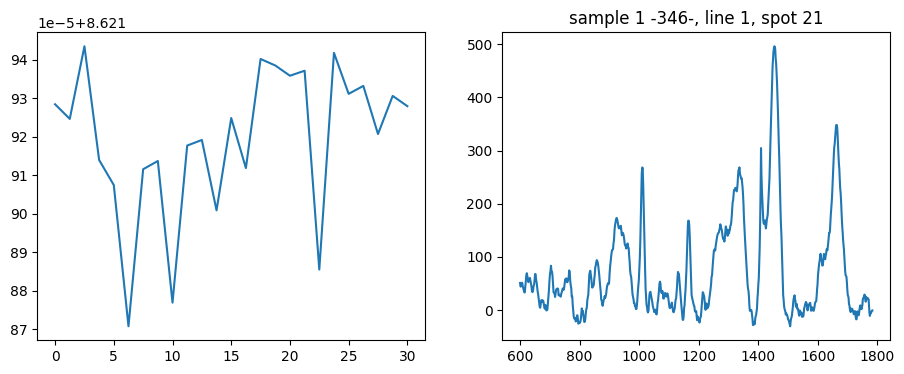

Send: MOVE X=32228.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.481794118881226
Position =  18.780415157351175


<Figure size 640x480 with 0 Axes>

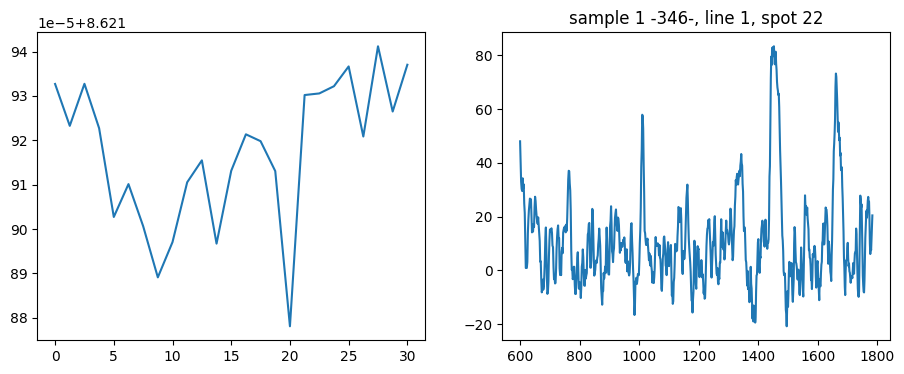

Send: MOVE X=32688.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.353784799575806
Position =  6.281493925213291


<Figure size 640x480 with 0 Axes>

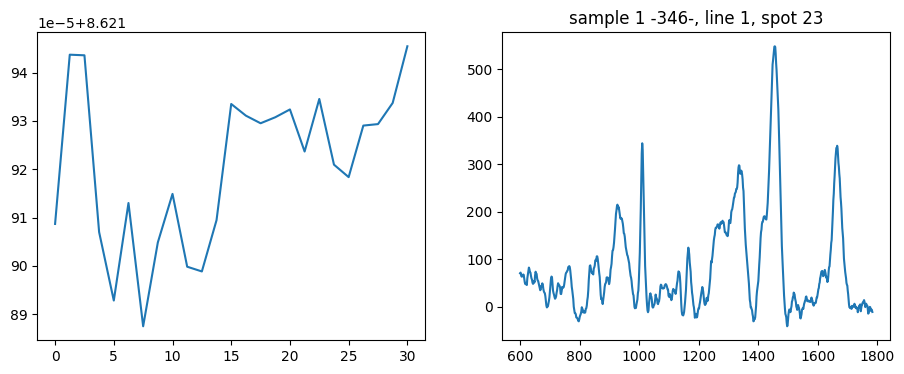

Send: MOVE X=33147.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.440008640289307
Position =  11.281341994009226


<Figure size 640x480 with 0 Axes>

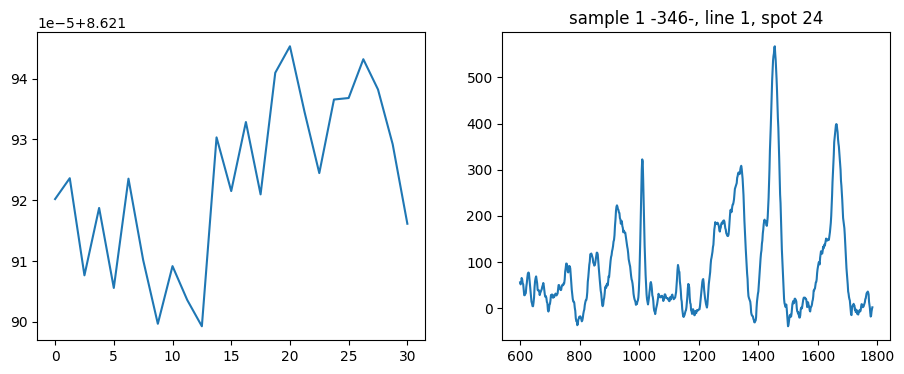

Send: MOVE X=33607.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.356356620788574
Position =  12.49296931668146


<Figure size 640x480 with 0 Axes>

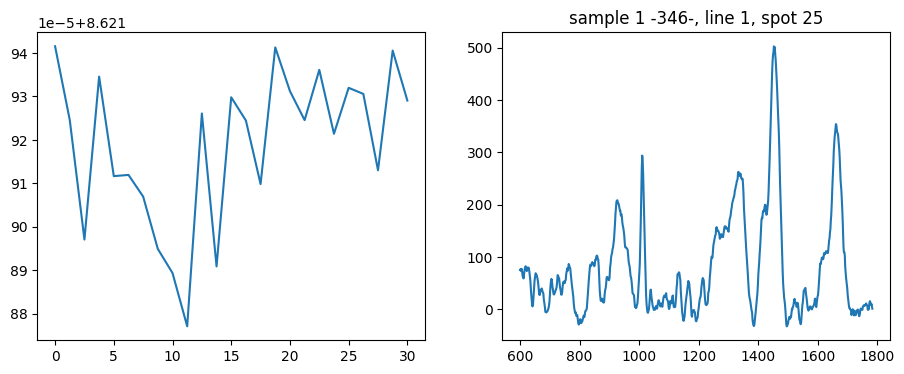

Send: MOVE X=34066.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.349663734436035
Position =  6.245339172970278


<Figure size 640x480 with 0 Axes>

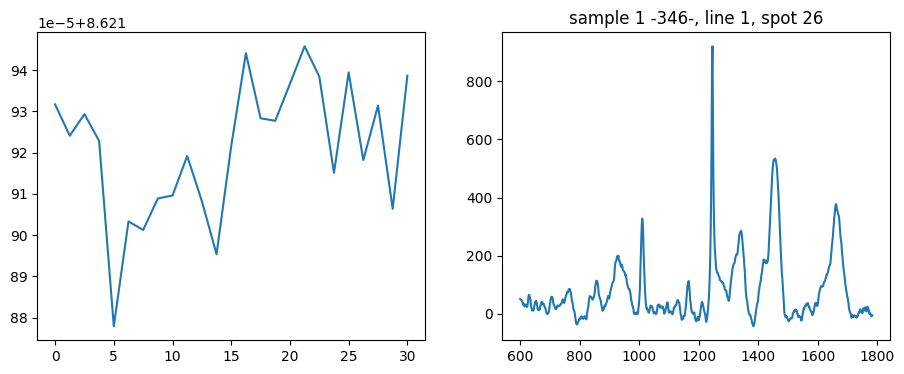

Send: MOVE X=34526.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.290581703186035
Position =  8.768414713676016


<Figure size 640x480 with 0 Axes>

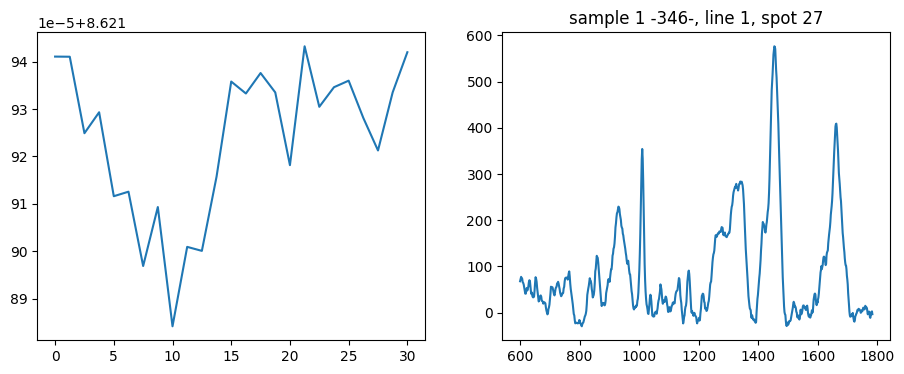

Send: MOVE X=34985.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.39693260192871
Position =  2.528630559519866


<Figure size 640x480 with 0 Axes>

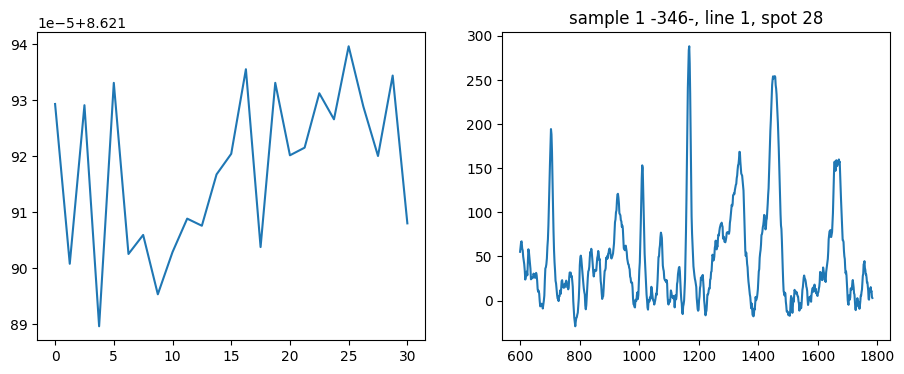

Send: MOVE X=35445.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.314608335494995
Position =  11.276065133545075


<Figure size 640x480 with 0 Axes>

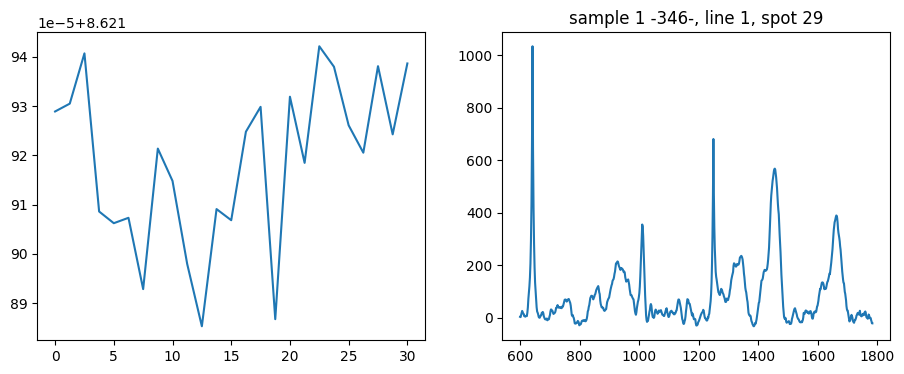

Send: MOVE X=35904.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.474499702453613
Position =  8.783372168560428


<Figure size 640x480 with 0 Axes>

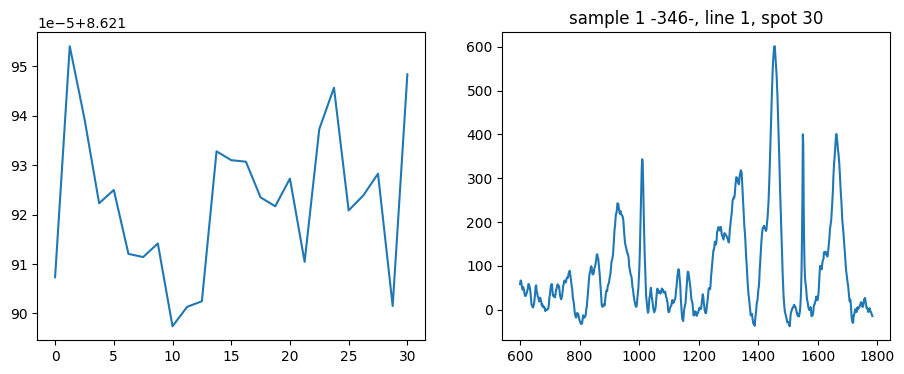

Send: MOVE X=36364.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.354527950286865
Position =  29.996023060431234


<Figure size 640x480 with 0 Axes>

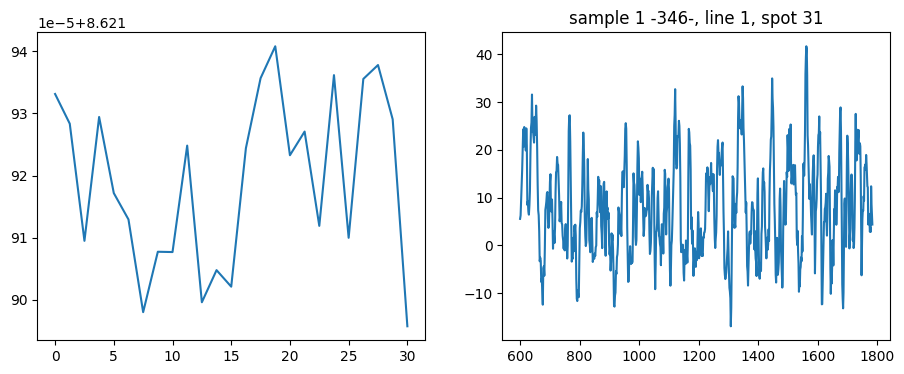

Send: MOVE X=36823.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.326818466186523
Position =  8.78435476561194


<Figure size 640x480 with 0 Axes>

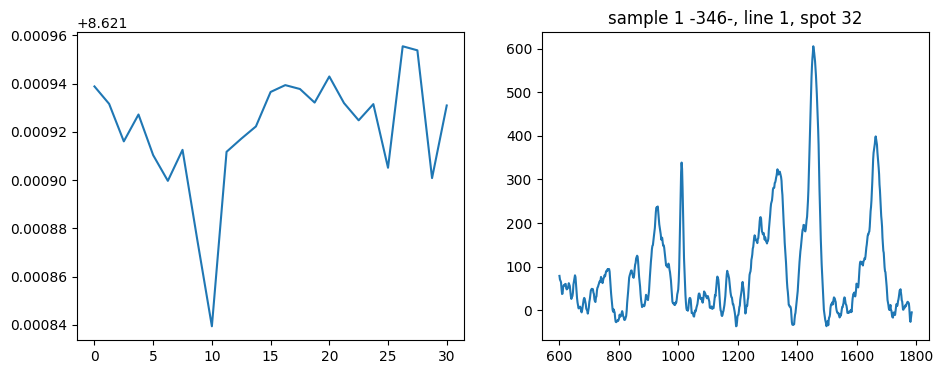

Send: MOVE X=37283.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.37472629547119
Position =  7.496880030904566


<Figure size 640x480 with 0 Axes>

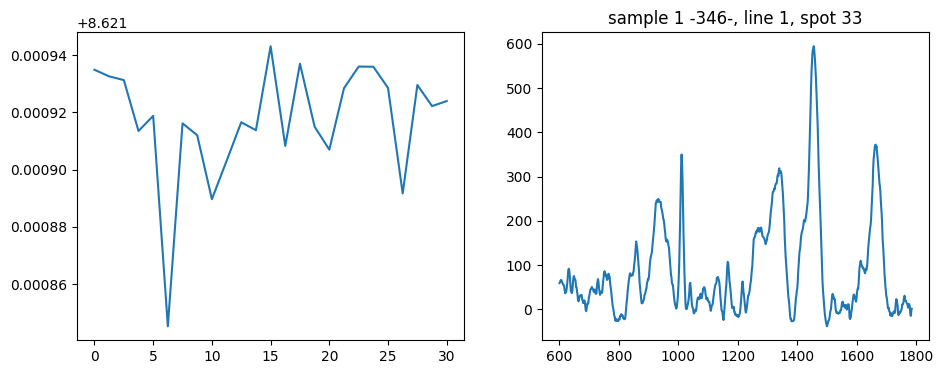

Send: MOVE X=37742.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.350404500961304
Position =  9.996678368299628


<Figure size 640x480 with 0 Axes>

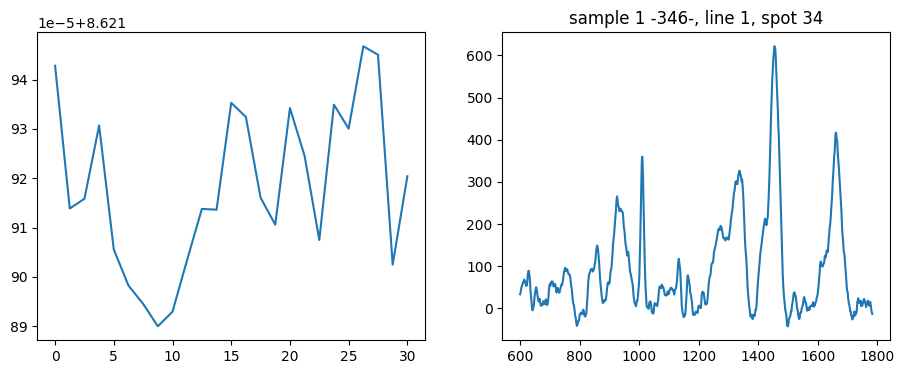

Send: MOVE X=38202.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.394094467163086
Position =  7.495895678759695


<Figure size 640x480 with 0 Axes>

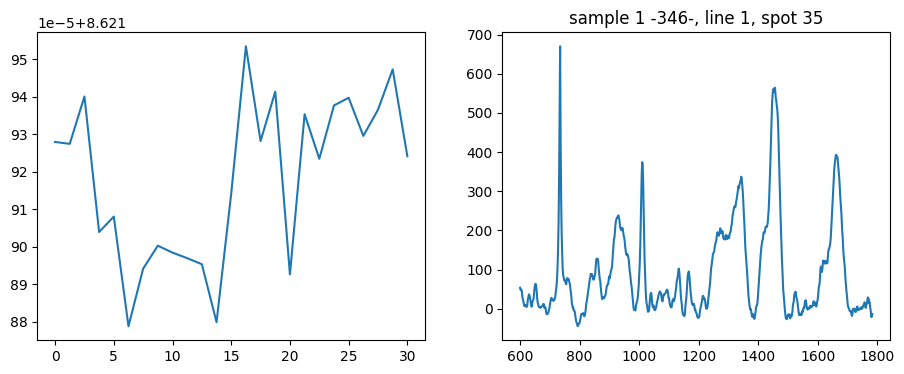

Send: MOVE X=38661.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.39184021949768
Position =  6.268675632114447


<Figure size 640x480 with 0 Axes>

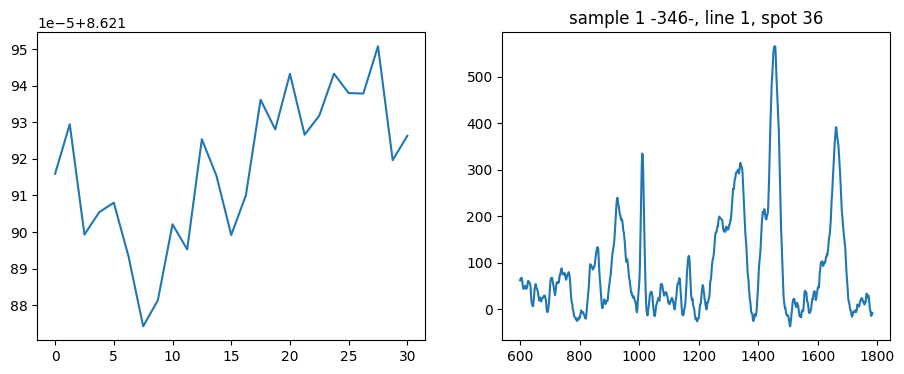

Send: MOVE X=39121.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.229193687438965
Position =  11.274813912231913


<Figure size 640x480 with 0 Axes>

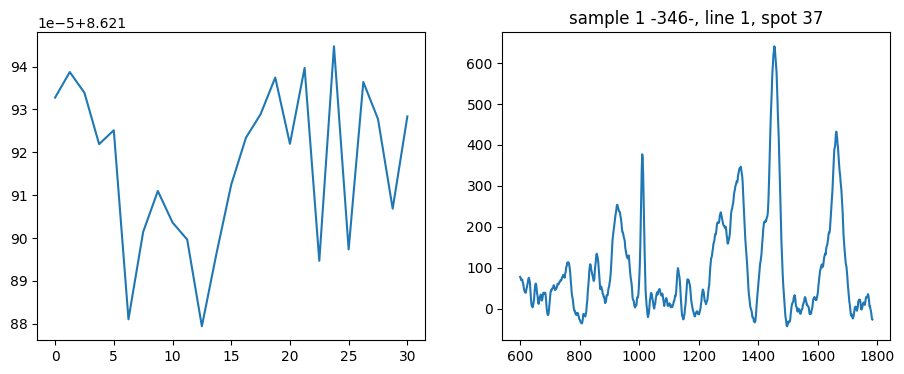

Send: MOVE X=39580.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.31986093521118
Position =  12.534677898040634


<Figure size 640x480 with 0 Axes>

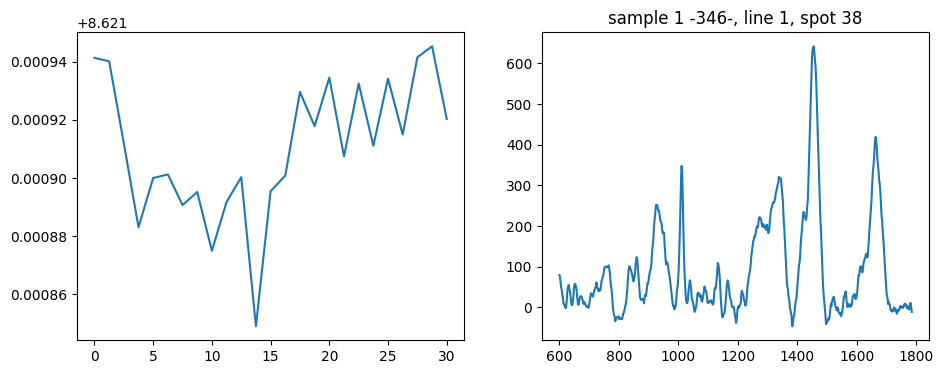

Send: MOVE X=40040.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.295648336410522
Position =  7.533136040089248


<Figure size 640x480 with 0 Axes>

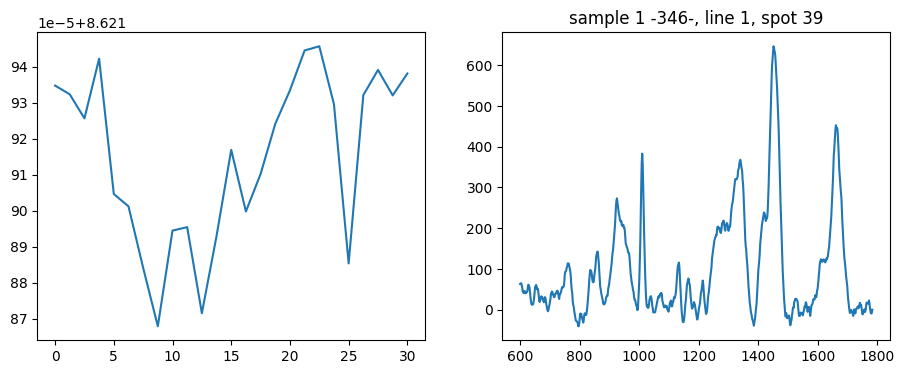

Send: MOVE X=40499.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.311820030212402
Position =  8.775565943486146


<Figure size 640x480 with 0 Axes>

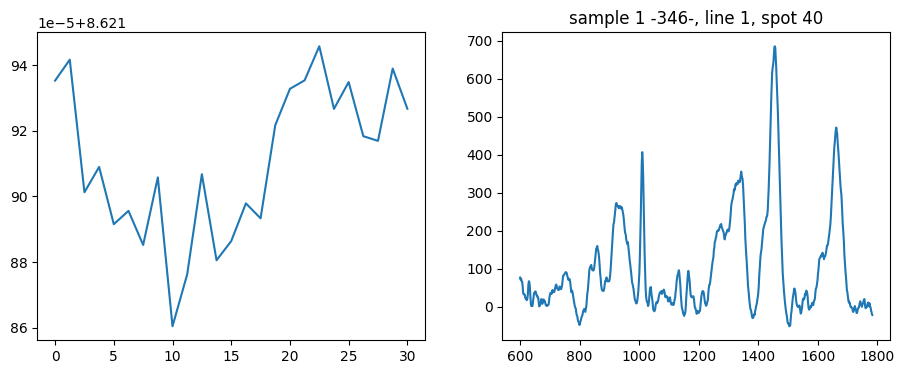

Send: MOVE X=40959.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.391215324401855
Position =  11.273181883728729


<Figure size 640x480 with 0 Axes>

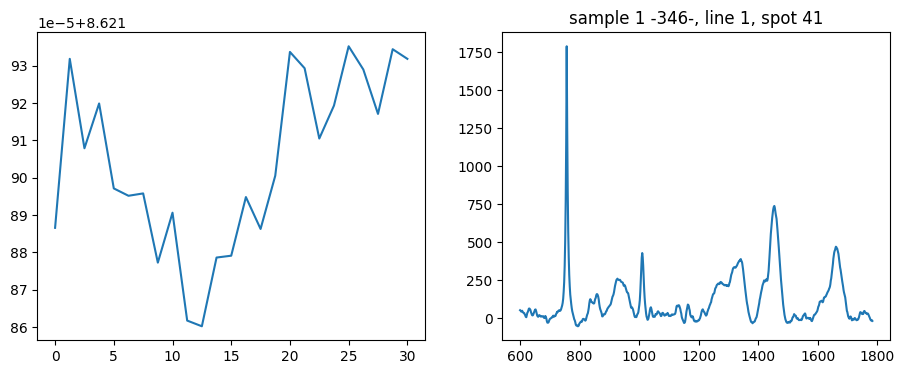

Send: MOVE X=41418.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.33837103843689
Position =  14.996559482662803


<Figure size 640x480 with 0 Axes>

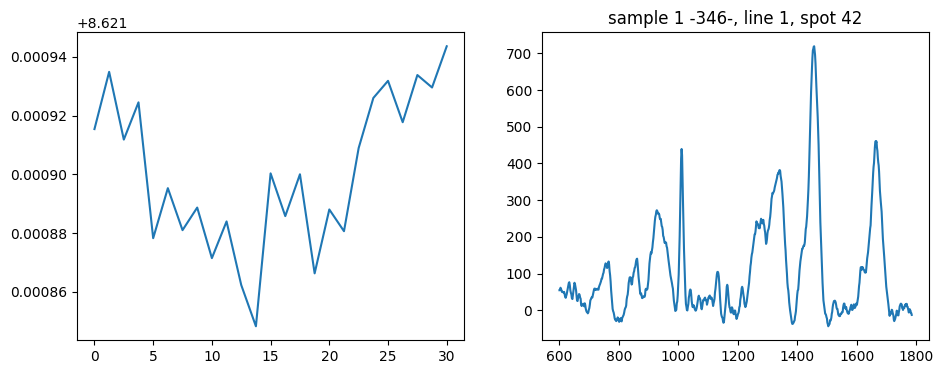

Send: MOVE X=41878.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.459811687469482
Position =  18.742508682111964


<Figure size 640x480 with 0 Axes>

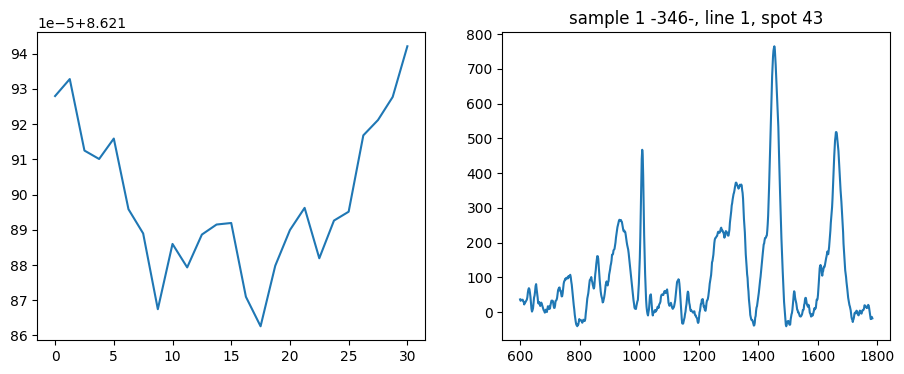

Send: MOVE X=42337.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.391099452972412
Position =  11.242879856037634


<Figure size 640x480 with 0 Axes>

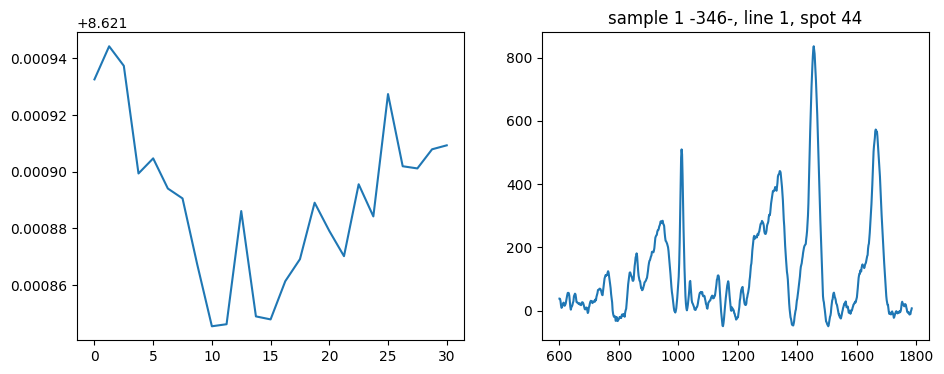

Send: MOVE X=42797.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.294222354888916
Position =  29.995545787748082


<Figure size 640x480 with 0 Axes>

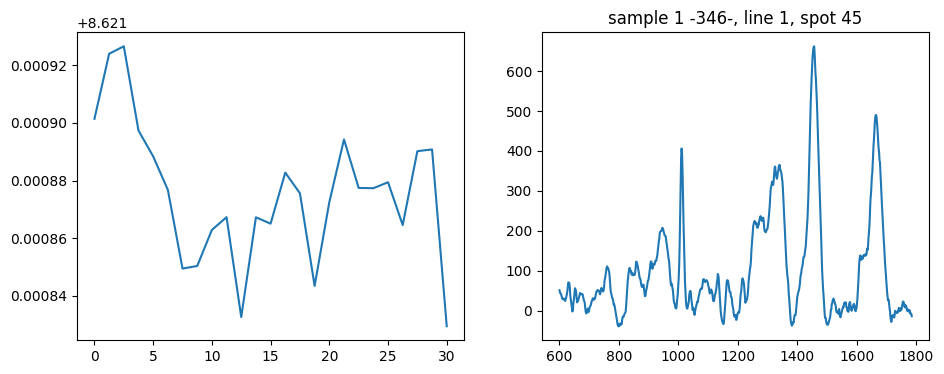

Send: MOVE X=43256.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.31983232498169
Position =  25.0329356465067


<Figure size 640x480 with 0 Axes>

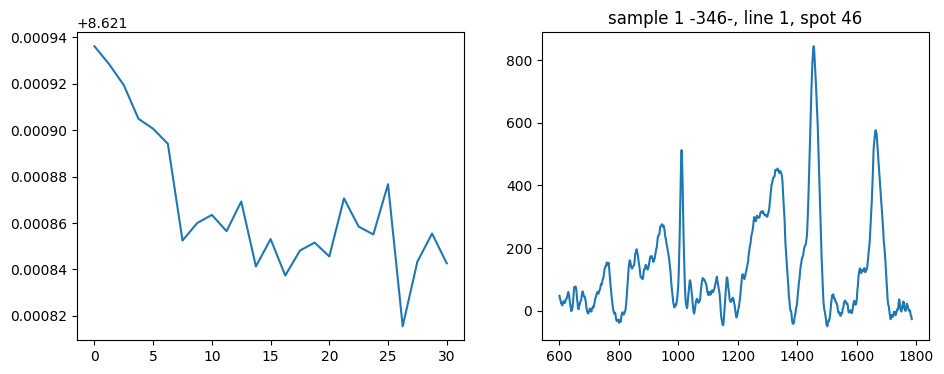

Send: MOVE X=43716.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.34384846687317
Position =  13.745191777123267


<Figure size 640x480 with 0 Axes>

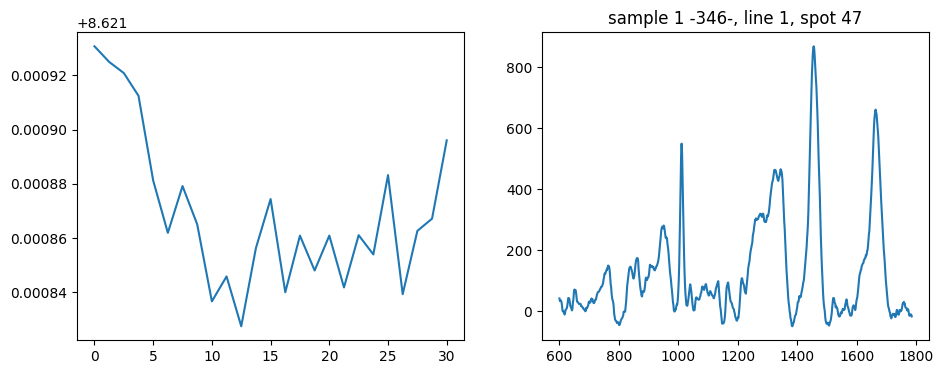

Send: MOVE X=44175.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.500443935394287
Position =  23.739732113730263


<Figure size 640x480 with 0 Axes>

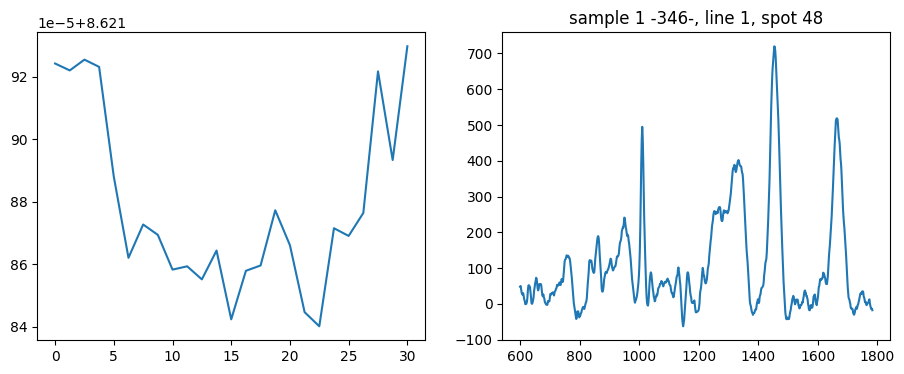

Send: MOVE X=44635.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.323516607284546
Position =  13.745137561867297


<Figure size 640x480 with 0 Axes>

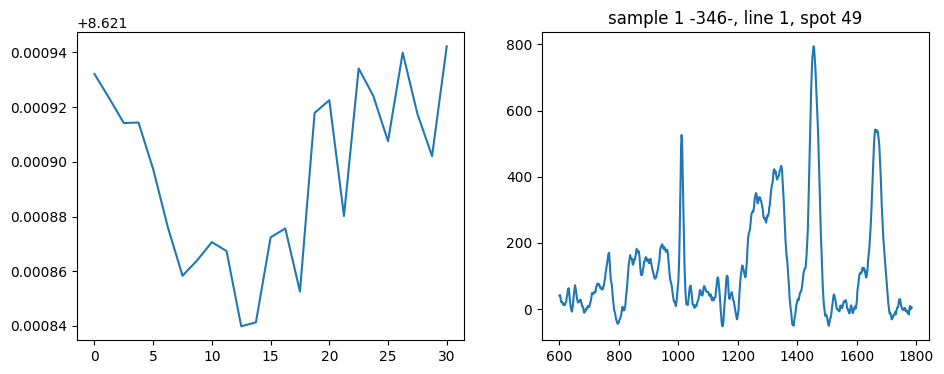

Send: MOVE X=45094.0 Y=-148310.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.3211886882782
Position =  28.763636147785075


<Figure size 640x480 with 0 Axes>

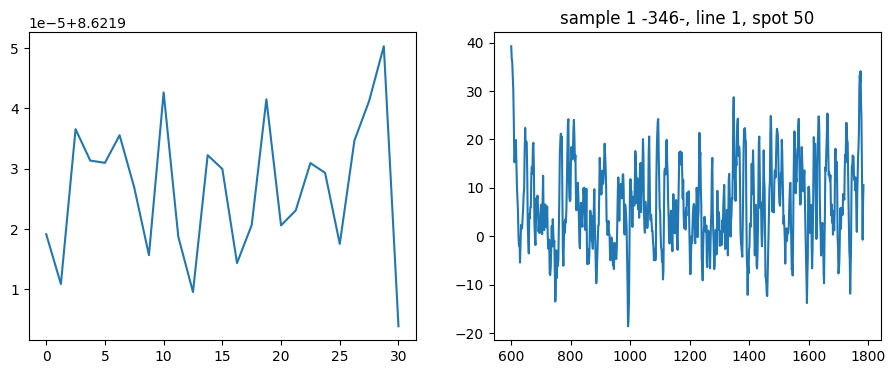

Send: MOVE X=33936.0 Y=-159372.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.271320104599
Position =  15.036446937899948


<Figure size 640x480 with 0 Axes>

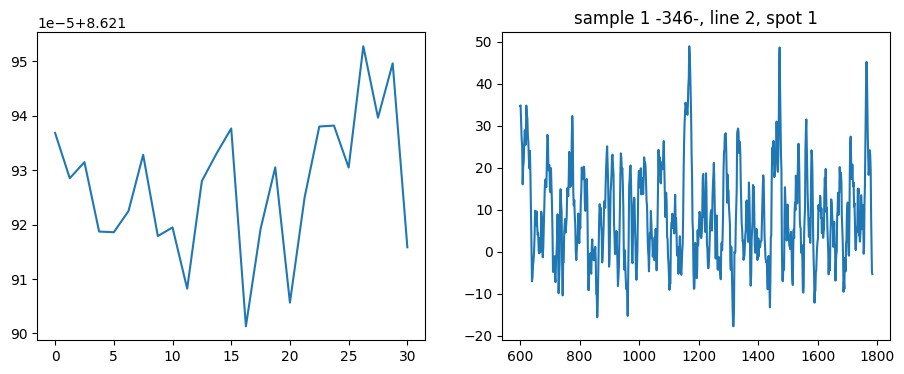

Send: MOVE X=33936.0 Y=-158908.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.422458171844482
Position =  8.773928262991694


<Figure size 640x480 with 0 Axes>

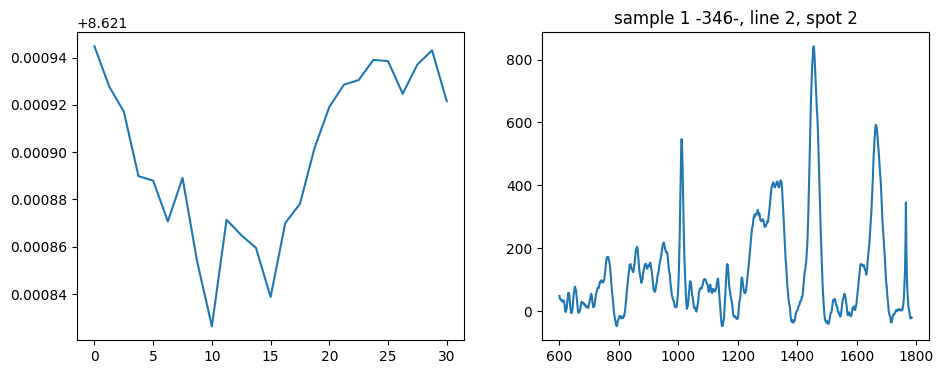

Send: MOVE X=33936.0 Y=-158444.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.333561658859253
Position =  17.518053242235677


<Figure size 640x480 with 0 Axes>

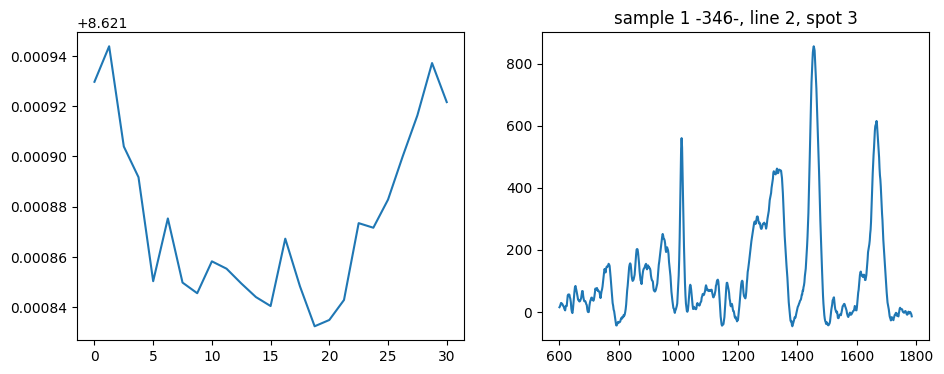

Send: MOVE X=33936.0 Y=-157980.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.485844373703003
Position =  7.523128910555361


<Figure size 640x480 with 0 Axes>

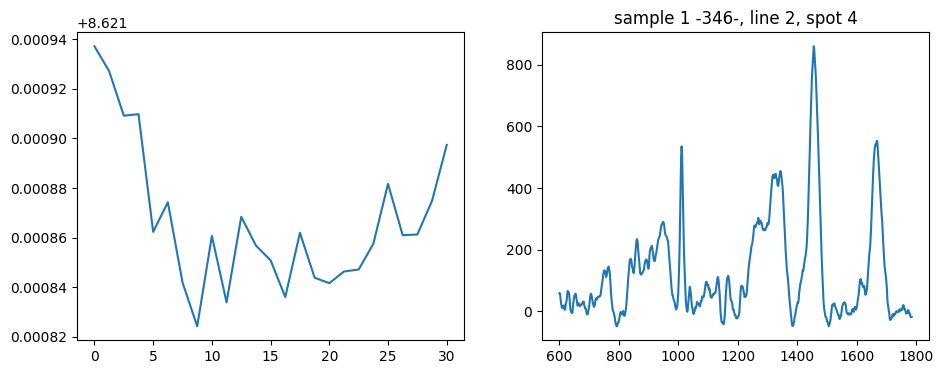

Send: MOVE X=33936.0 Y=-157516.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.588972806930542
Position =  13.78606952319292


<Figure size 640x480 with 0 Axes>

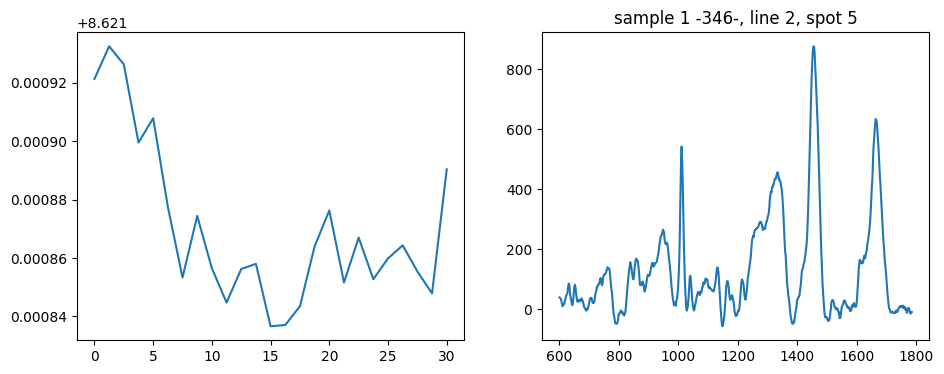

Send: MOVE X=33936.0 Y=-157052.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.358846187591553
Position =  13.74524599419911


<Figure size 640x480 with 0 Axes>

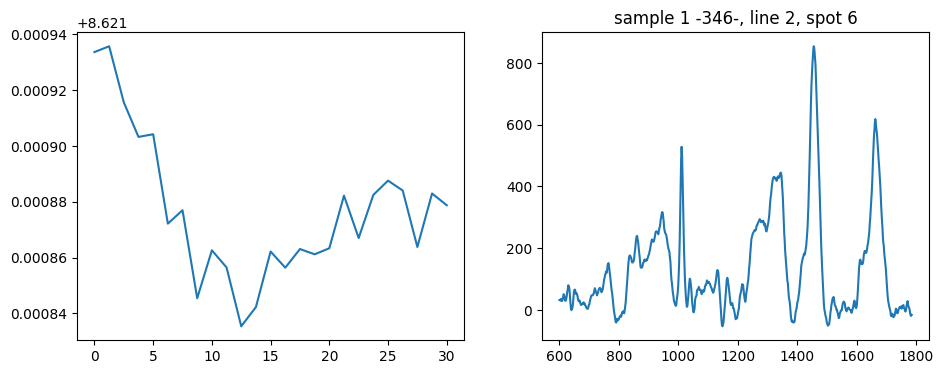

Send: MOVE X=33936.0 Y=-156588.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.538246870040894
Position =  21.24437854314001


<Figure size 640x480 with 0 Axes>

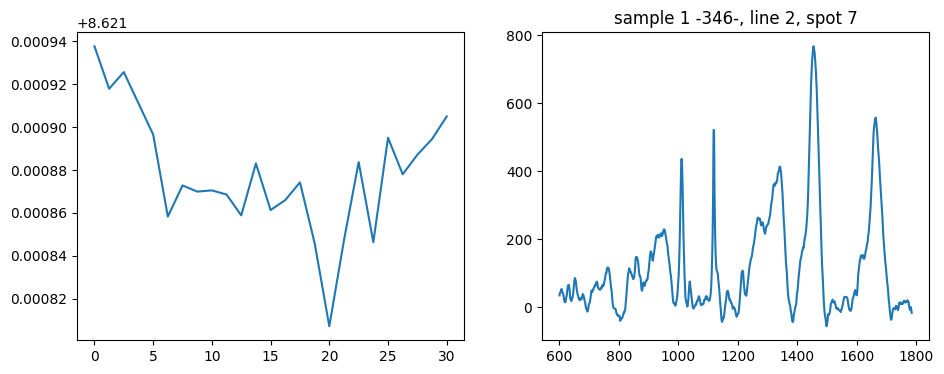

Send: MOVE X=33936.0 Y=-156124.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.34205913543701
Position =  5.037876762590554


<Figure size 640x480 with 0 Axes>

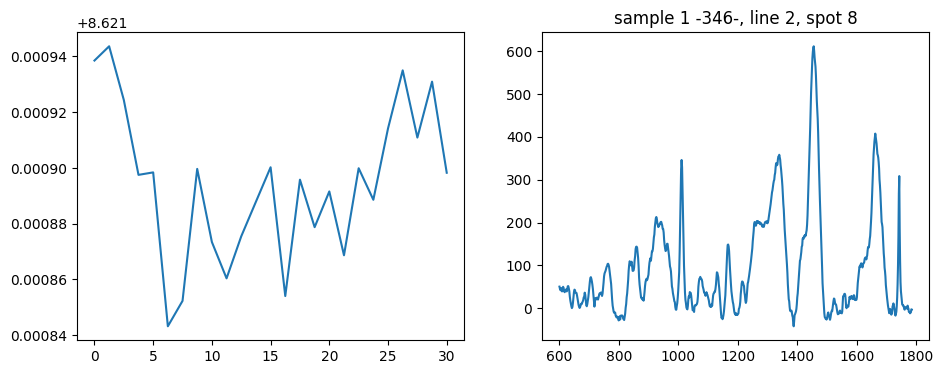

Send: MOVE X=33936.0 Y=-155660.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.49800419807434
Position =  11.243315082834167


<Figure size 640x480 with 0 Axes>

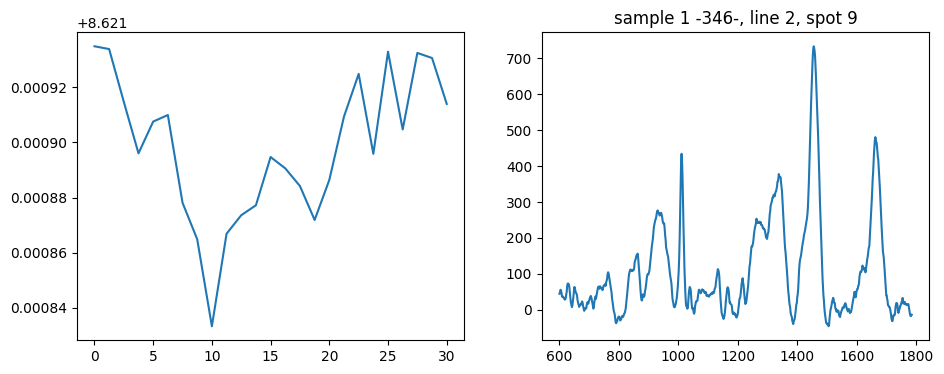

Send: MOVE X=33936.0 Y=-155196.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.45189619064331
Position =  16.279710252326502


<Figure size 640x480 with 0 Axes>

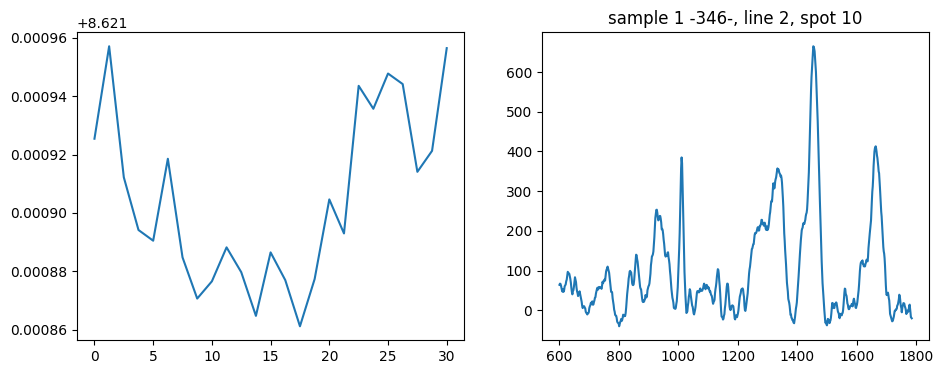

Send: MOVE X=33936.0 Y=-154732.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.537793397903442
Position =  11.243587099719916


<Figure size 640x480 with 0 Axes>

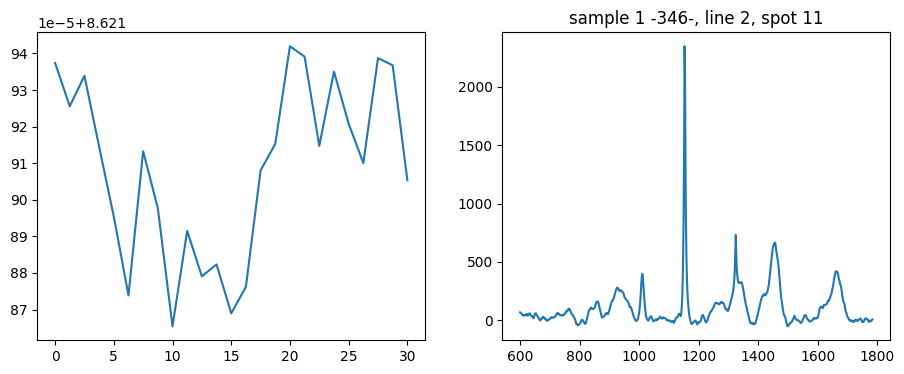

Send: MOVE X=33936.0 Y=-154268.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.236148595809937
Position =  8.744886111550517


<Figure size 640x480 with 0 Axes>

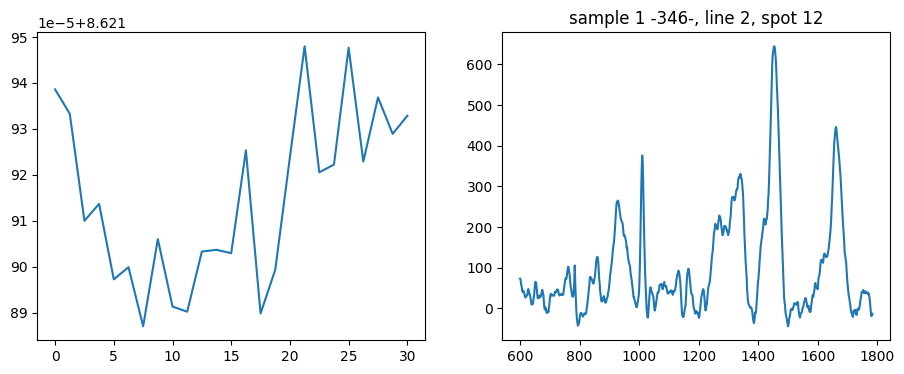

Send: MOVE X=33936.0 Y=-153804.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.522215366363525
Position =  11.243206276472144


<Figure size 640x480 with 0 Axes>

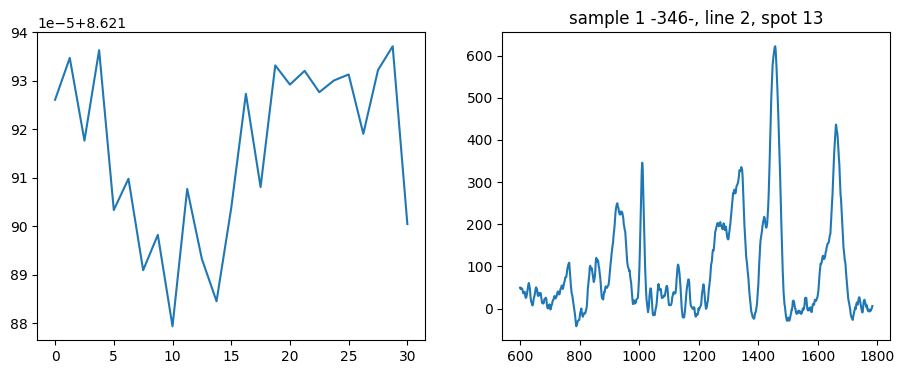

Send: MOVE X=33936.0 Y=-153340.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.41204071044922
Position =  11.243315082956753


<Figure size 640x480 with 0 Axes>

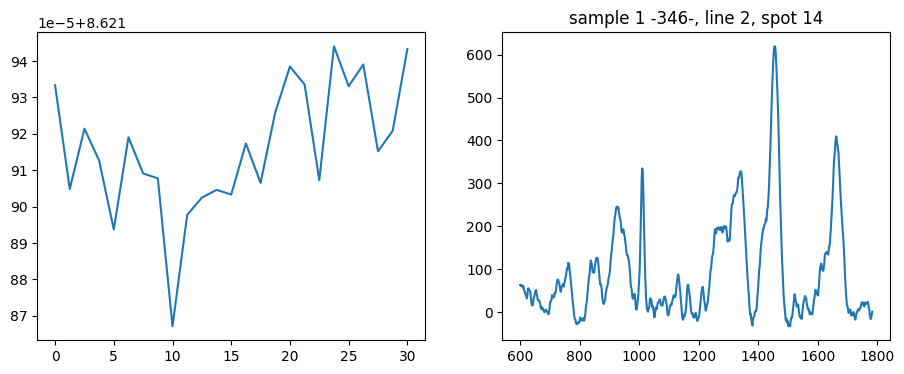

Send: MOVE X=33936.0 Y=-152876.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.541205167770386
Position =  12.493403793356707


<Figure size 640x480 with 0 Axes>

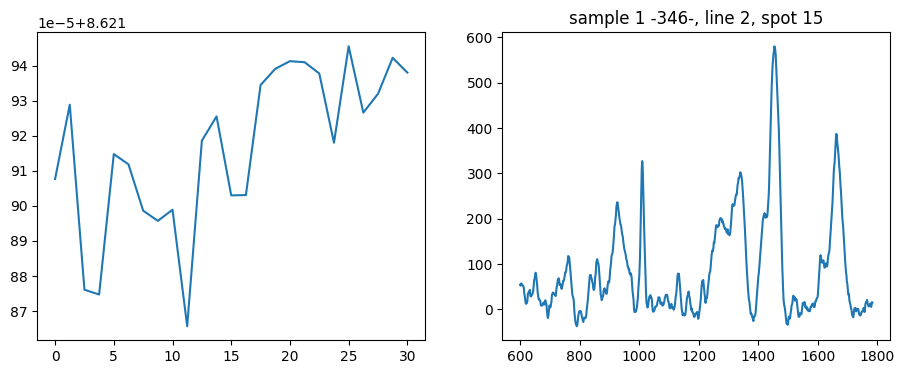

Send: MOVE X=33936.0 Y=-152412.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.45329737663269
Position =  12.525445733176158


<Figure size 640x480 with 0 Axes>

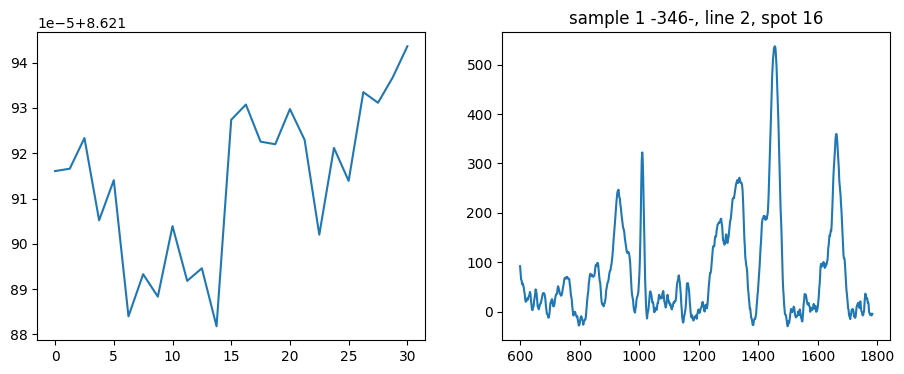

Send: MOVE X=33936.0 Y=-151948.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.485551118850708
Position =  10.035642744214506


<Figure size 640x480 with 0 Axes>

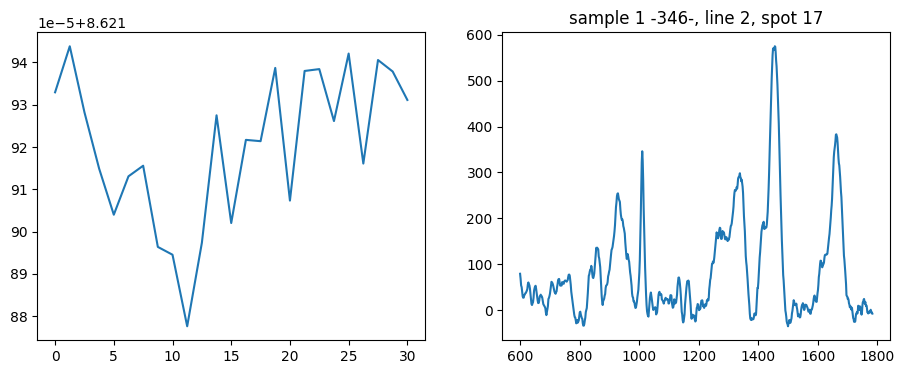

Send: MOVE X=33936.0 Y=-151484.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.443750381469727
Position =  8.775620533215745


<Figure size 640x480 with 0 Axes>

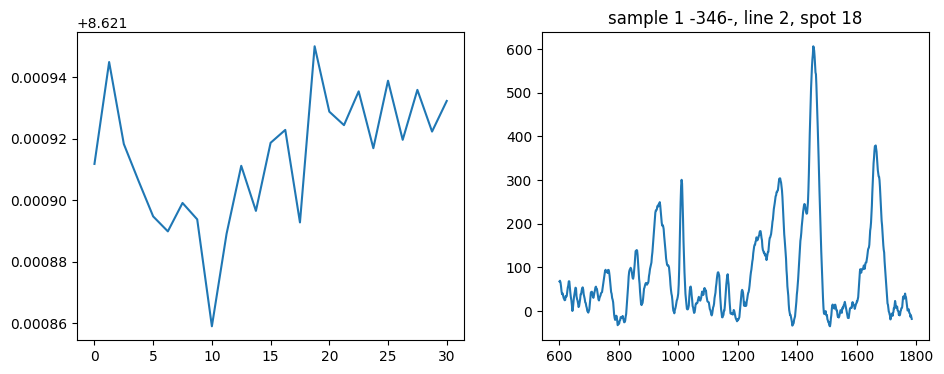

Send: MOVE X=33936.0 Y=-151020.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.5548415184021
Position =  4.995458358222136


<Figure size 640x480 with 0 Axes>

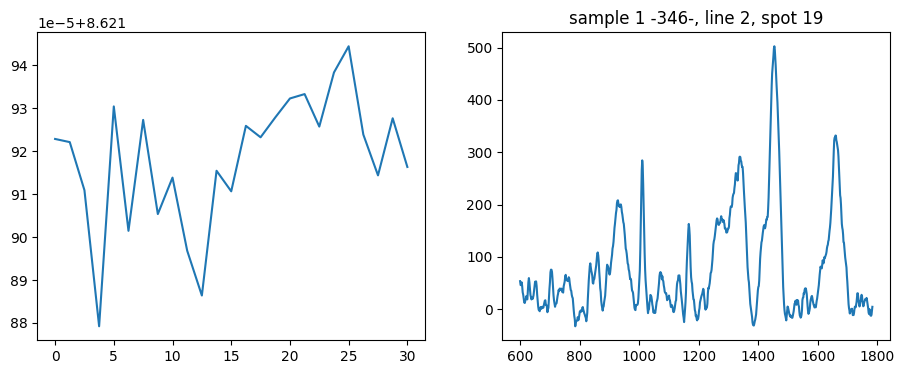

Send: MOVE X=33936.0 Y=-150556.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.36650323867798
Position =  8.744176419427124


<Figure size 640x480 with 0 Axes>

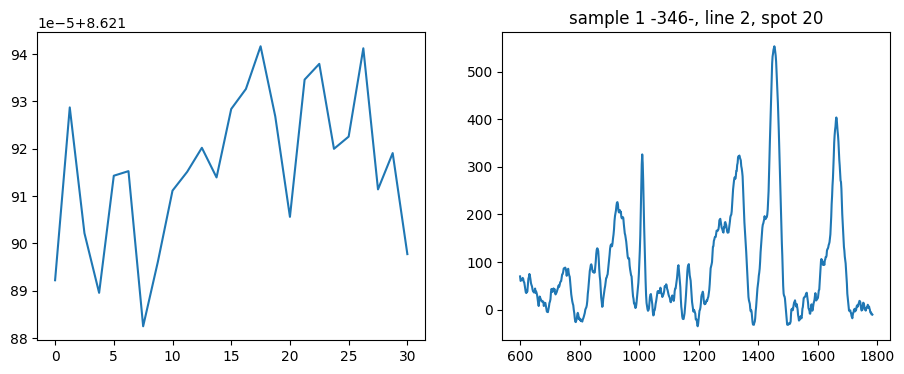

Send: MOVE X=33936.0 Y=-150092.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.418025016784668
Position =  4.995513235182231


<Figure size 640x480 with 0 Axes>

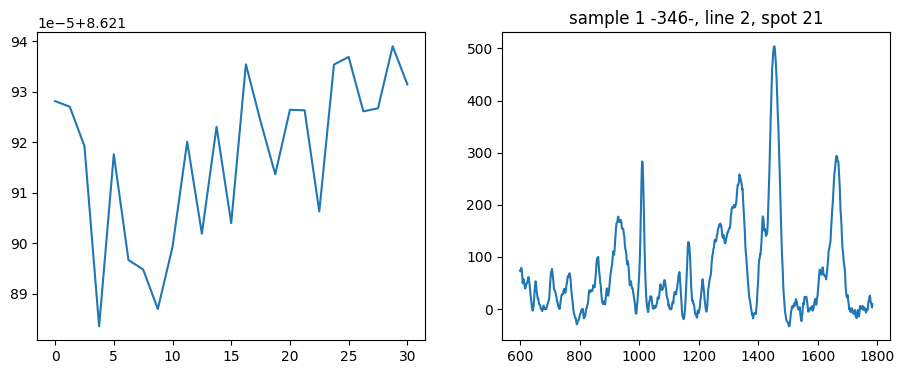

Send: MOVE X=33936.0 Y=-149628.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.268741369247437
Position =  2.495204822336456


<Figure size 640x480 with 0 Axes>

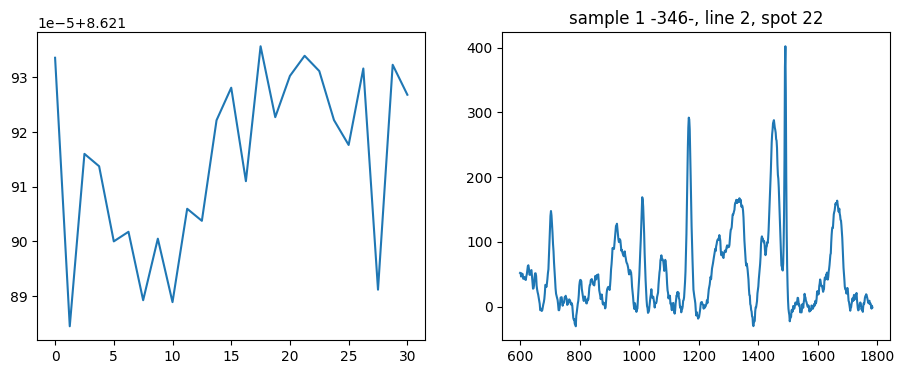

Send: MOVE X=33936.0 Y=-149164.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.409775972366333
Position =  8.744285603221366


<Figure size 640x480 with 0 Axes>

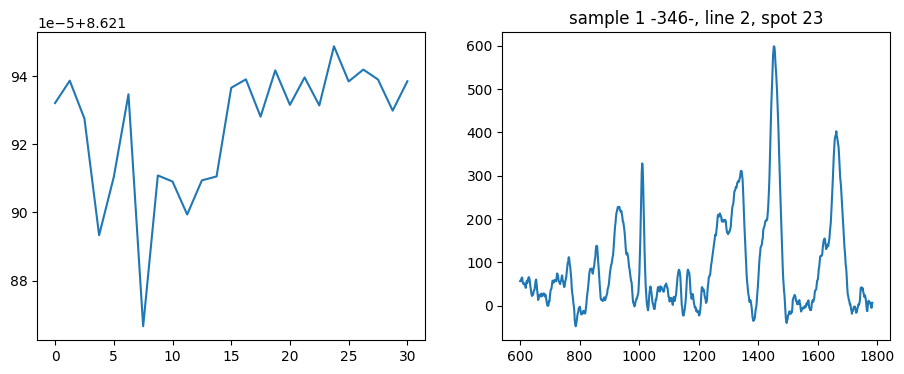

Send: MOVE X=33936.0 Y=-148700.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.26715064048767
Position =  7.52903477019147


<Figure size 640x480 with 0 Axes>

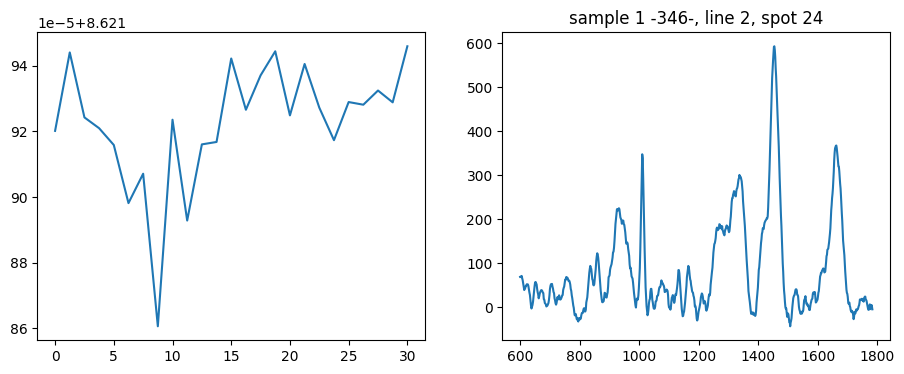

Send: MOVE X=33936.0 Y=-148236.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.468127250671387
Position =  8.774146620300124


<Figure size 640x480 with 0 Axes>

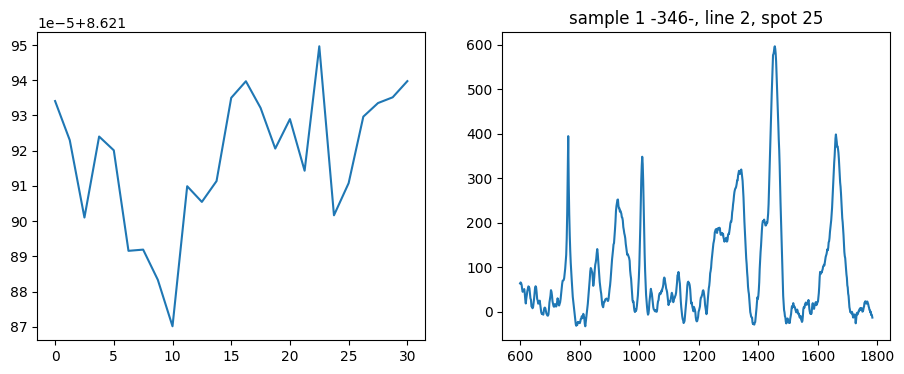

Send: MOVE X=33936.0 Y=-147772.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.322628021240234
Position =  8.744940702270952


<Figure size 640x480 with 0 Axes>

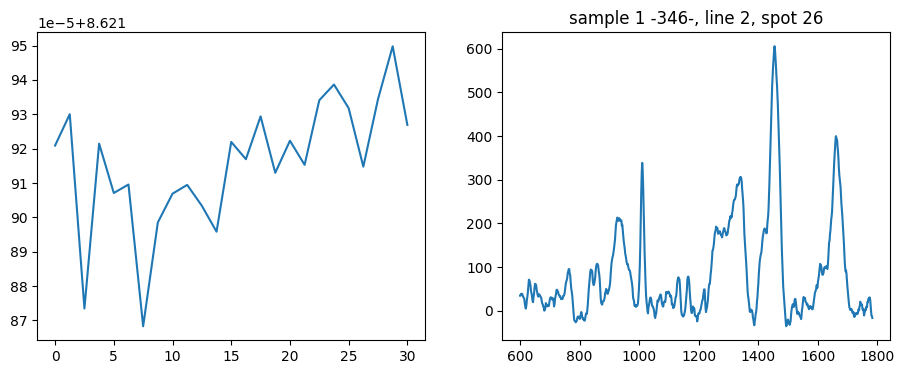

Send: MOVE X=33936.0 Y=-147308.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.510100841522217
Position =  11.243260679898325


<Figure size 640x480 with 0 Axes>

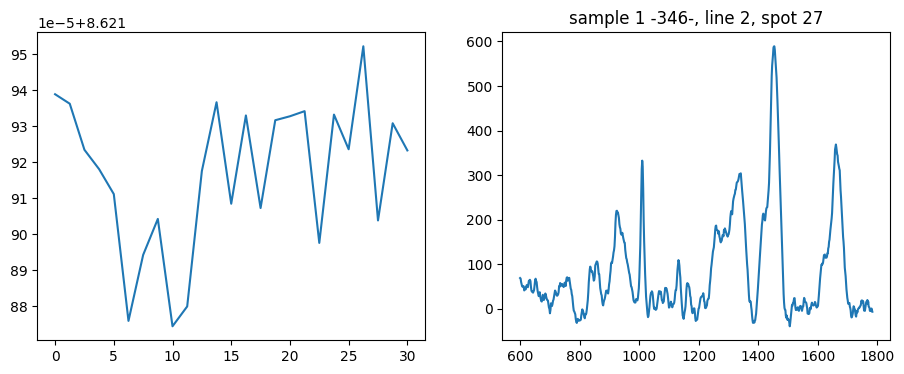

Send: MOVE X=33936.0 Y=-146844.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.340526580810547
Position =  9.996296889120684


<Figure size 640x480 with 0 Axes>

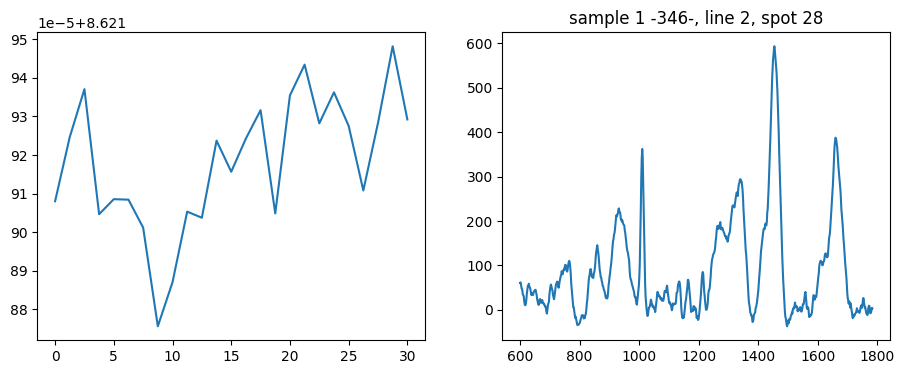

Send: MOVE X=33936.0 Y=-146380.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.508927583694458
Position =  1.283168881770286


<Figure size 640x480 with 0 Axes>

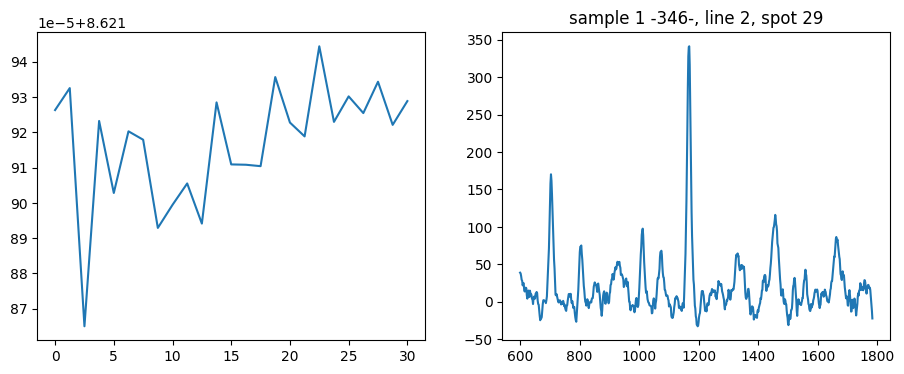

Send: MOVE X=33936.0 Y=-145916.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.336559772491455
Position =  6.245010485185334


<Figure size 640x480 with 0 Axes>

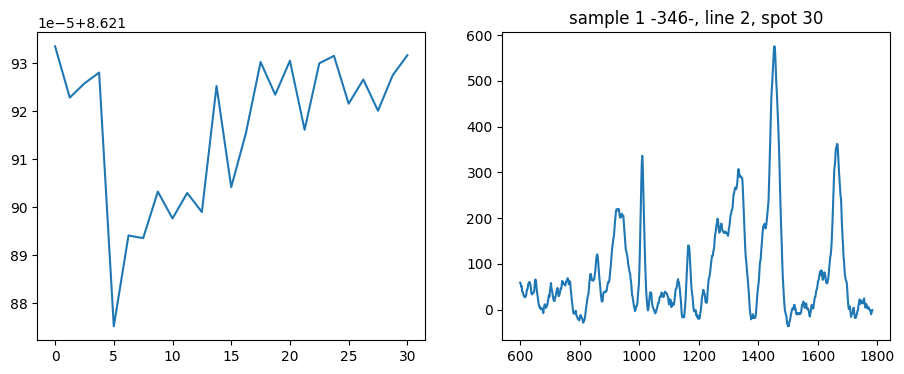

Send: MOVE X=33936.0 Y=-145452.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.45488429069519
Position =  8.77261811468252


<Figure size 640x480 with 0 Axes>

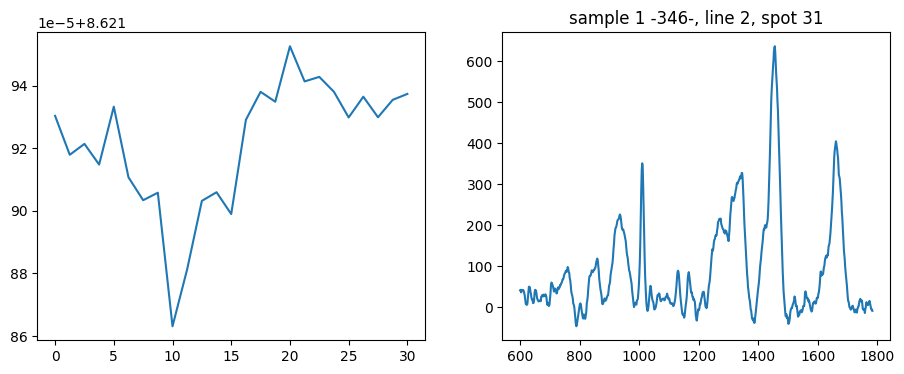

Send: MOVE X=33936.0 Y=-144988.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.403188943862915
Position =  9.996514877187728


<Figure size 640x480 with 0 Axes>

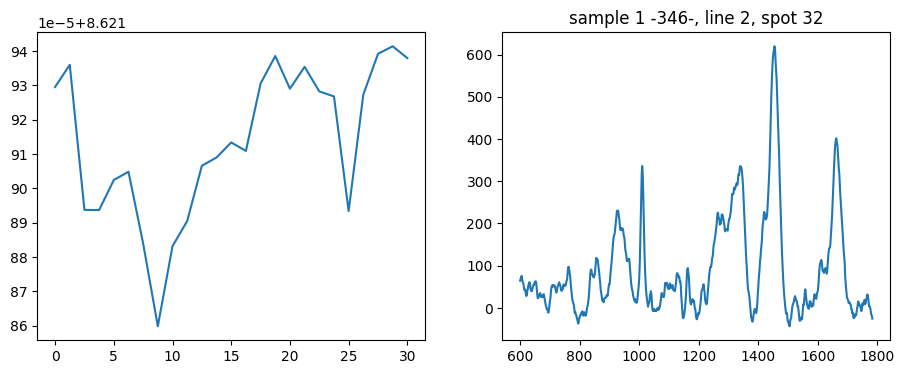

Send: MOVE X=33936.0 Y=-144524.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.480005979537964
Position =  7.497208147954166


<Figure size 640x480 with 0 Axes>

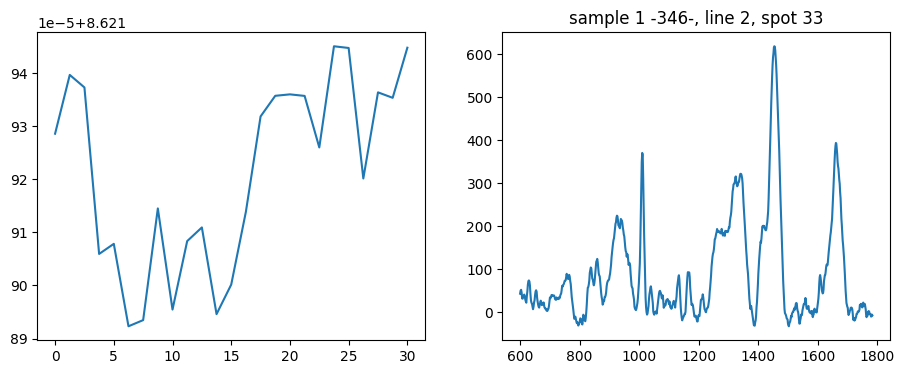

Send: MOVE X=33936.0 Y=-144060.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.316222429275513
Position =  11.264912874300753


<Figure size 640x480 with 0 Axes>

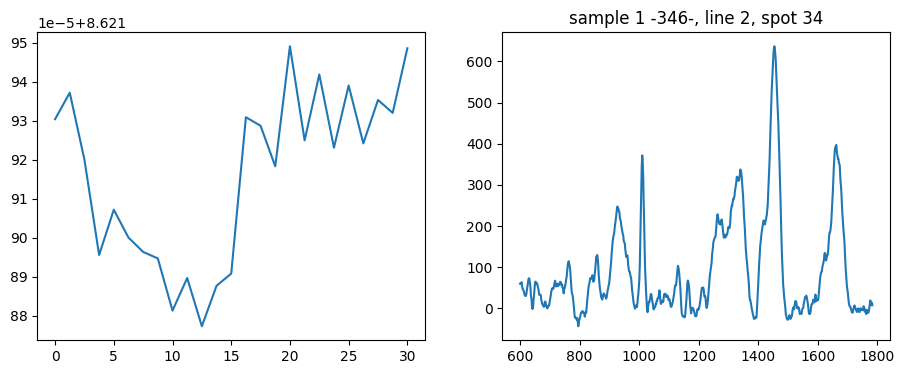

Send: MOVE X=33936.0 Y=-143596.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.453233003616333
Position =  5.027944606230447


<Figure size 640x480 with 0 Axes>

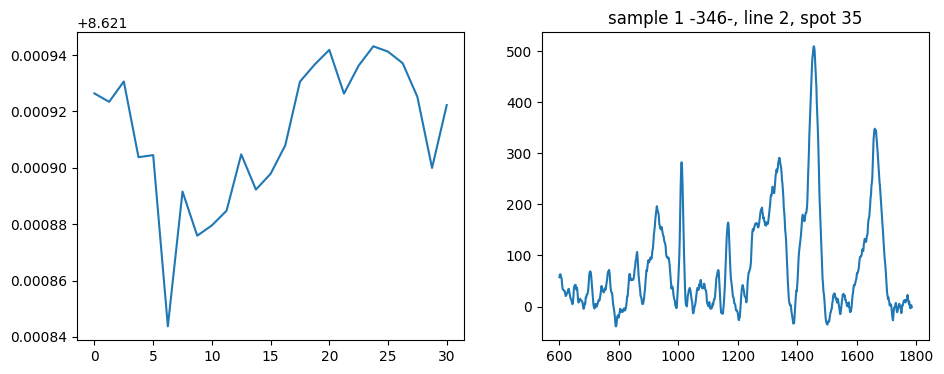

Send: MOVE X=33936.0 Y=-143132.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.269140005111694
Position =  12.493349484077186


<Figure size 640x480 with 0 Axes>

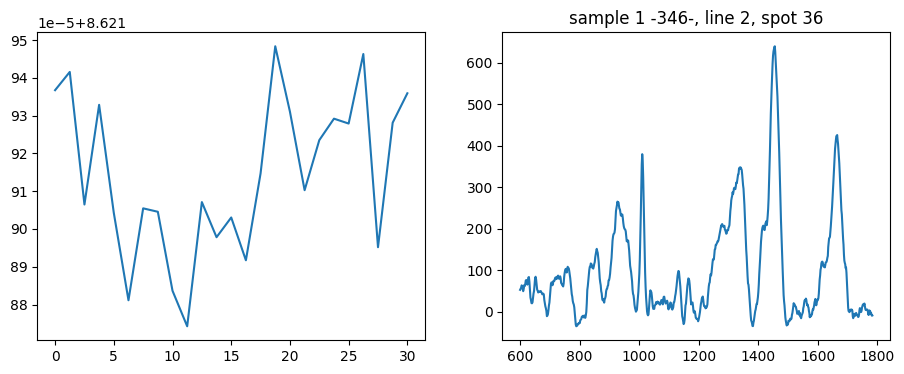

Send: MOVE X=33936.0 Y=-142668.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.481154203414917
Position =  8.744121828458965


<Figure size 640x480 with 0 Axes>

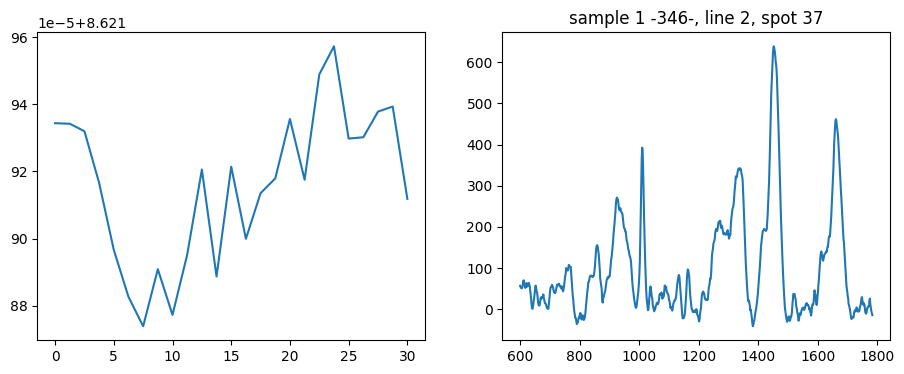

Send: MOVE X=33936.0 Y=-142204.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.398008584976196
Position =  9.99624239167265


<Figure size 640x480 with 0 Axes>

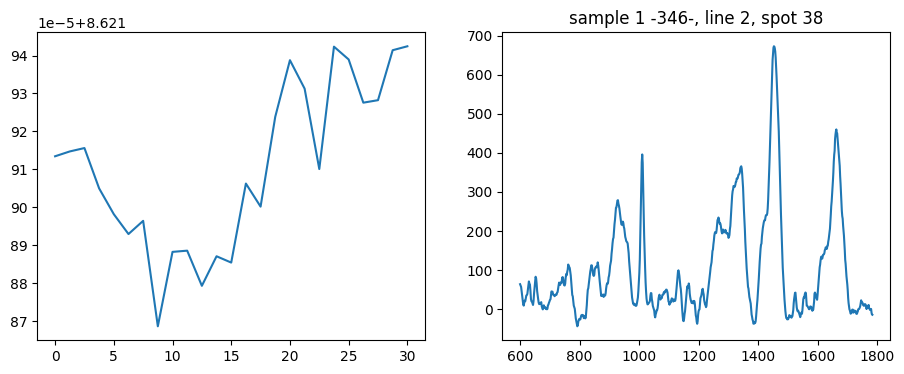

Send: MOVE X=33936.0 Y=-141740.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.499775886535645
Position =  8.744176419674837


<Figure size 640x480 with 0 Axes>

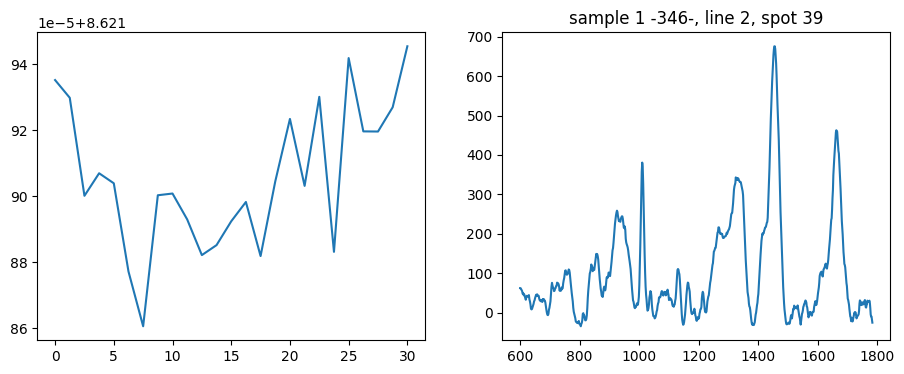

Send: MOVE X=33936.0 Y=-141276.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.39423370361328
Position =  3.788144433103029


<Figure size 640x480 with 0 Axes>

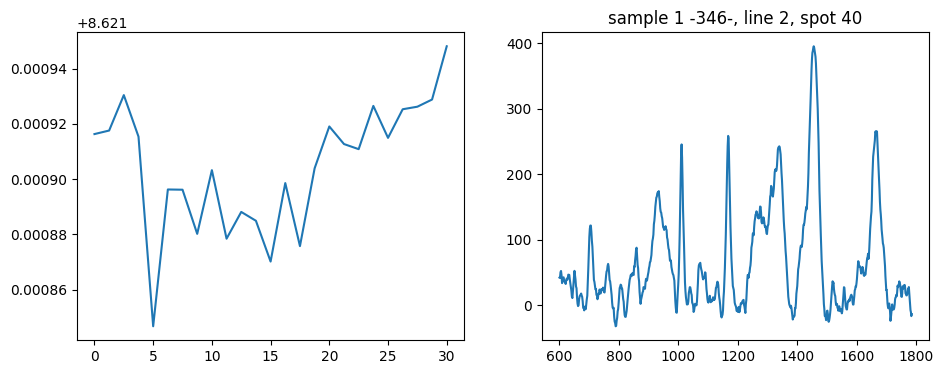

Send: MOVE X=33936.0 Y=-140812.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.473263263702393
Position =  9.996242391549432


<Figure size 640x480 with 0 Axes>

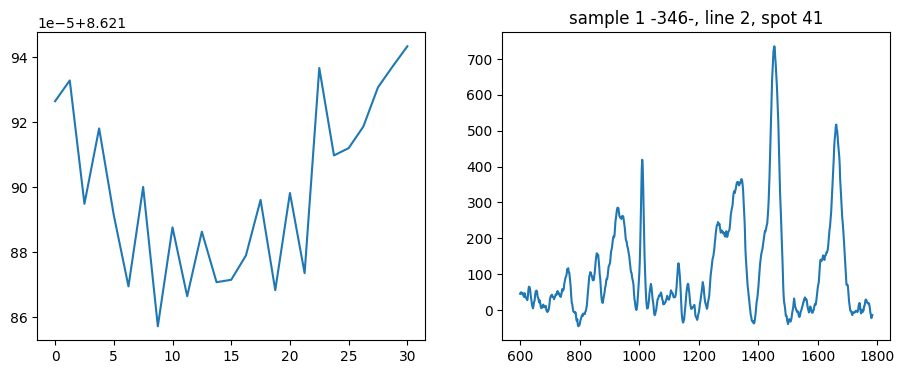

Send: MOVE X=33936.0 Y=-140348.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.327160596847534
Position =  22.5164166164041


<Figure size 640x480 with 0 Axes>

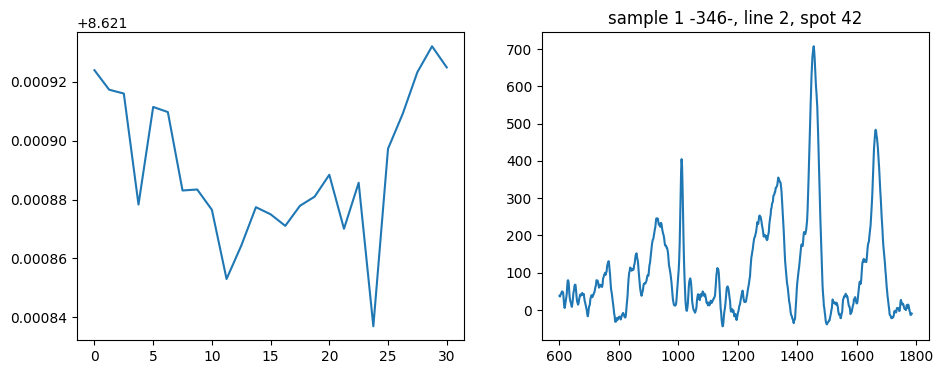

Send: MOVE X=33936.0 Y=-139884.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.522493362426758
Position =  27.493815027501213


<Figure size 640x480 with 0 Axes>

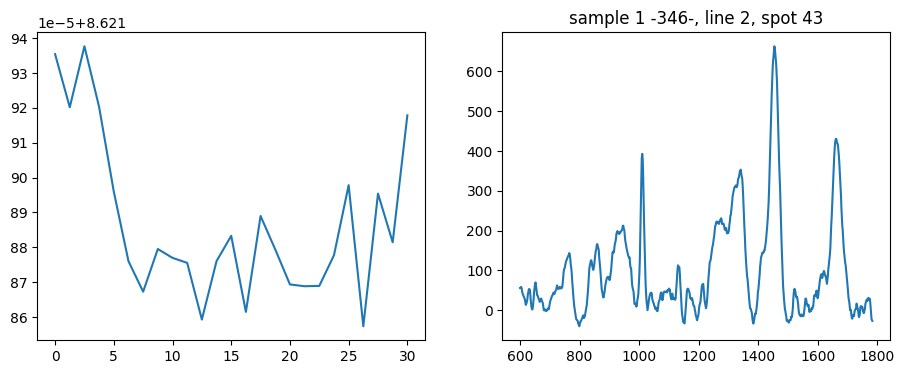

Send: MOVE X=33936.0 Y=-139420.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.38478660583496
Position =  17.49151621692251


<Figure size 640x480 with 0 Axes>

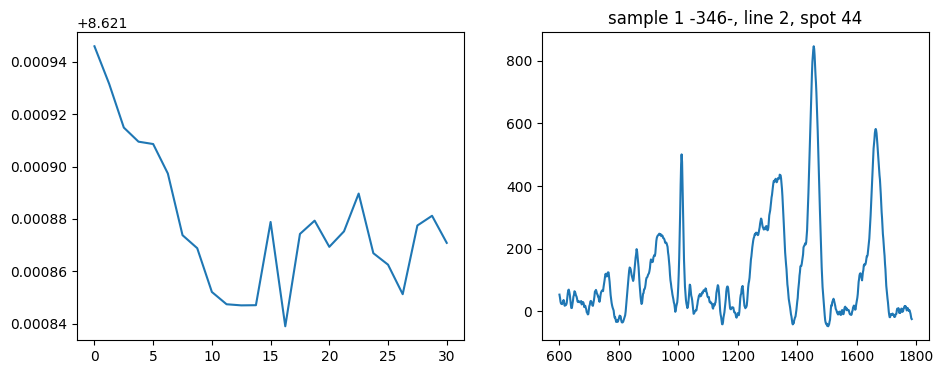

Send: MOVE X=33936.0 Y=-138956.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.492690324783325
Position =  12.53440636505666


<Figure size 640x480 with 0 Axes>

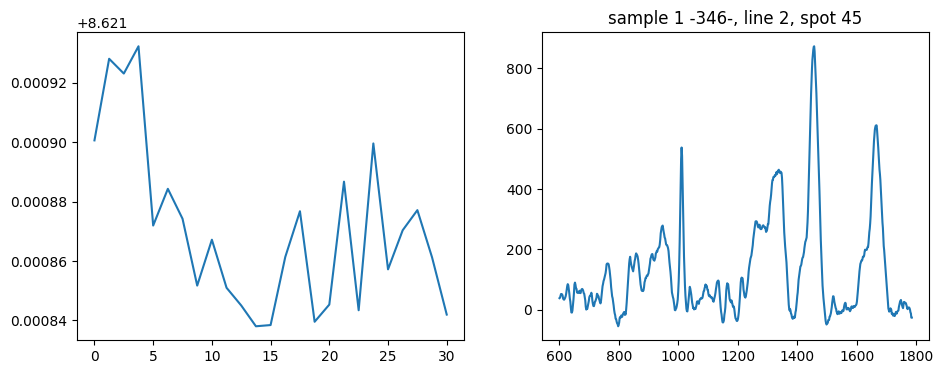

Send: MOVE X=33936.0 Y=-138492.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.388444423675537
Position =  14.997479570474788


<Figure size 640x480 with 0 Axes>

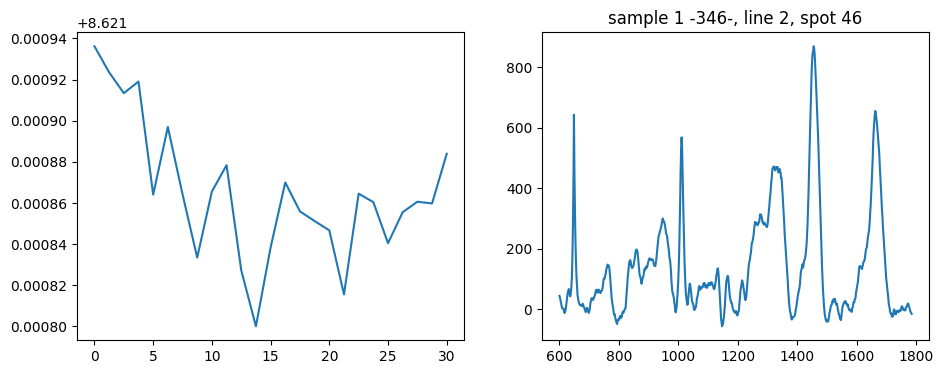

Send: MOVE X=33936.0 Y=-138028.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.518874168395996
Position =  20.02179049863541


<Figure size 640x480 with 0 Axes>

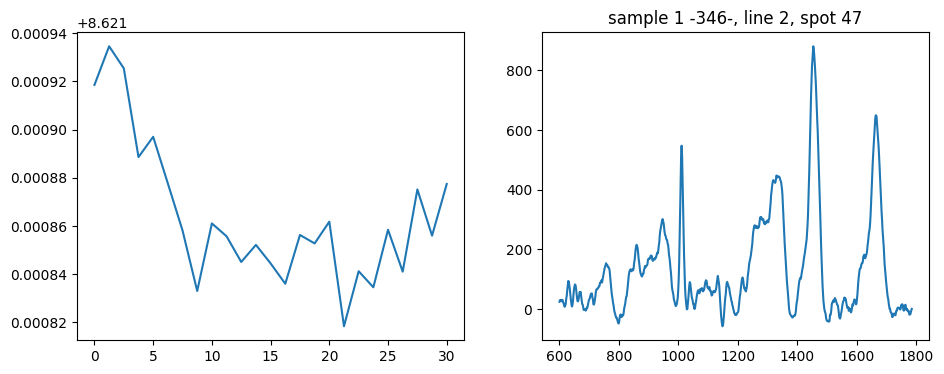

Send: MOVE X=33936.0 Y=-137564.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.33495044708252
Position =  12.493729650741185


<Figure size 640x480 with 0 Axes>

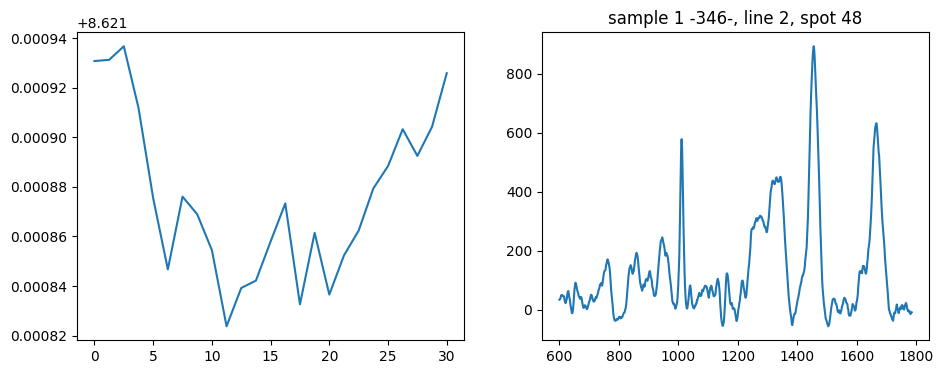

Send: MOVE X=33936.0 Y=-137100.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.520241022109985
Position =  9.996460380232577


<Figure size 640x480 with 0 Axes>

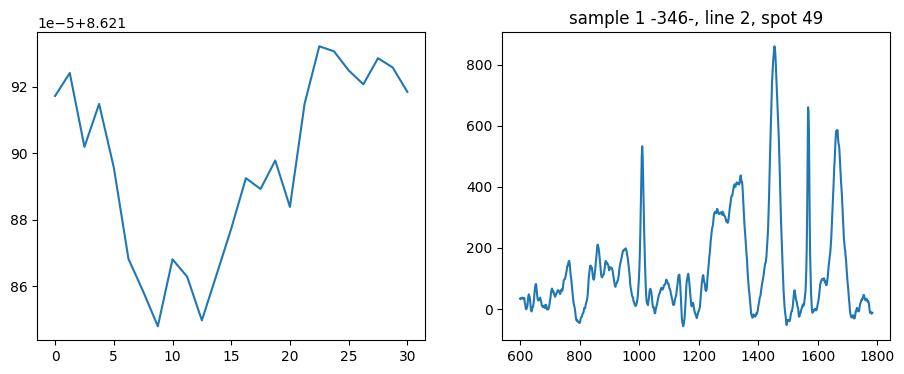

Send: MOVE X=33936.0 Y=-136636.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.357383966445923
Position =  5.042925102497048


<Figure size 640x480 with 0 Axes>

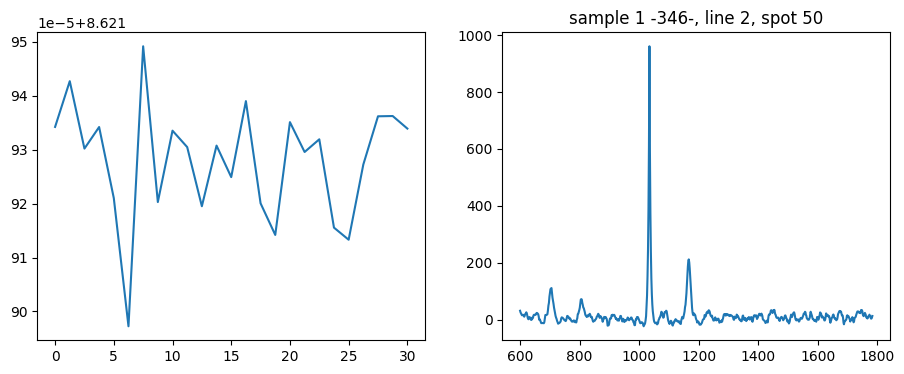

Send: MOVE X=25905.0 Y=-140055.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.5397732257843
Position =  12.534895124915566


<Figure size 640x480 with 0 Axes>

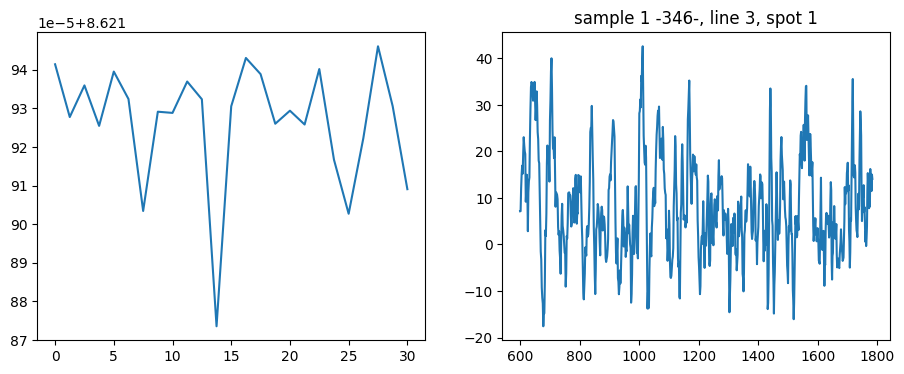

Send: MOVE X=26230.0 Y=-140383.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.275849103927612
Position =  11.267578552087256


<Figure size 640x480 with 0 Axes>

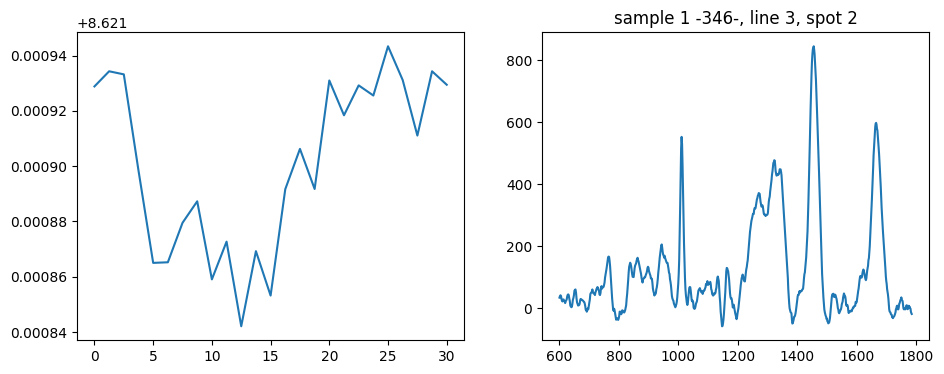

Send: MOVE X=26555.0 Y=-140711.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.50685214996338
Position =  8.778404580198128


<Figure size 640x480 with 0 Axes>

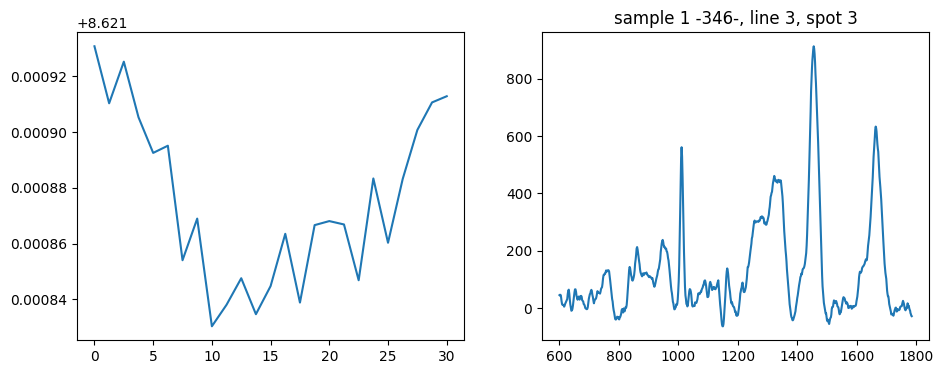

Send: MOVE X=26880.0 Y=-141040.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.29049801826477
Position =  23.739518191364727


<Figure size 640x480 with 0 Axes>

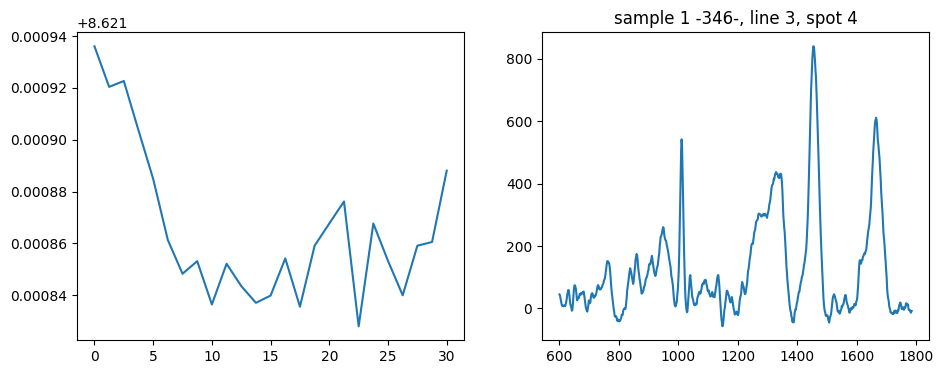

Send: MOVE X=27205.0 Y=-141368.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.33803105354309
Position =  17.51535643589336


<Figure size 640x480 with 0 Axes>

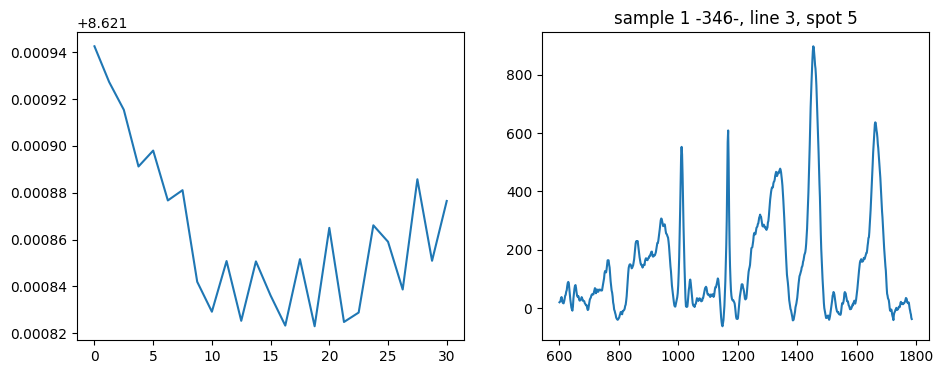

Send: MOVE X=27530.0 Y=-141696.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.445775270462036
Position =  16.246266378352548


<Figure size 640x480 with 0 Axes>

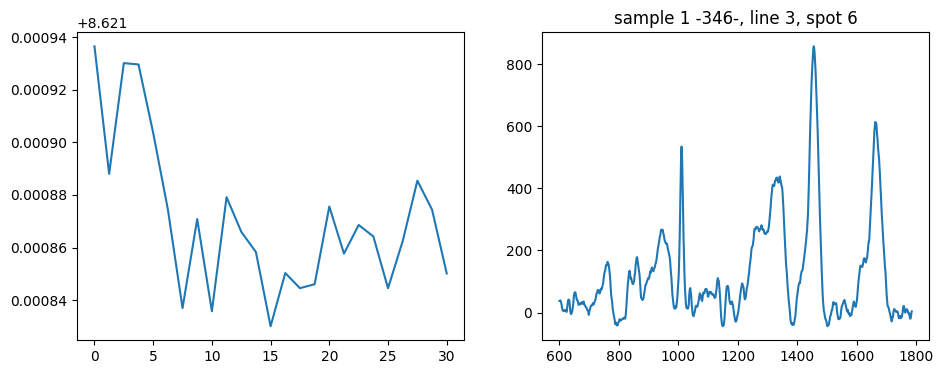

Send: MOVE X=27855.0 Y=-142024.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.39475440979004
Position =  18.742831756729185


<Figure size 640x480 with 0 Axes>

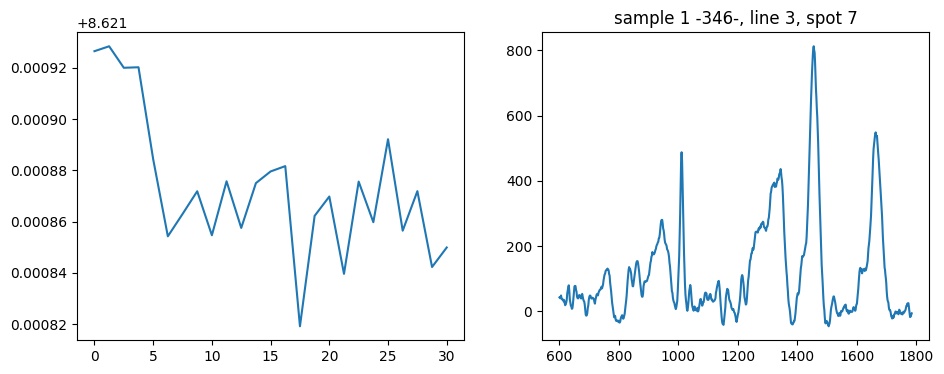

Send: MOVE X=28180.0 Y=-142352.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.169997453689575
Position =  9.996296888997469


<Figure size 640x480 with 0 Axes>

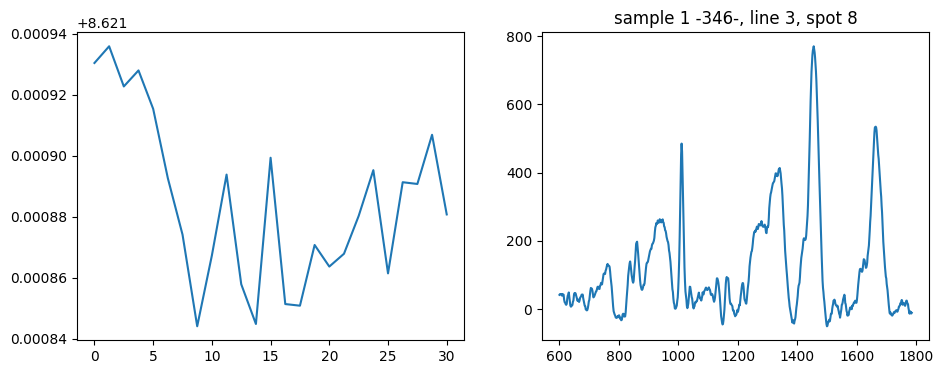

Send: MOVE X=28505.0 Y=-142680.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.38271713256836
Position =  14.997154833159767


<Figure size 640x480 with 0 Axes>

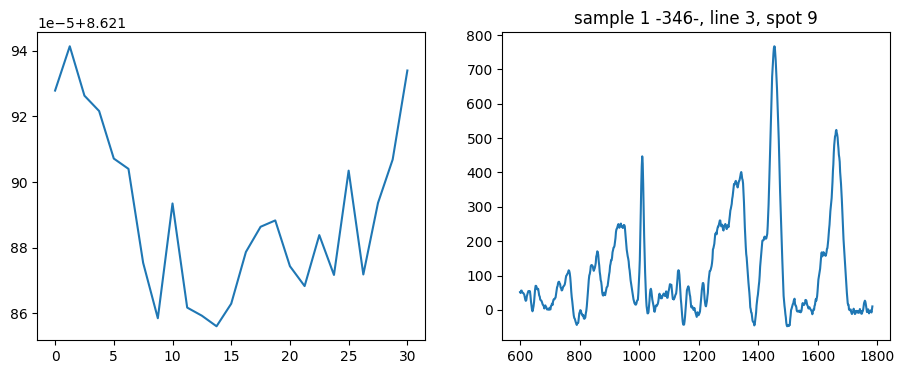

Send: MOVE X=28830.0 Y=-143008.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.281891345977783
Position =  17.491893782683533


<Figure size 640x480 with 0 Axes>

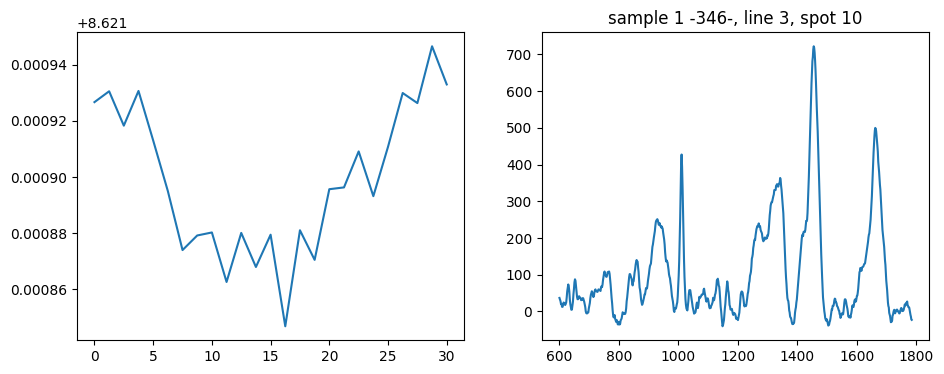

Send: MOVE X=29154.0 Y=-143336.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.432988166809082
Position =  13.74524599407778


<Figure size 640x480 with 0 Axes>

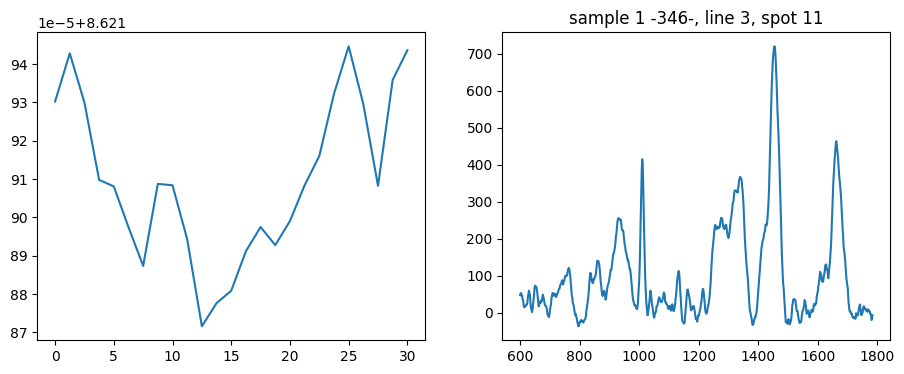

Send: MOVE X=29479.0 Y=-143664.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.324331521987915
Position =  15.026164082332452


<Figure size 640x480 with 0 Axes>

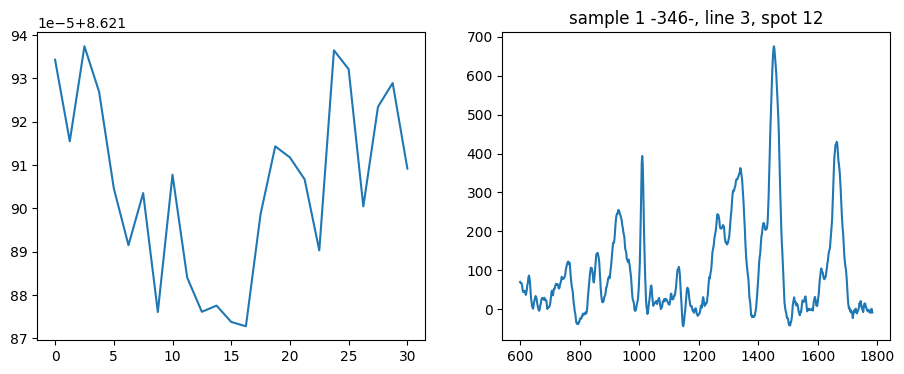

Send: MOVE X=29804.0 Y=-143992.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.387942790985107
Position =  17.530512366660975


<Figure size 640x480 with 0 Axes>

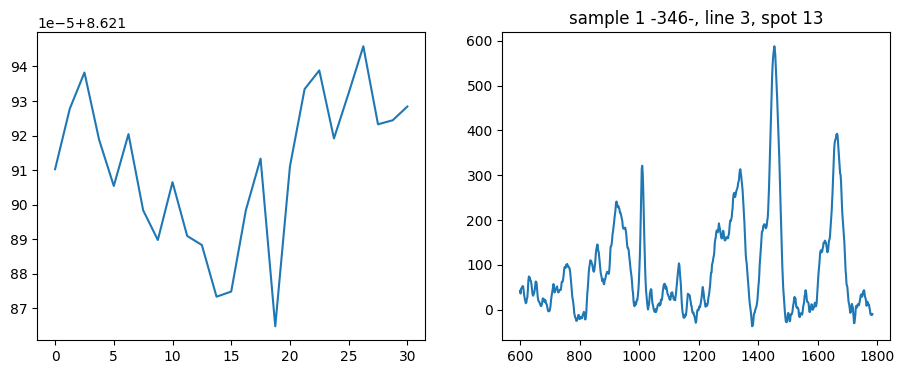

Send: MOVE X=30129.0 Y=-144321.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.32473397254944
Position =  14.9971007110786


<Figure size 640x480 with 0 Axes>

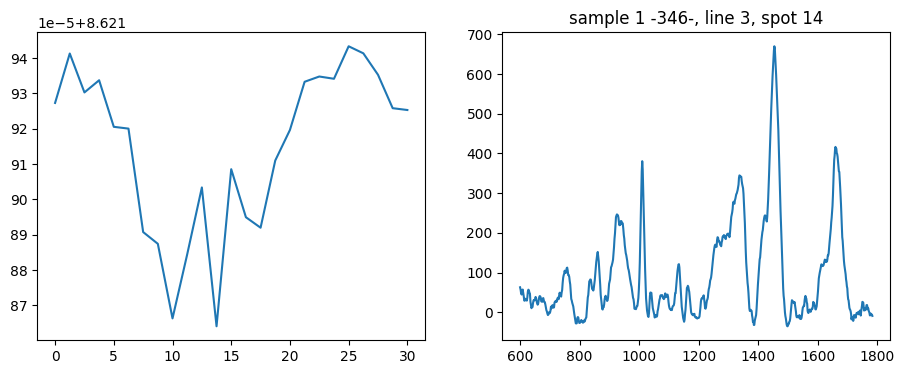

Send: MOVE X=30454.0 Y=-144649.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.37002682685852
Position =  8.74455856128255


<Figure size 640x480 with 0 Axes>

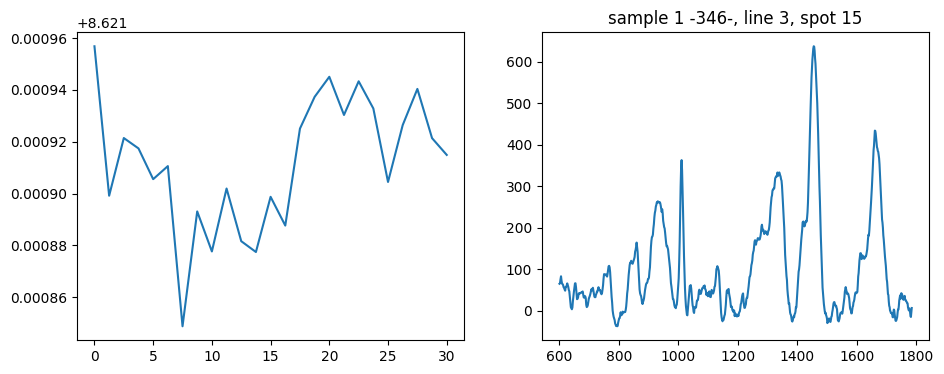

Send: MOVE X=30779.0 Y=-144977.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.320942401885986
Position =  13.777991741320992


<Figure size 640x480 with 0 Axes>

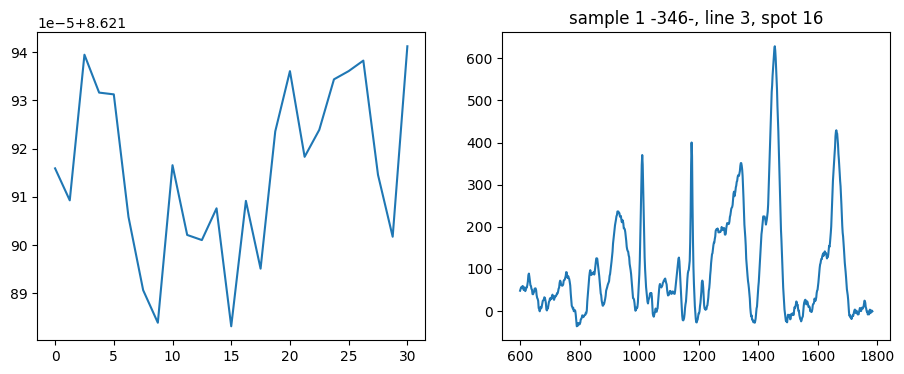

Send: MOVE X=31104.0 Y=-145305.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.279996633529663
Position =  11.272964277256277


<Figure size 640x480 with 0 Axes>

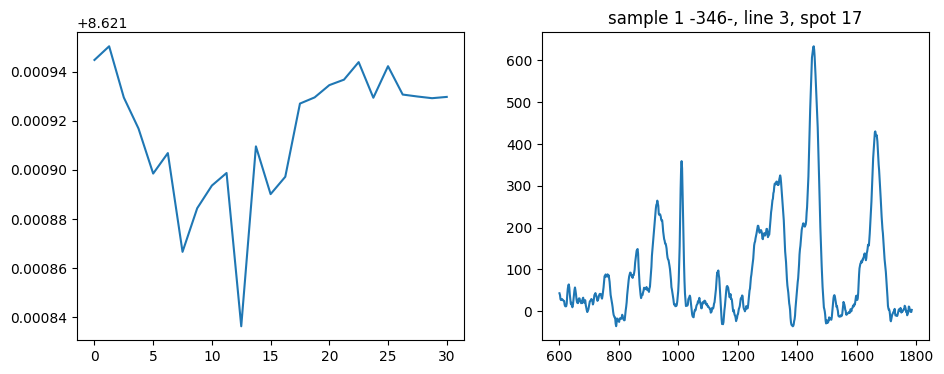

Send: MOVE X=31429.0 Y=-145633.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.368828296661377
Position =  11.24331508234383


<Figure size 640x480 with 0 Axes>

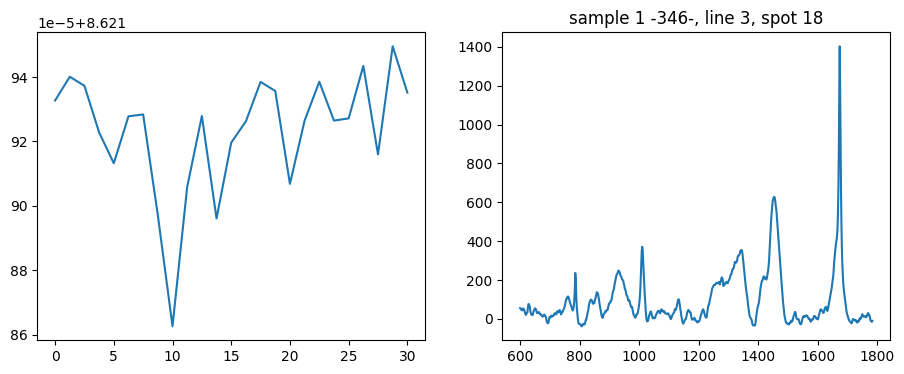

Send: MOVE X=31754.0 Y=-145961.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.423163890838623
Position =  11.266218514238883


<Figure size 640x480 with 0 Axes>

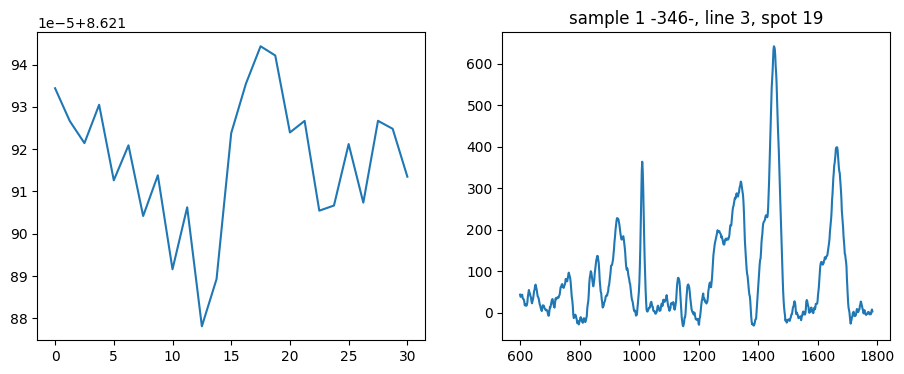

Send: MOVE X=32079.0 Y=-146289.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.419859409332275
Position =  7.523621067828146


<Figure size 640x480 with 0 Axes>

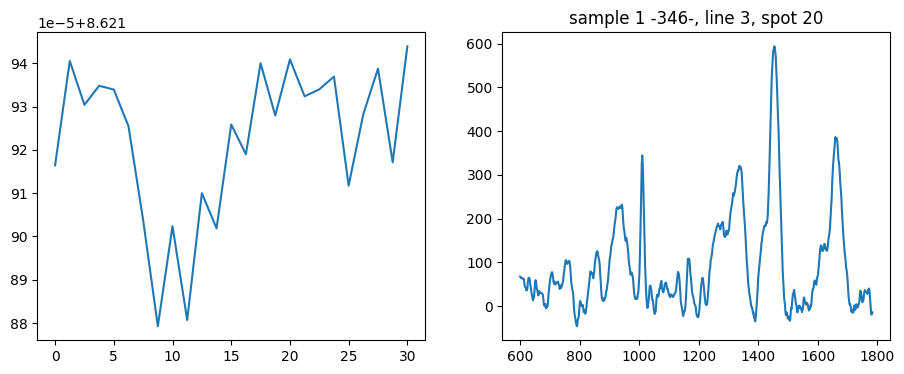

Send: MOVE X=32404.0 Y=-146617.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.372379302978516
Position =  13.745083346126028


<Figure size 640x480 with 0 Axes>

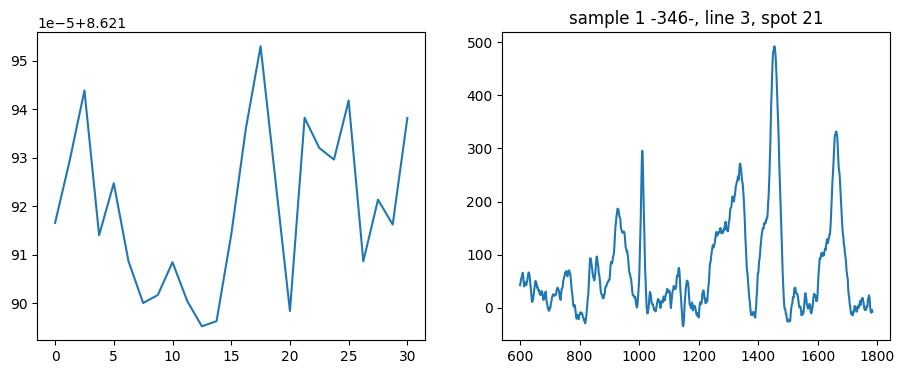

Send: MOVE X=32728.0 Y=-146945.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.23422622680664
Position =  6.245120047863754


<Figure size 640x480 with 0 Axes>

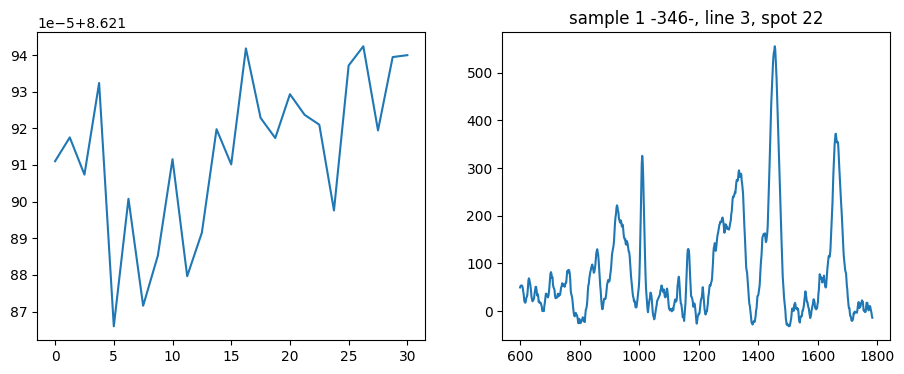

Send: MOVE X=33053.0 Y=-147273.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.36544966697693
Position =  11.243206275859215


<Figure size 640x480 with 0 Axes>

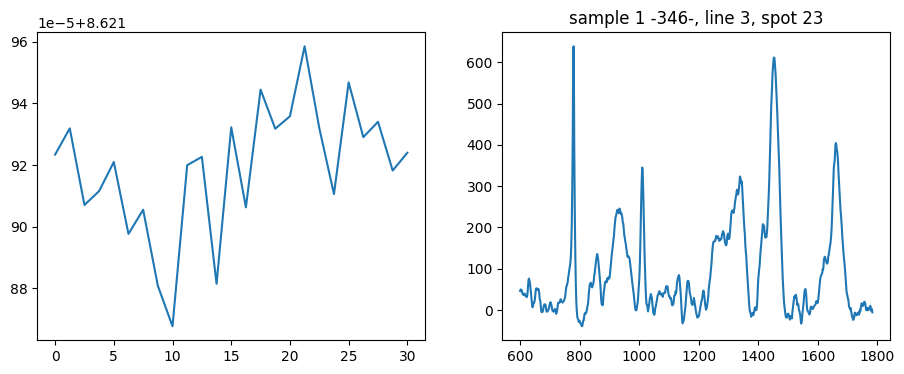

Send: MOVE X=33378.0 Y=-147601.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.451035022735596
Position =  12.527618019240286


<Figure size 640x480 with 0 Axes>

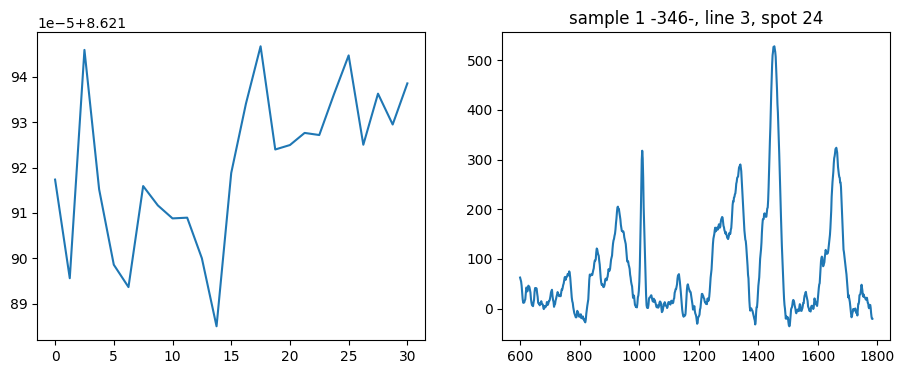

Send: MOVE X=33703.0 Y=-147930.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.368649005889893
Position =  10.038367452128389


<Figure size 640x480 with 0 Axes>

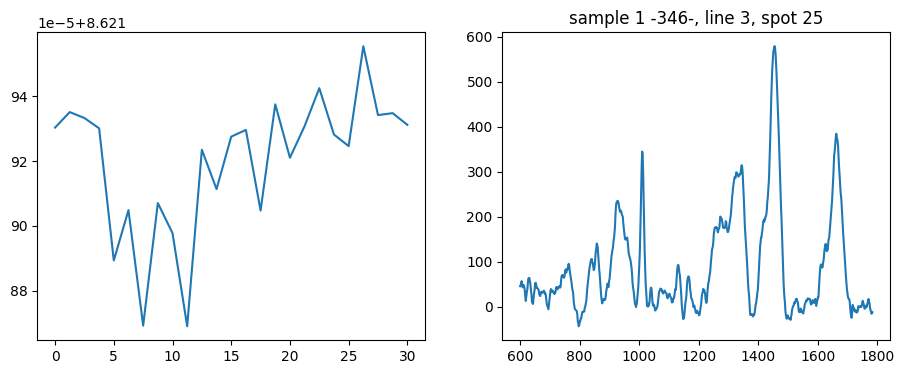

Send: MOVE X=34028.0 Y=-148258.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.319071769714355
Position =  10.029430382475008


<Figure size 640x480 with 0 Axes>

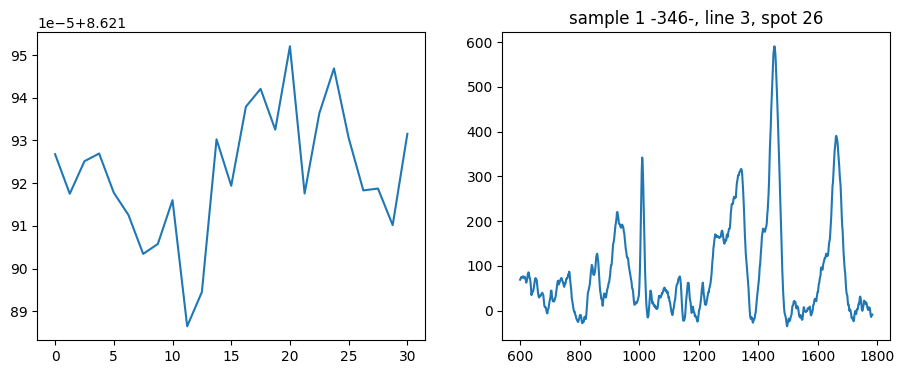

Send: MOVE X=34353.0 Y=-148586.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.293099641799927
Position =  13.74573393841836


<Figure size 640x480 with 0 Axes>

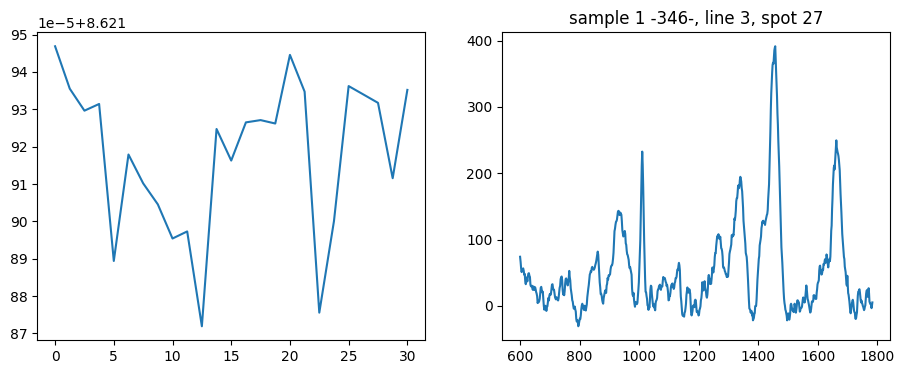

Send: MOVE X=34678.0 Y=-148914.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.312270879745483
Position =  8.769342739451057


<Figure size 640x480 with 0 Axes>

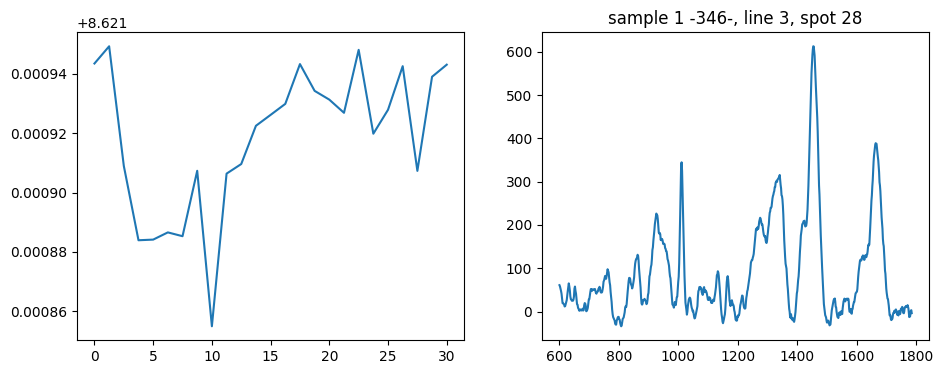

Send: MOVE X=35003.0 Y=-149242.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.437816619873047
Position =  28.7711258087444


<Figure size 640x480 with 0 Axes>

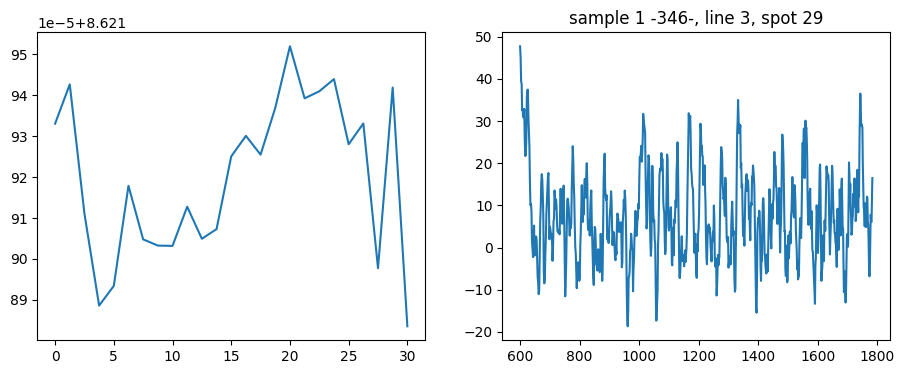

Send: MOVE X=35328.0 Y=-149570.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.337130546569824
Position =  7.497044089429367


<Figure size 640x480 with 0 Axes>

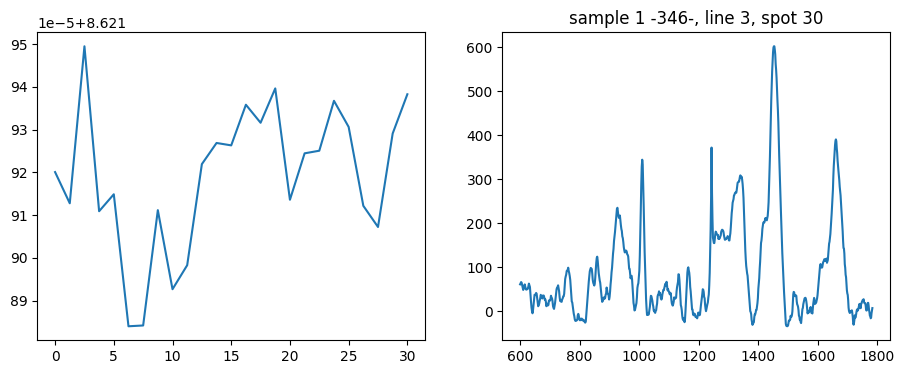

Send: MOVE X=35653.0 Y=-149898.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.35361886024475
Position =  8.77409203019897


<Figure size 640x480 with 0 Axes>

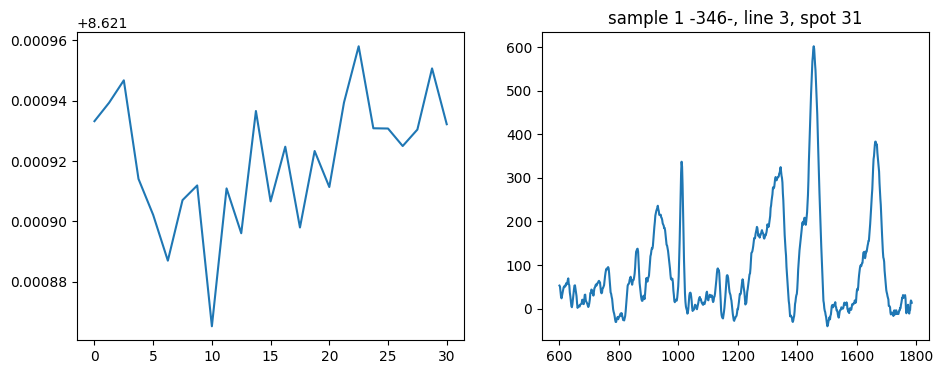

Send: MOVE X=35978.0 Y=-150226.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.325581789016724
Position =  17.514277709342732


<Figure size 640x480 with 0 Axes>

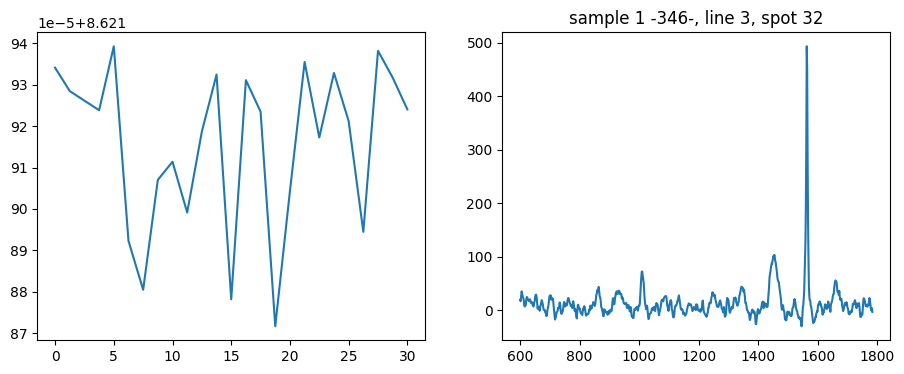

Send: MOVE X=36302.0 Y=-150554.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.369749069213867
Position =  3.7722581923495055


<Figure size 640x480 with 0 Axes>

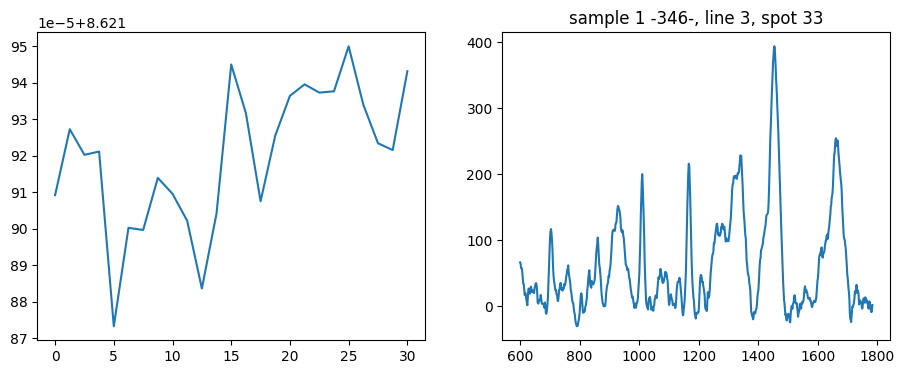

Send: MOVE X=36627.0 Y=-150882.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.367295503616333
Position =  2.494709206737346


<Figure size 640x480 with 0 Axes>

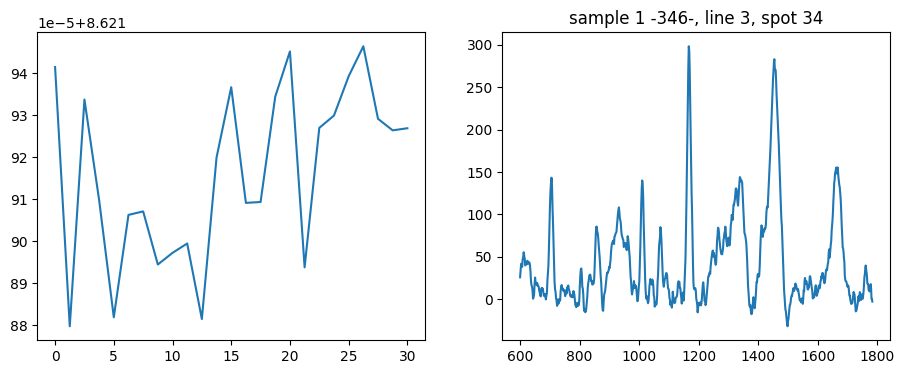

Send: MOVE X=36952.0 Y=-151211.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.378219604492188
Position =  5.0276153604472835


<Figure size 640x480 with 0 Axes>

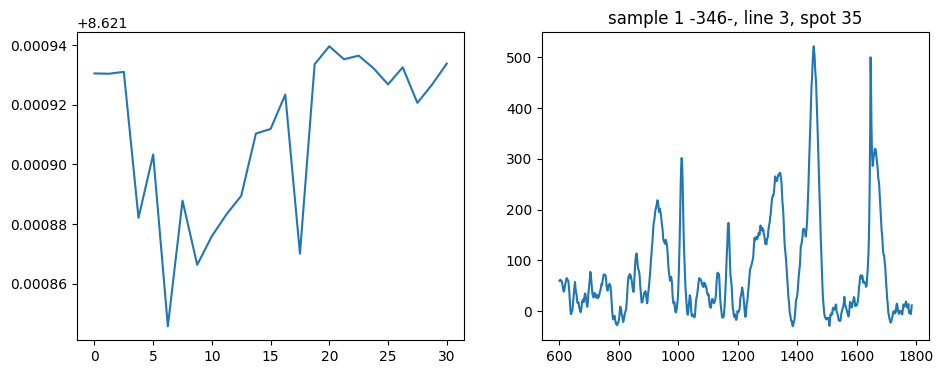

Send: MOVE X=37277.0 Y=-151539.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.346832752227783
Position =  13.74524599383514


<Figure size 640x480 with 0 Axes>

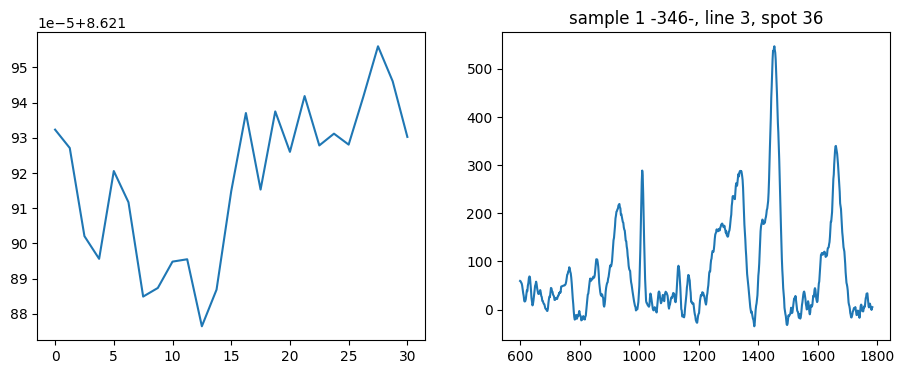

Send: MOVE X=37602.0 Y=-151867.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.327998161315918
Position =  6.269332986533544


<Figure size 640x480 with 0 Axes>

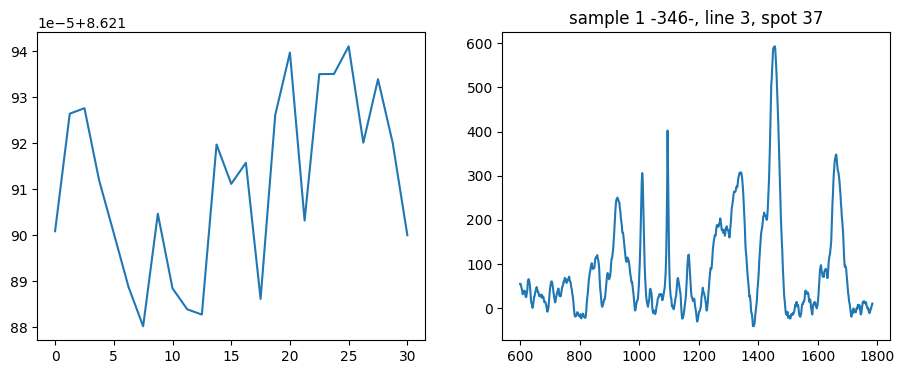

Send: MOVE X=37927.0 Y=-152195.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.30545735359192
Position =  12.493240864664465


<Figure size 640x480 with 0 Axes>

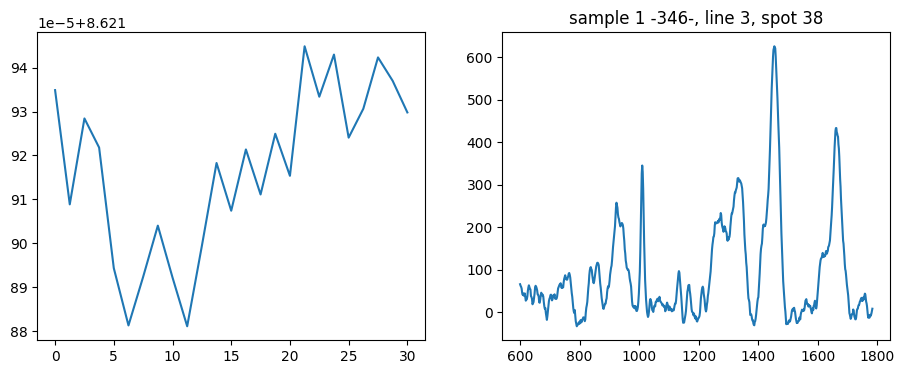

Send: MOVE X=38252.0 Y=-152523.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.34189224243164
Position =  7.497208147705153


<Figure size 640x480 with 0 Axes>

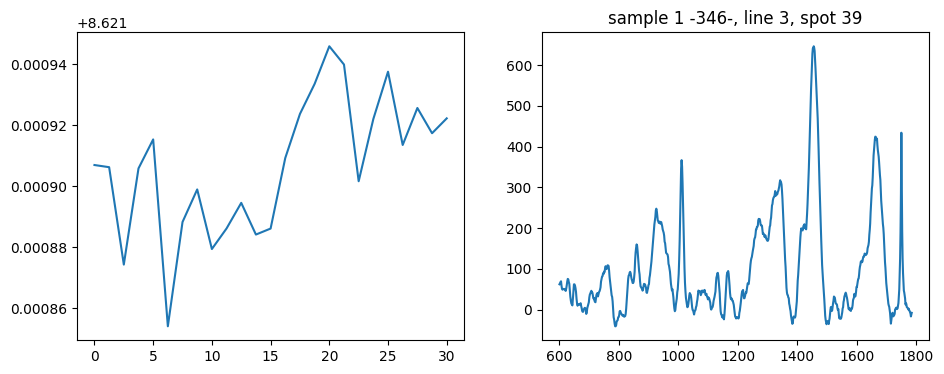

Send: MOVE X=38577.0 Y=-152851.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.450966358184814
Position =  12.493023626692707


<Figure size 640x480 with 0 Axes>

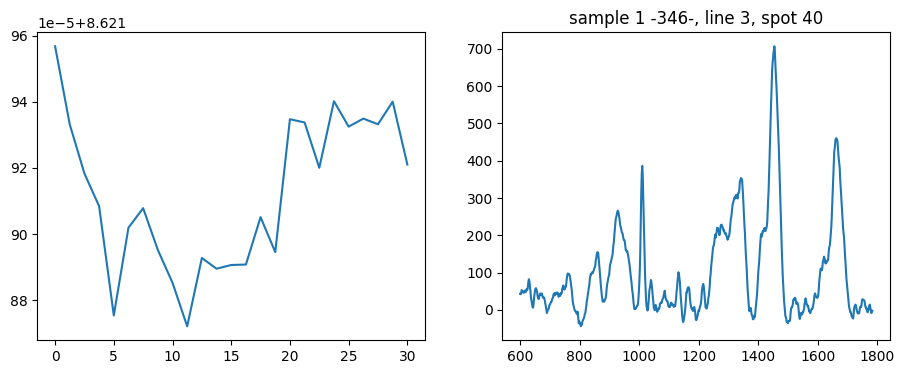

Send: MOVE X=38902.0 Y=-153179.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.424086570739746
Position =  17.516111541970226


<Figure size 640x480 with 0 Axes>

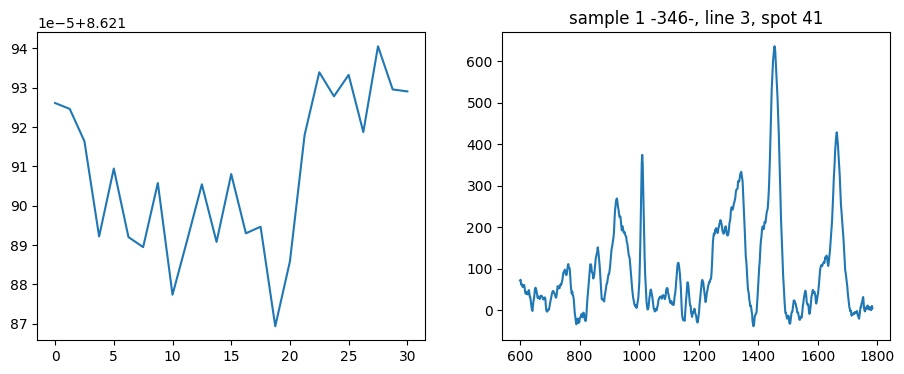

Send: MOVE X=39227.0 Y=-153507.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.626046895980835
Position =  23.77112457458106


<Figure size 640x480 with 0 Axes>

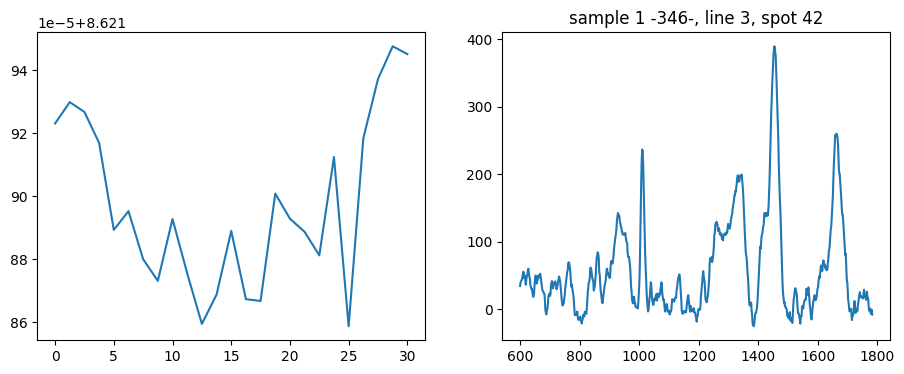

Send: MOVE X=39552.0 Y=-153835.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.397552490234375
Position =  24.992520633999515


<Figure size 640x480 with 0 Axes>

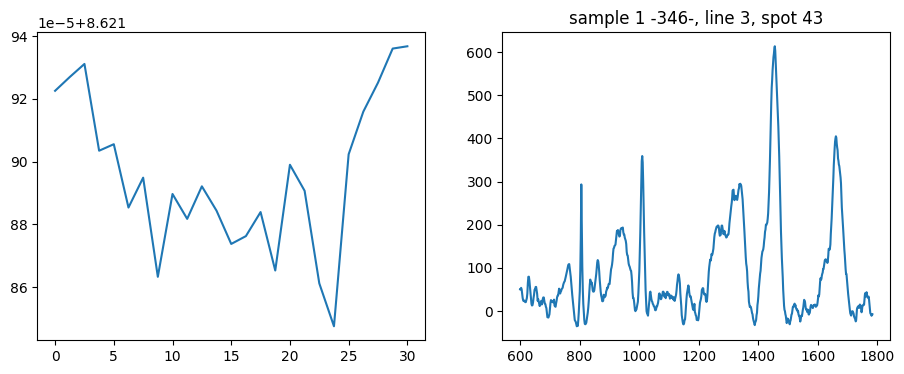

Send: MOVE X=39876.0 Y=-154163.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.58543038368225
Position =  11.28667322051655


<Figure size 640x480 with 0 Axes>

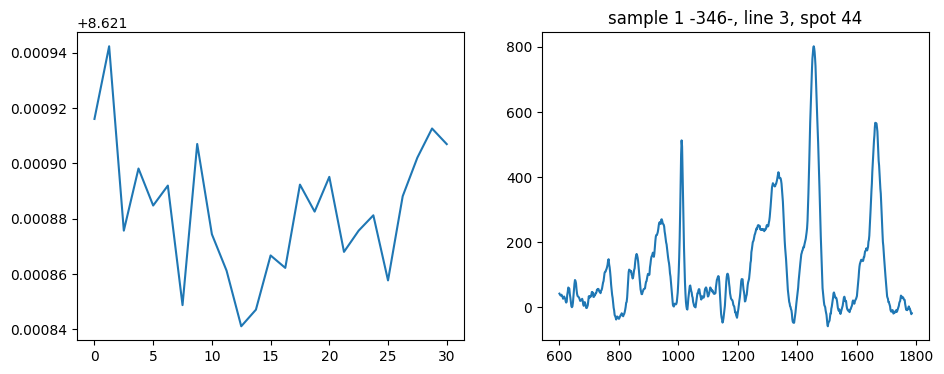

Send: MOVE X=40201.0 Y=-154492.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.384056568145752
Position =  26.2888625907564


<Figure size 640x480 with 0 Axes>

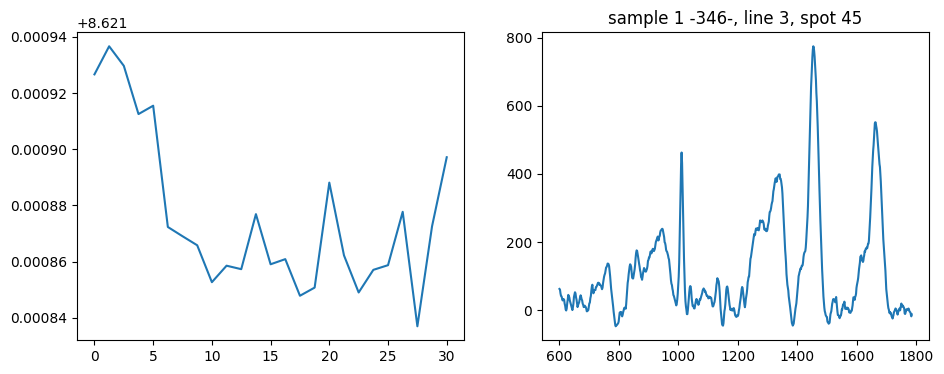

Send: MOVE X=40526.0 Y=-154820.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.66093111038208
Position =  18.76501588907572


<Figure size 640x480 with 0 Axes>

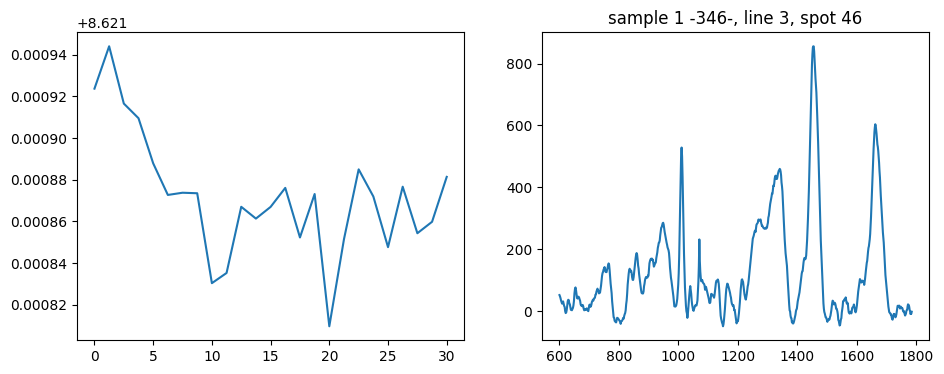

Send: MOVE X=40851.0 Y=-155148.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.302478313446045
Position =  11.275357921733


<Figure size 640x480 with 0 Axes>

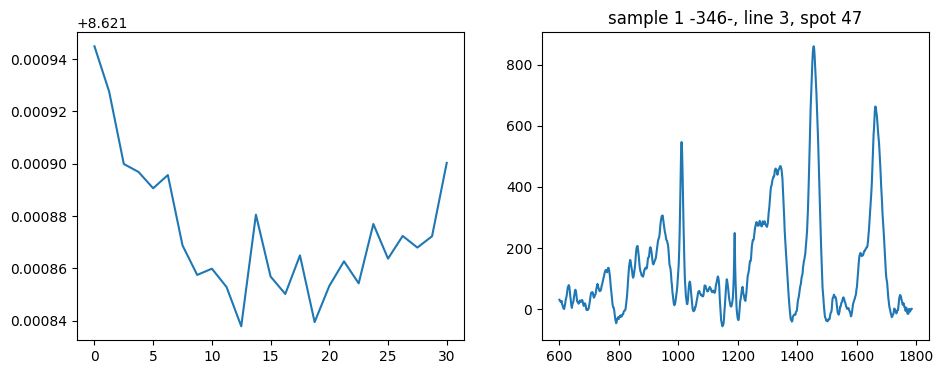

Send: MOVE X=41176.0 Y=-155476.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.459187507629395
Position =  18.786068657719298


<Figure size 640x480 with 0 Axes>

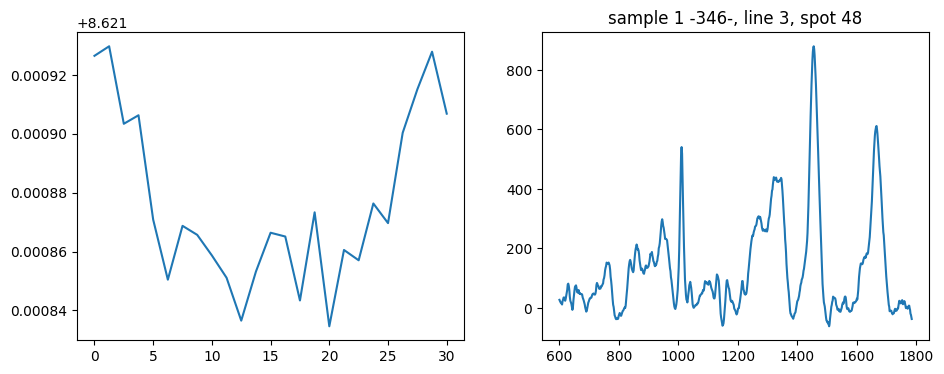

Send: MOVE X=41501.0 Y=-155804.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.41860818862915
Position =  9.996296889120684


<Figure size 640x480 with 0 Axes>

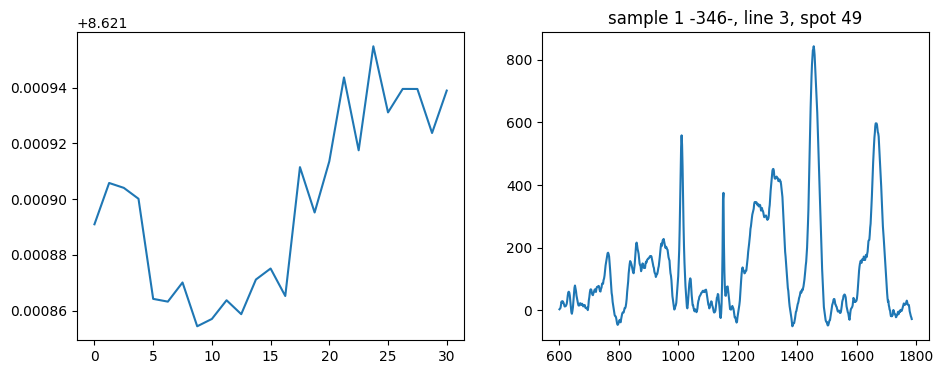

Send: MOVE X=41826.0 Y=-156132.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.47252583503723
Position =  28.74398205994829


<Figure size 640x480 with 0 Axes>

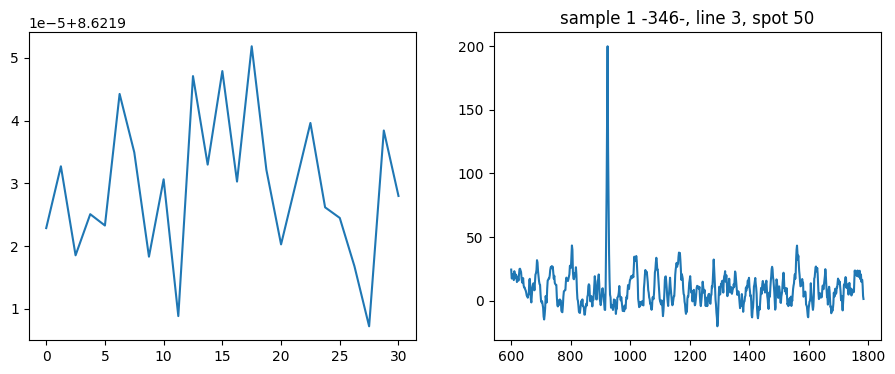

Send: MOVE X=25905.0 Y=-156132.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.323837280273438
Position =  7.533190724189153


<Figure size 640x480 with 0 Axes>

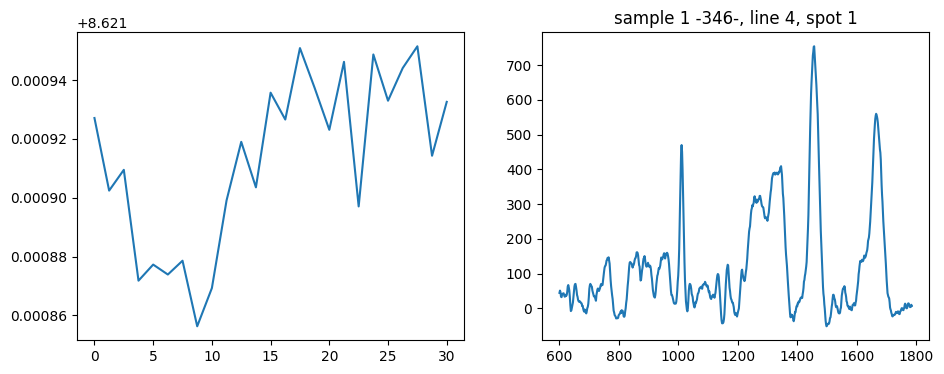

Send: MOVE X=26230.0 Y=-155804.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.479806184768677
Position =  8.769069791174529


<Figure size 640x480 with 0 Axes>

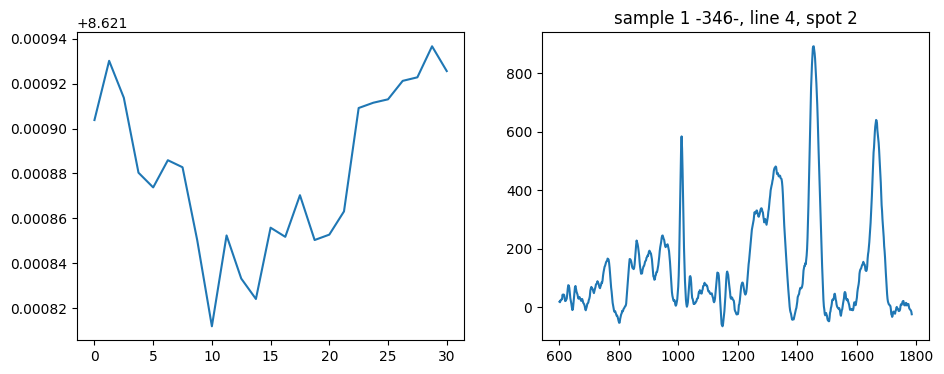

Send: MOVE X=26555.0 Y=-155476.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.32466745376587
Position =  10.021801097934071


<Figure size 640x480 with 0 Axes>

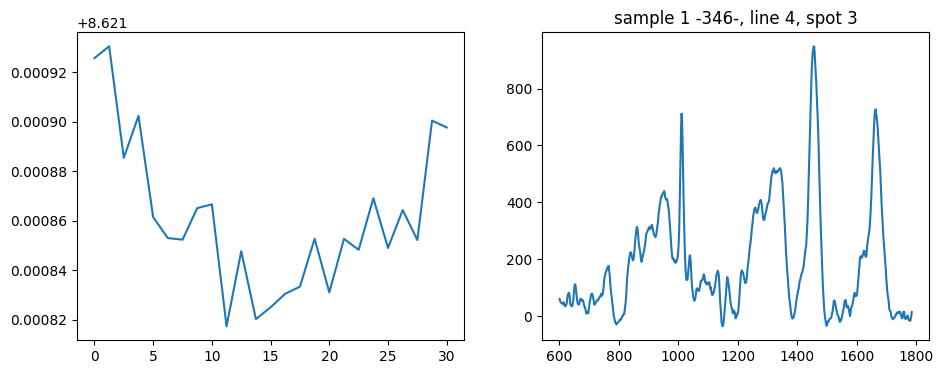

Send: MOVE X=26880.0 Y=-155148.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.641206979751587
Position =  8.787793843898674


<Figure size 640x480 with 0 Axes>

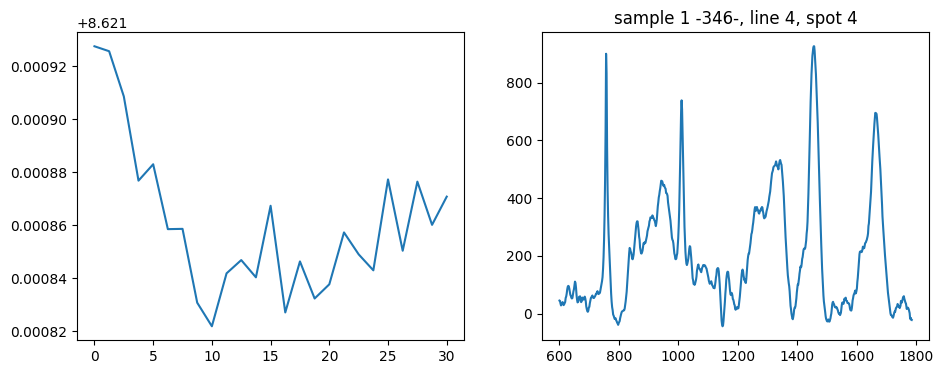

Send: MOVE X=27205.0 Y=-154820.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.33189868927002
Position =  11.26659932326748


<Figure size 640x480 with 0 Axes>

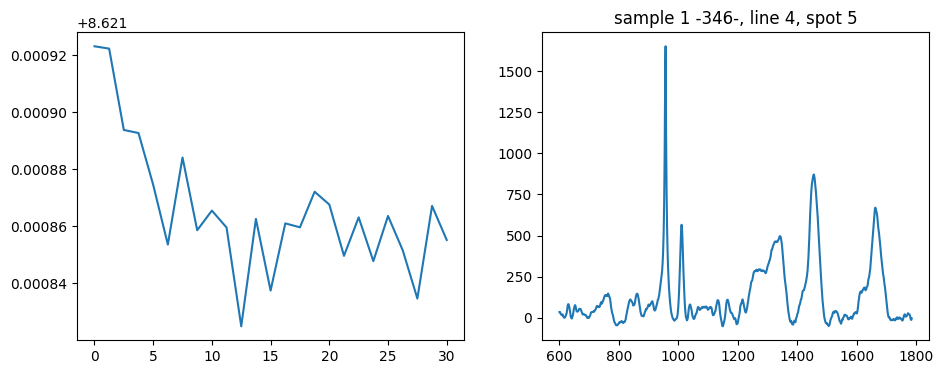

Send: MOVE X=27530.0 Y=-154492.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.53251552581787
Position =  6.283630286935784


<Figure size 640x480 with 0 Axes>

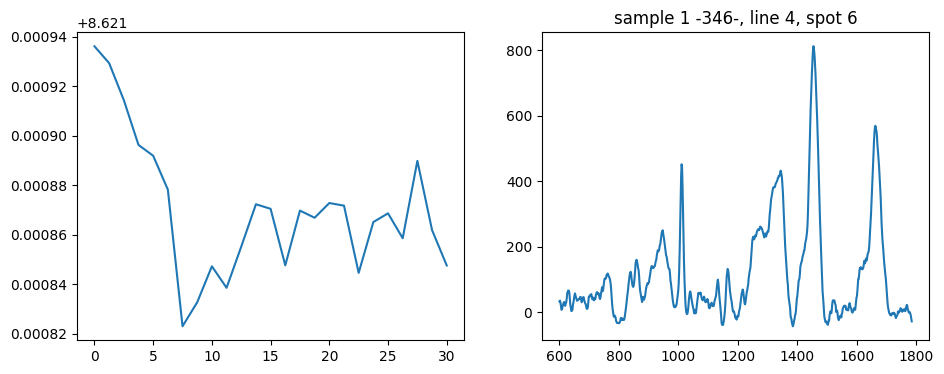

Send: MOVE X=27855.0 Y=-154163.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.409891843795776
Position =  18.765231265022898


<Figure size 640x480 with 0 Axes>

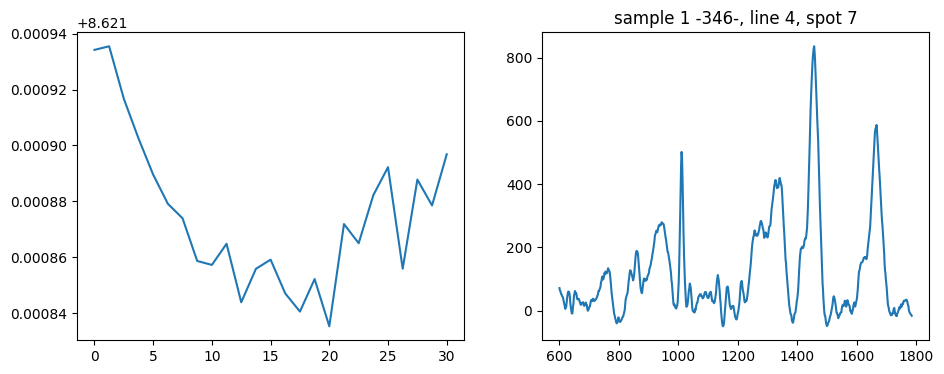

Send: MOVE X=28180.0 Y=-153835.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.457168340682983
Position =  19.992656415521683


<Figure size 640x480 with 0 Axes>

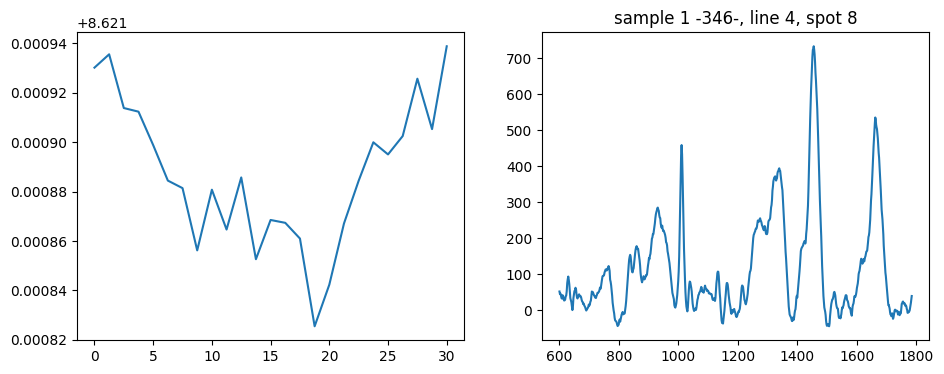

Send: MOVE X=28505.0 Y=-153507.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.449953079223633
Position =  13.771865582138338


<Figure size 640x480 with 0 Axes>

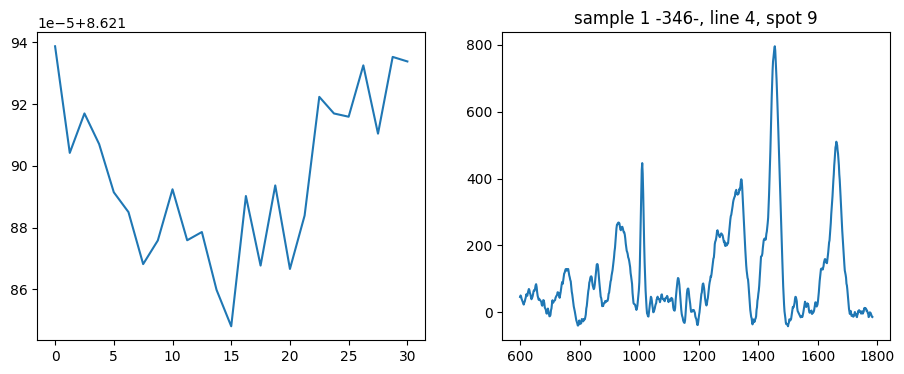

Send: MOVE X=28830.0 Y=-153179.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.564478635787964
Position =  19.99314020114404


<Figure size 640x480 with 0 Axes>

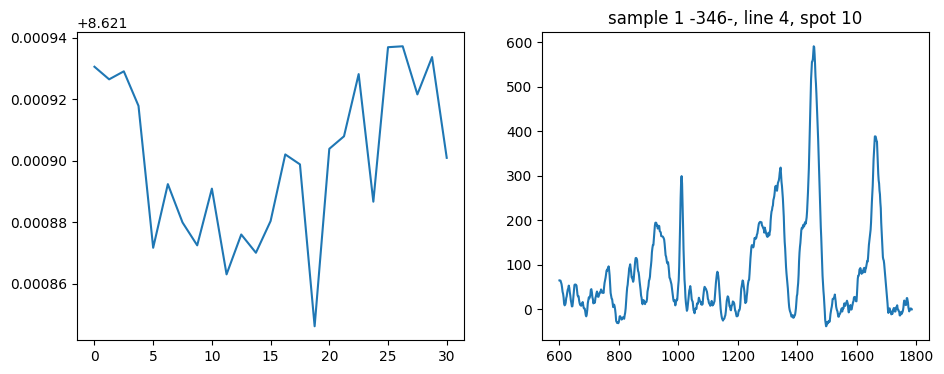

Send: MOVE X=29154.0 Y=-152851.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.3642897605896
Position =  8.744176419303267


<Figure size 640x480 with 0 Axes>

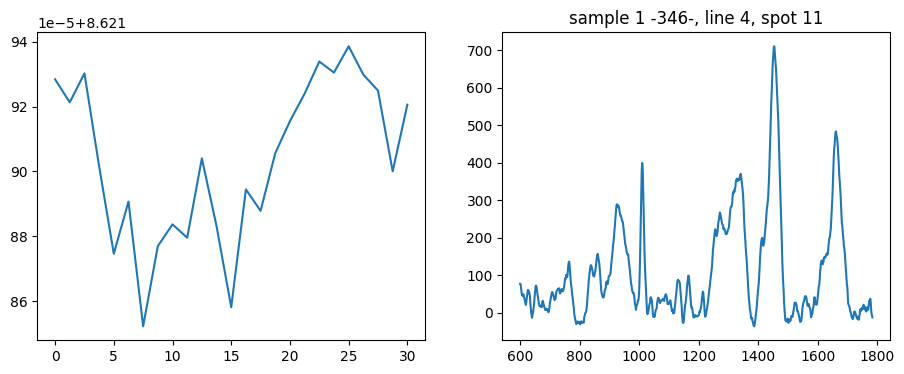

Send: MOVE X=29479.0 Y=-152523.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.530996561050415
Position =  14.996992464864356


<Figure size 640x480 with 0 Axes>

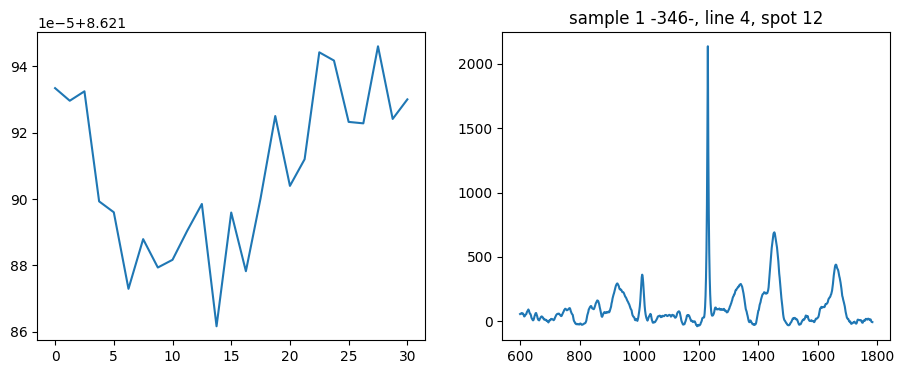

Send: MOVE X=29804.0 Y=-152195.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.32441020011902
Position =  7.496770658098166


<Figure size 640x480 with 0 Axes>

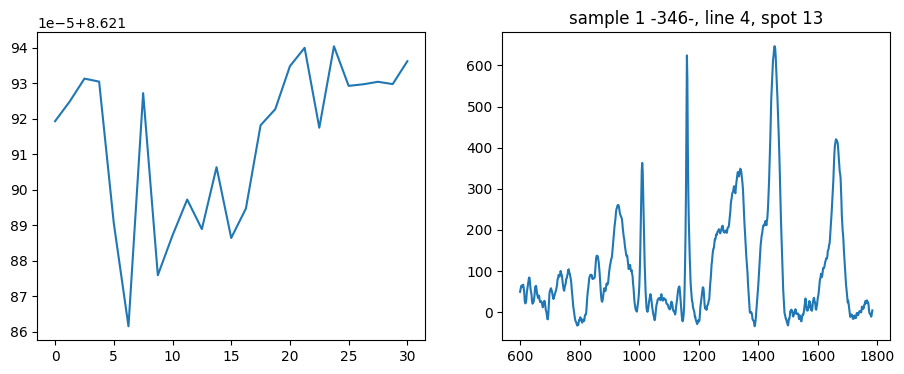

Send: MOVE X=30129.0 Y=-151867.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.474645376205444
Position =  12.493349483711322


<Figure size 640x480 with 0 Axes>

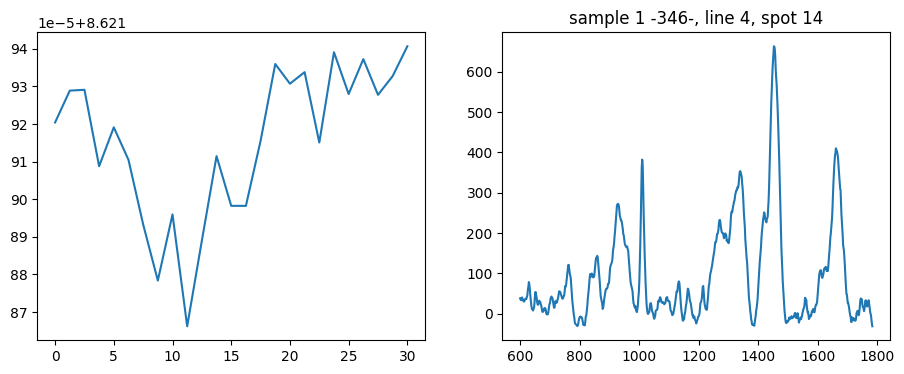

Send: MOVE X=30454.0 Y=-151539.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.393516540527344
Position =  4.995403482142745


<Figure size 640x480 with 0 Axes>

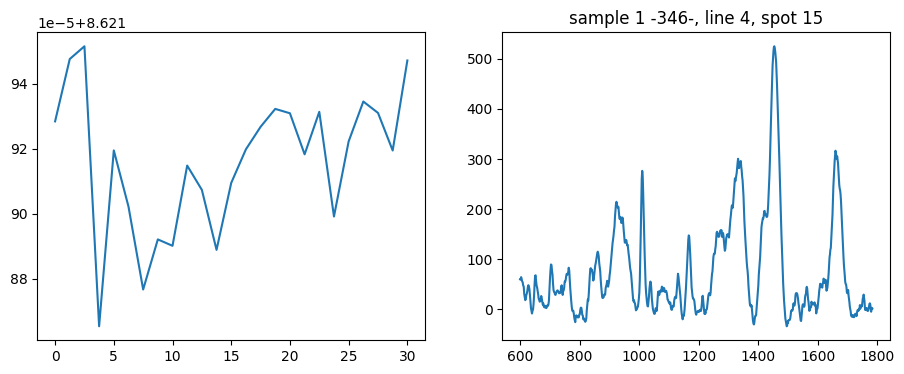

Send: MOVE X=30779.0 Y=-151211.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.48894500732422
Position =  9.996841859781178


<Figure size 640x480 with 0 Axes>

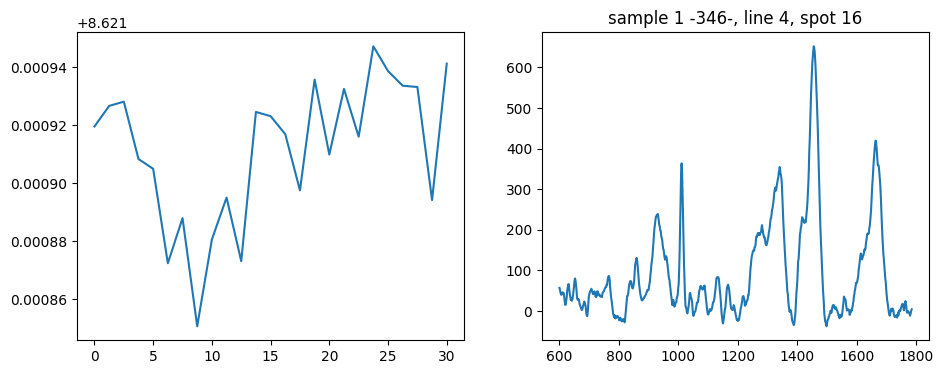

Send: MOVE X=31104.0 Y=-150882.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.362038612365723
Position =  7.496770658098167


<Figure size 640x480 with 0 Axes>

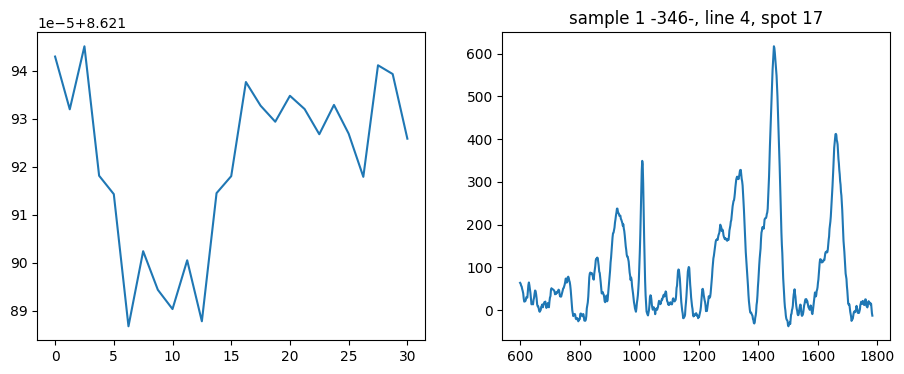

Send: MOVE X=31429.0 Y=-150554.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.47888469696045
Position =  7.496880030406534


<Figure size 640x480 with 0 Axes>

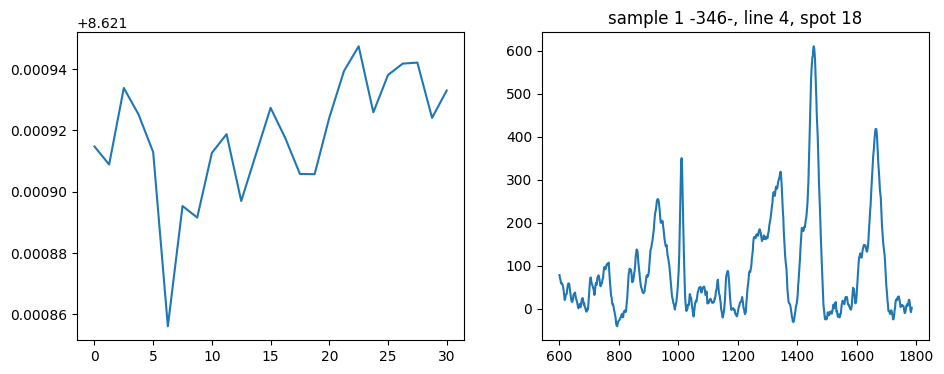

Send: MOVE X=31754.0 Y=-150226.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.351322174072266
Position =  10.031065219666784


<Figure size 640x480 with 0 Axes>

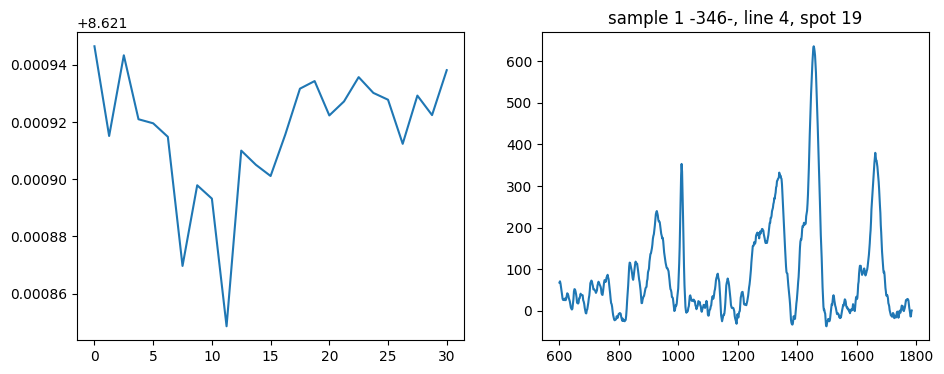

Send: MOVE X=32079.0 Y=-149898.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.571001768112183
Position =  3.7416940547584967


<Figure size 640x480 with 0 Axes>

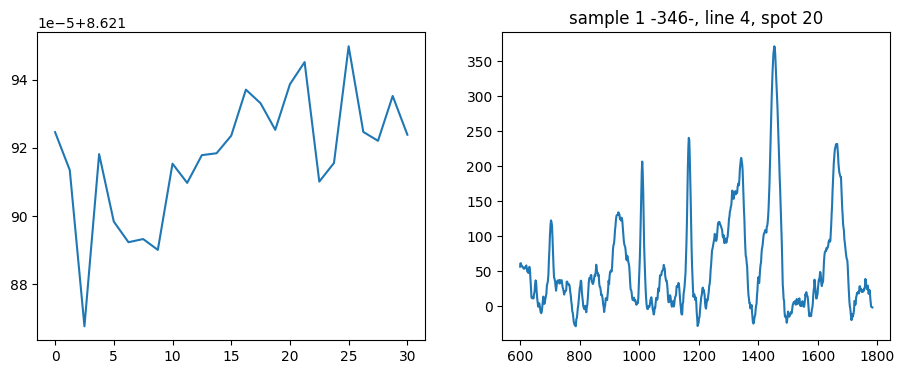

Send: MOVE X=32404.0 Y=-149570.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.315023183822632
Position =  8.773218599602894


<Figure size 640x480 with 0 Axes>

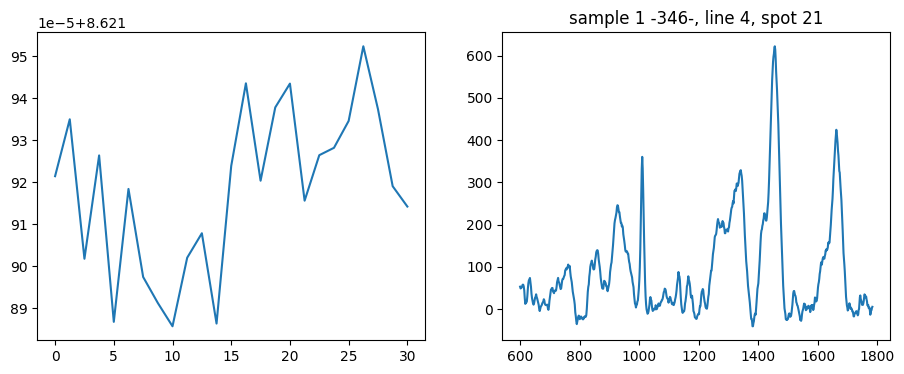

Send: MOVE X=32728.0 Y=-149242.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.874823570251465
Position =  11.268884184670972


<Figure size 640x480 with 0 Axes>

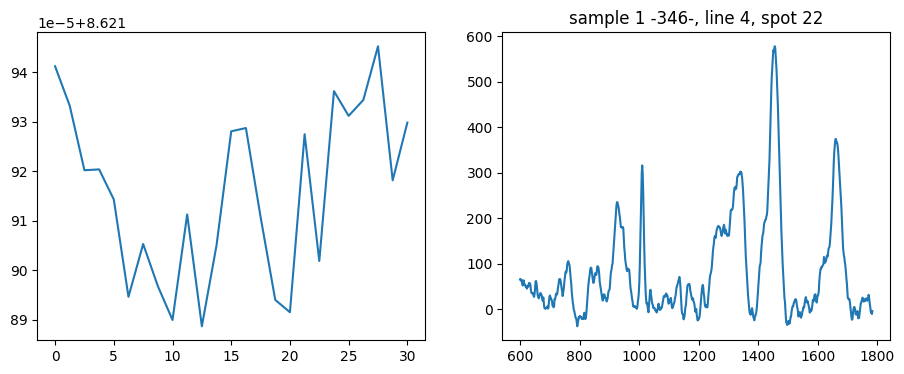

Send: MOVE X=33053.0 Y=-148914.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.335379123687744
Position =  12.493132245739561


<Figure size 640x480 with 0 Axes>

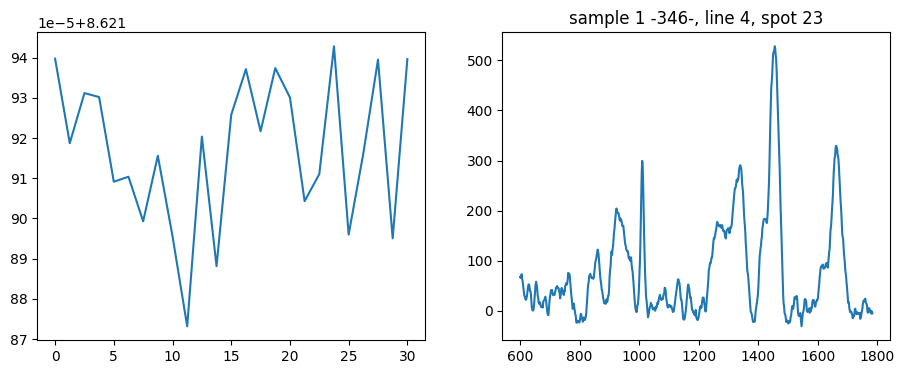

Send: MOVE X=33378.0 Y=-148586.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.591336011886597
Position =  10.029593863730105


<Figure size 640x480 with 0 Axes>

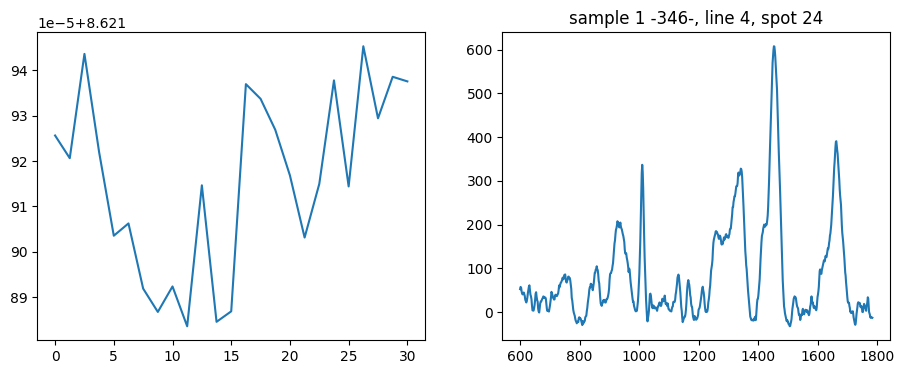

Send: MOVE X=33703.0 Y=-148258.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.346386432647705
Position =  12.492860697390695


<Figure size 640x480 with 0 Axes>

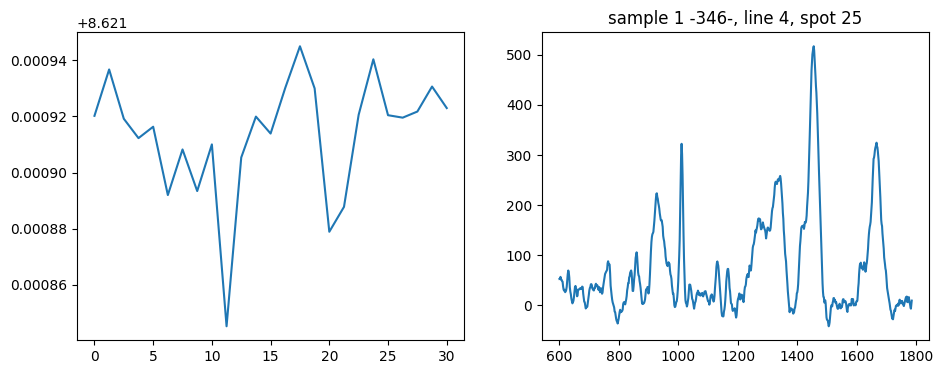

Send: MOVE X=34028.0 Y=-147930.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.472930431365967
Position =  6.282151267368386


<Figure size 640x480 with 0 Axes>

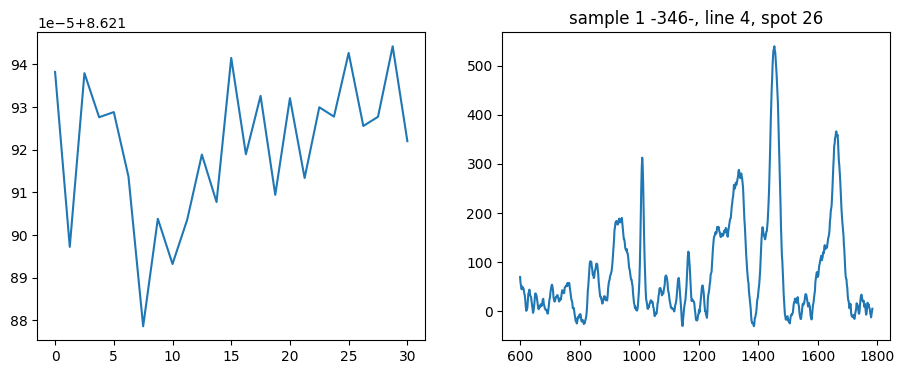

Send: MOVE X=34353.0 Y=-147601.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.42255425453186
Position =  12.493403793844521


<Figure size 640x480 with 0 Axes>

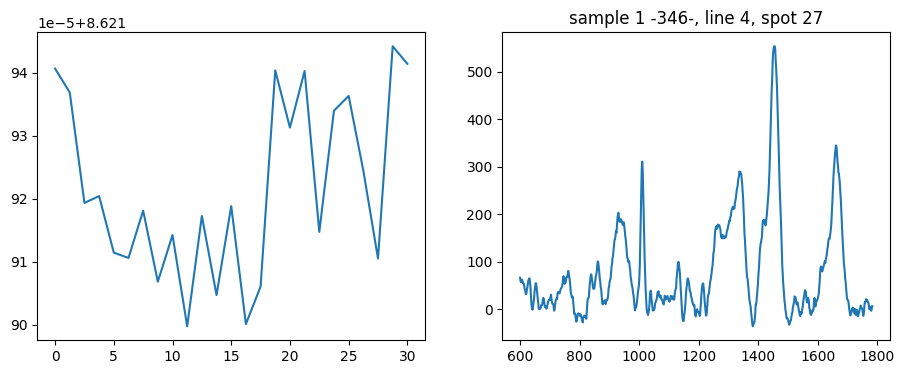

Send: MOVE X=34678.0 Y=-147273.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.375840187072754
Position =  3.793806230849573


<Figure size 640x480 with 0 Axes>

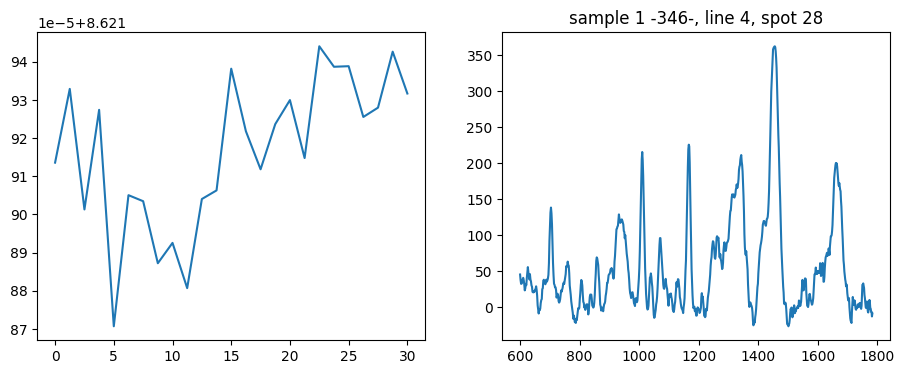

Send: MOVE X=35003.0 Y=-146945.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.303502321243286
Position =  8.744613152993871


<Figure size 640x480 with 0 Axes>

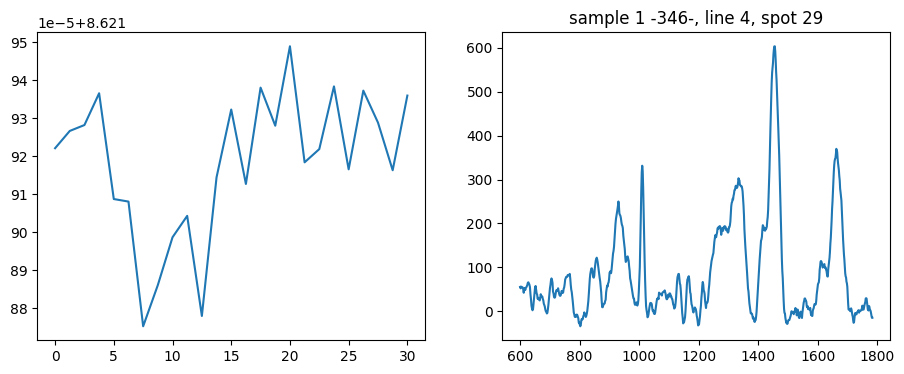

Send: MOVE X=35328.0 Y=-146617.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.52682590484619
Position =  8.743958053572706


<Figure size 640x480 with 0 Axes>

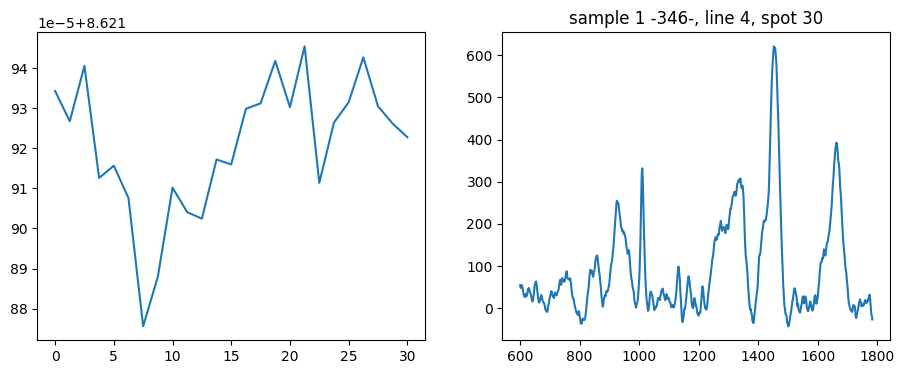

Send: MOVE X=35653.0 Y=-146289.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.399352312088013
Position =  12.492969317169276


<Figure size 640x480 with 0 Axes>

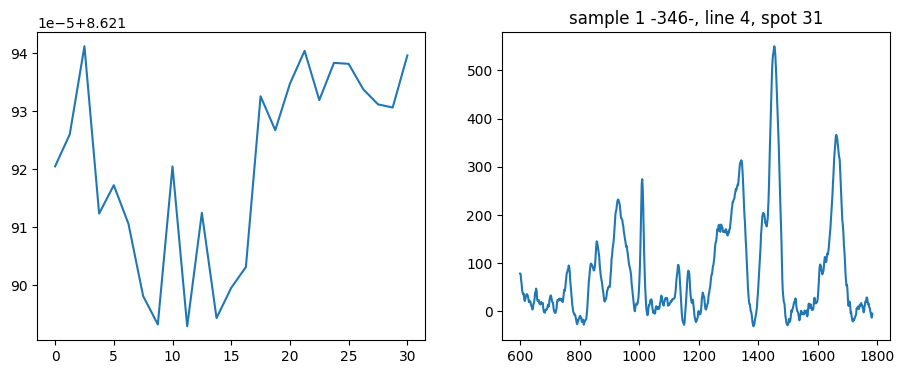

Send: MOVE X=35978.0 Y=-145961.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.585084199905396
Position =  12.493186555750807


<Figure size 640x480 with 0 Axes>

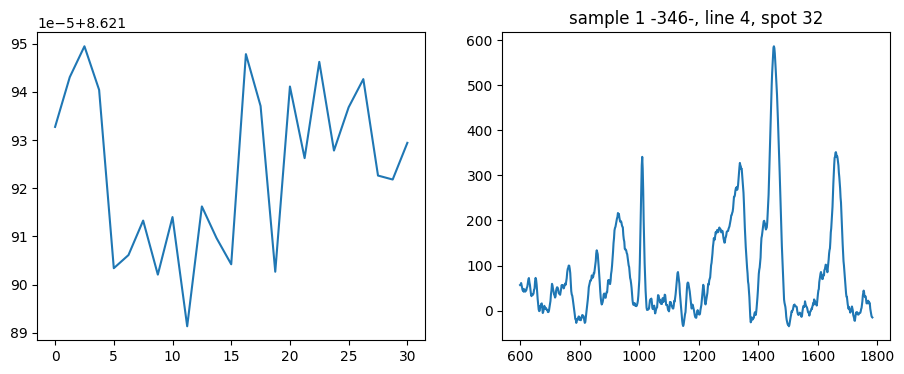

Send: MOVE X=36302.0 Y=-145633.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.40350317955017
Position =  12.492969316803414


<Figure size 640x480 with 0 Axes>

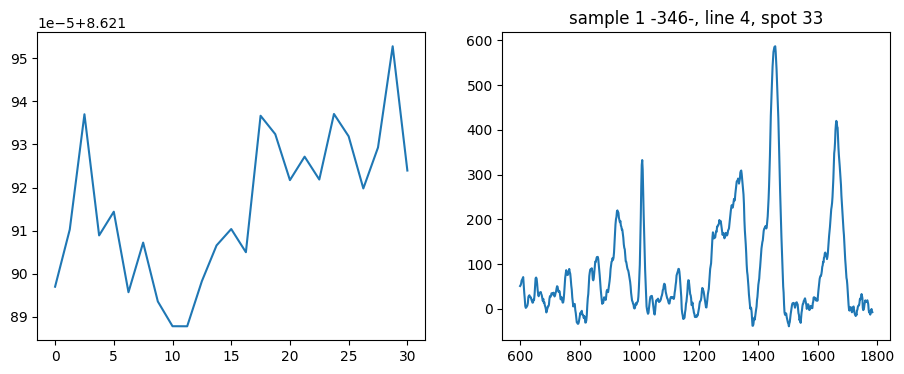

Send: MOVE X=36627.0 Y=-145305.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.56635618209839
Position =  11.243043065948422


<Figure size 640x480 with 0 Axes>

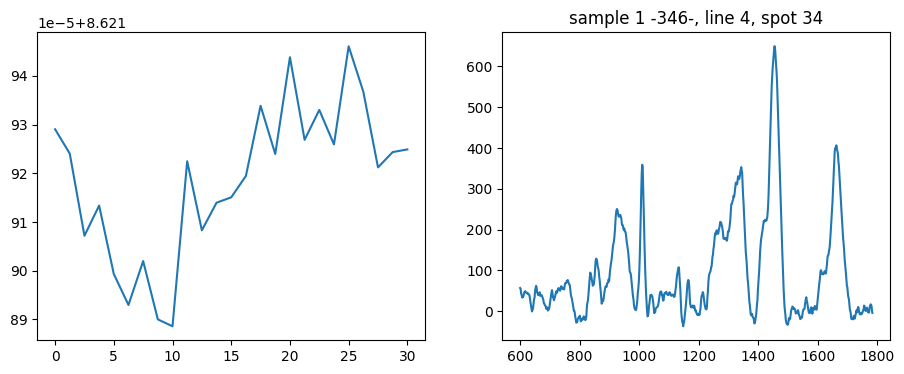

Send: MOVE X=36952.0 Y=-144977.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.47490358352661
Position =  9.995642922948017


<Figure size 640x480 with 0 Axes>

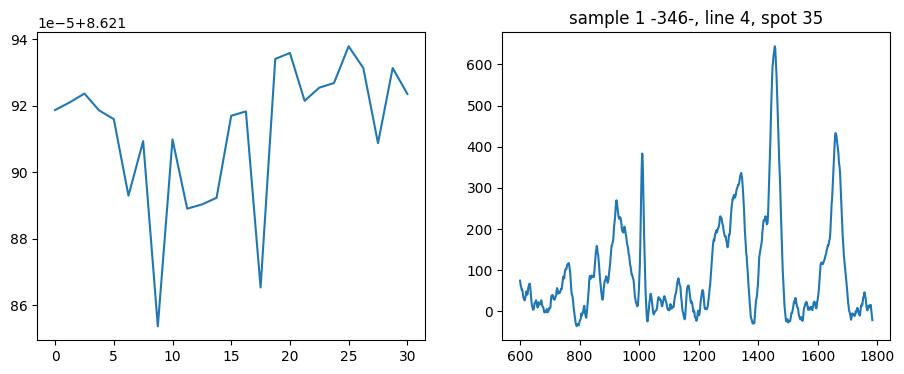

Send: MOVE X=37277.0 Y=-144649.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.569998741149902
Position =  6.267634821336748


<Figure size 640x480 with 0 Axes>

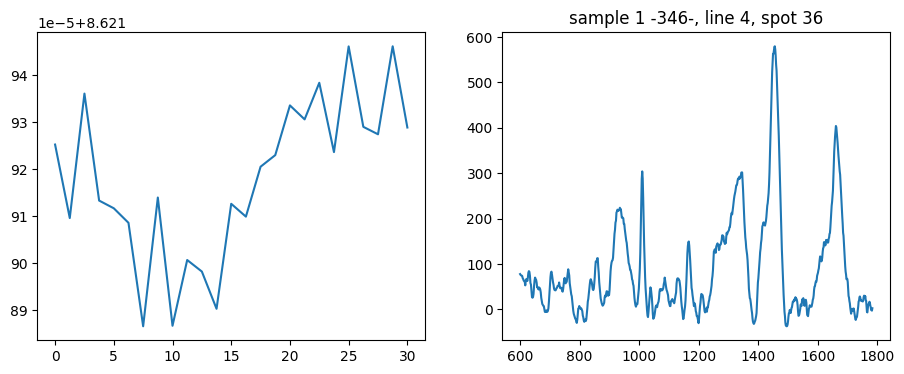

Send: MOVE X=37602.0 Y=-144321.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.297964572906494
Position =  11.243315082956759


<Figure size 640x480 with 0 Axes>

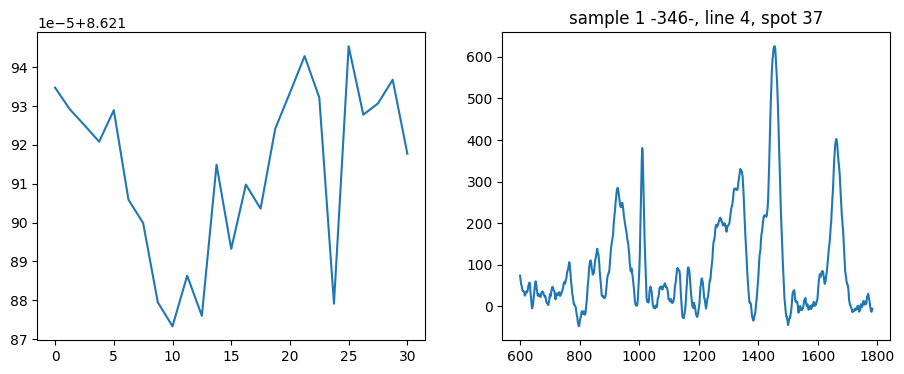

Send: MOVE X=37927.0 Y=-143992.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.630541563034058
Position =  11.243859116115317


<Figure size 640x480 with 0 Axes>

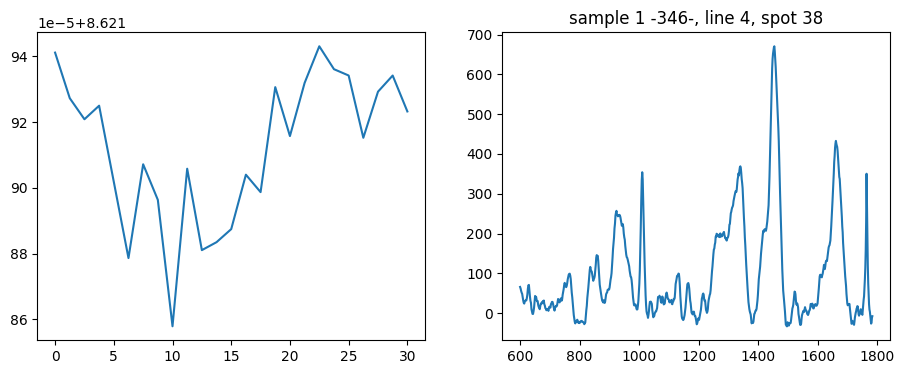

Send: MOVE X=38252.0 Y=-143664.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.298579692840576
Position =  7.5231289099328755


<Figure size 640x480 with 0 Axes>

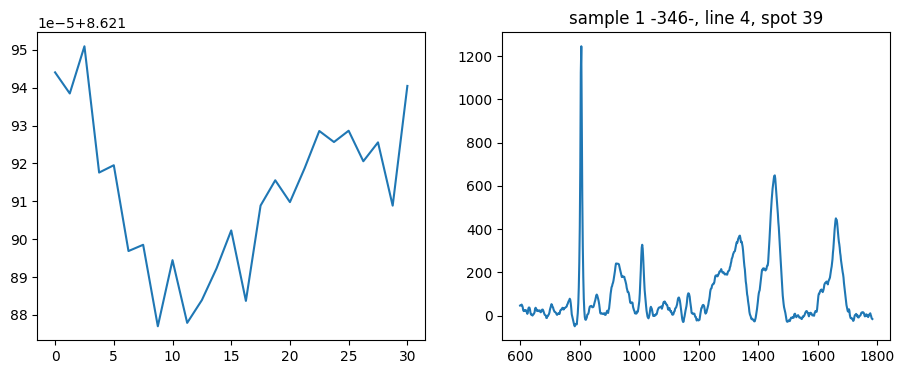

Send: MOVE X=38577.0 Y=-143336.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.3814959526062
Position =  11.26594650385


<Figure size 640x480 with 0 Axes>

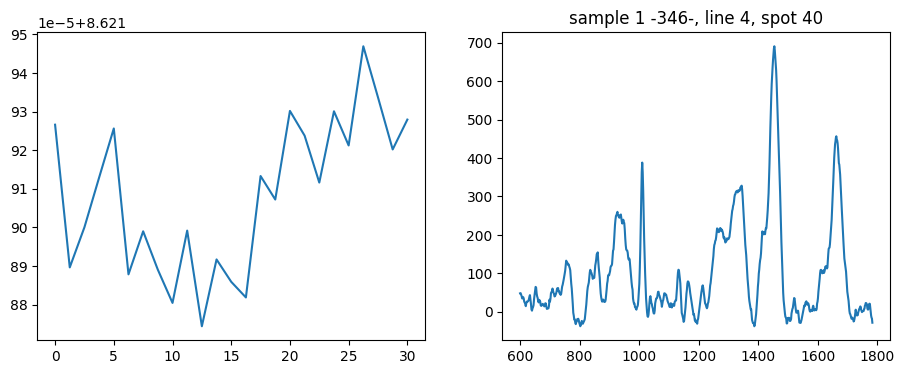

Send: MOVE X=38902.0 Y=-143008.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.37764024734497
Position =  7.496606599697876


<Figure size 640x480 with 0 Axes>

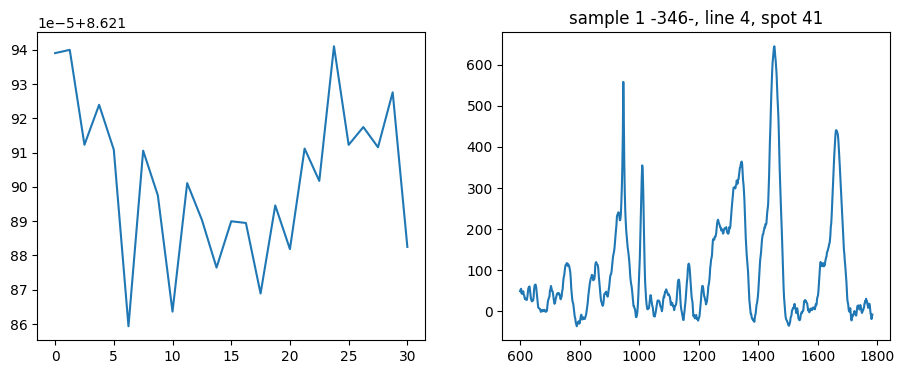

Send: MOVE X=39227.0 Y=-142680.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.363253593444824
Position =  18.74218560666276


<Figure size 640x480 with 0 Axes>

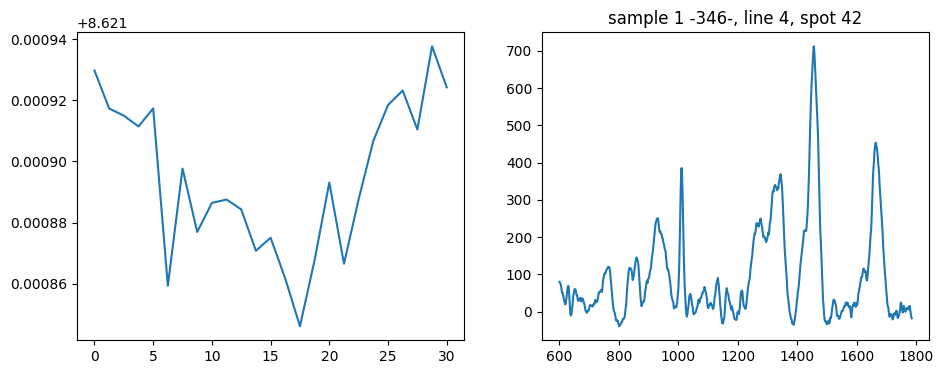

Send: MOVE X=39552.0 Y=-142352.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.36756205558777
Position =  14.997046587307624


<Figure size 640x480 with 0 Axes>

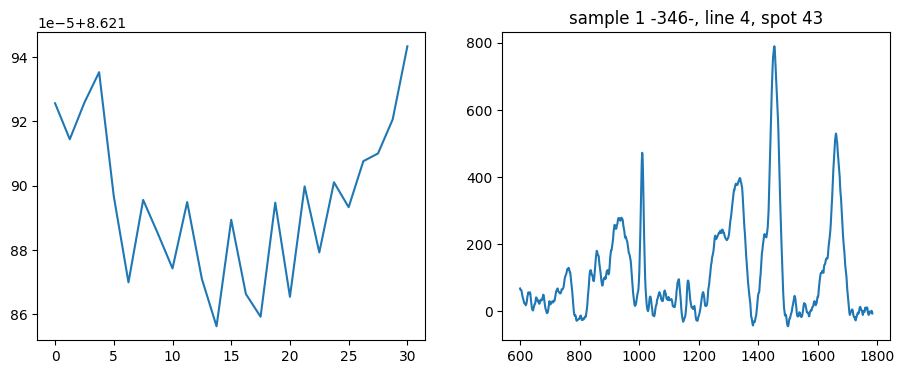

Send: MOVE X=39876.0 Y=-142024.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.35568857192993
Position =  9.996460380109356


<Figure size 640x480 with 0 Axes>

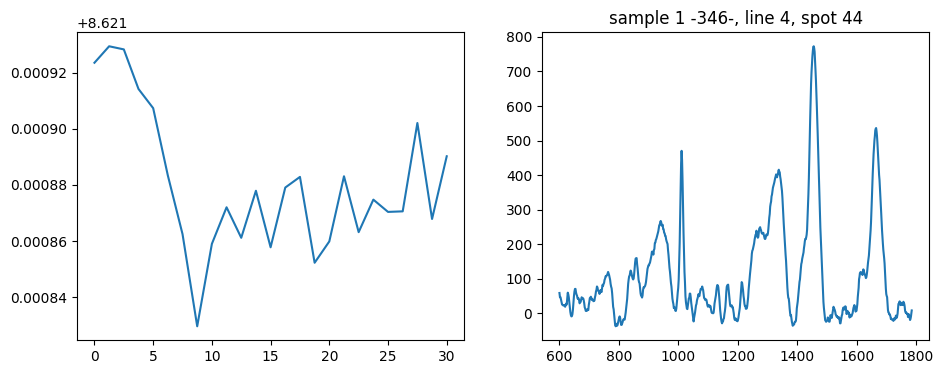

Send: MOVE X=40201.0 Y=-141696.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.319741249084473
Position =  14.997587815844124


<Figure size 640x480 with 0 Axes>

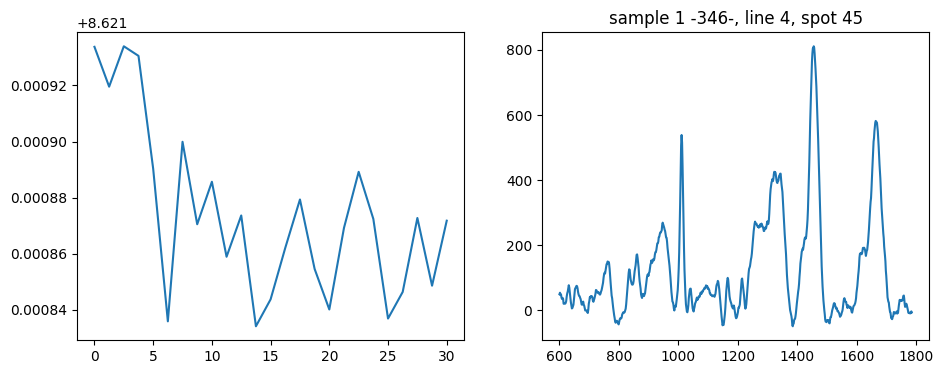

Send: MOVE X=40526.0 Y=-141368.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.366345643997192
Position =  23.739518190665994


<Figure size 640x480 with 0 Axes>

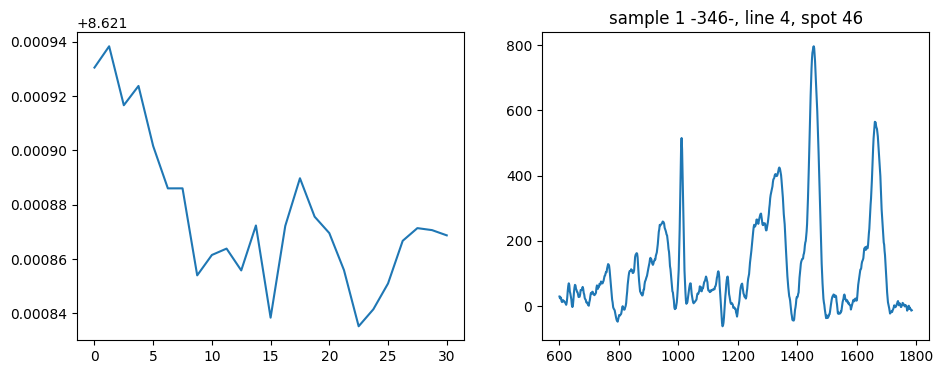

Send: MOVE X=40851.0 Y=-141040.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.300997257232666
Position =  28.743822700048174


<Figure size 640x480 with 0 Axes>

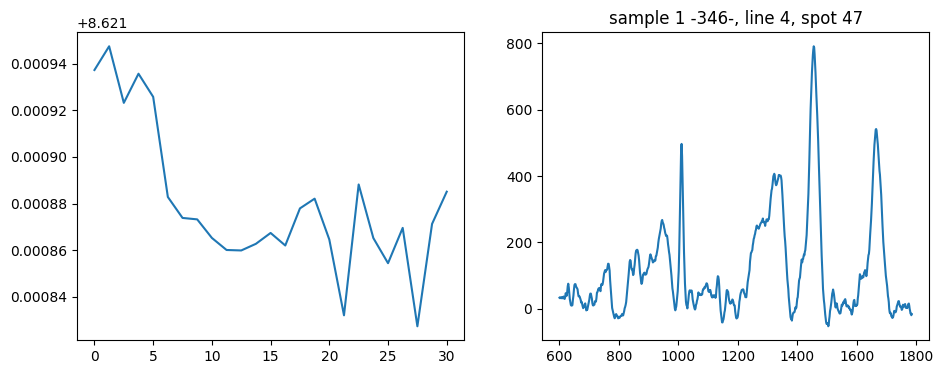

Send: MOVE X=41176.0 Y=-140711.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.62546420097351
Position =  21.244217555923704


<Figure size 640x480 with 0 Axes>

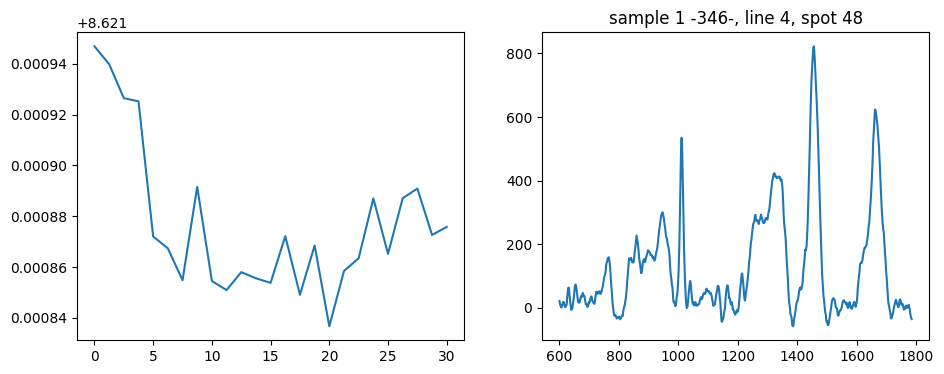

Send: MOVE X=41501.0 Y=-140383.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.292819261550903
Position =  21.267023714407802


<Figure size 640x480 with 0 Axes>

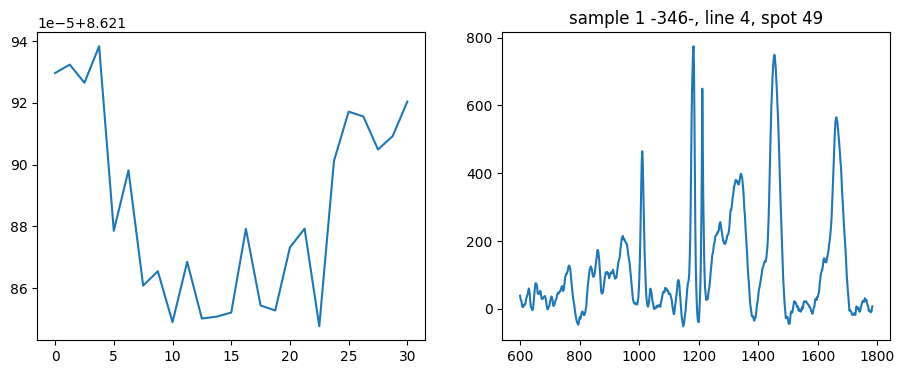

Send: MOVE X=41826.0 Y=-140055.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.378502130508423
Position =  10.024089891686678


<Figure size 640x480 with 0 Axes>

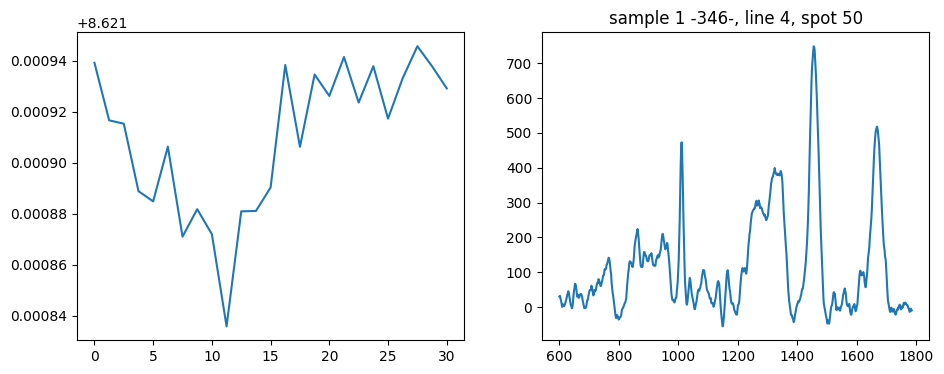

In [21]:
#Do line measurements
import pandas as pd
##TO EDIT: repitition number and exposure time
num_rep = 5
exp_time = 10
h = 0
exposures = .1
for h in range(spot_num):
    patient_number = sample_names[h]
    measurement_line = []
    for k in range(4):
        measurement_line = k+1
        current_spot = []
        for i in range(data_points):
            current_spot = i+1
            ms2k.move(x_vectors_grid[h,k,i],y_vectors_grid[h,k,i])
            ms2k.wait_for_device()
            time.sleep(0.75)
            df_list = []
            data_point = 1024
            int_array = np.zeros((num_rep,data_point))
            wa_array = np.zeros((num_rep,data_point))
            
            (z_axis_range,entropy_graph) = autofocus(exposures)
            for rep in range(num_rep):
                wavenumbers, intensity = cam.camera_aquisition(exp_time)
                df = pd.DataFrame({
                    'Wavelength':wavenumbers,
                    'Intensity':intensity
                })
                df_list.append(df)
            final_df = pd.concat(df_list)
            
            if len(str(current_spot)) == 1:
                newspotnum = str(0) + str(current_spot)
            else:
                newspotnum = current_spot

            final_df.to_csv(f'{folder_path}/{date}_{patient_number}_plasma_{filename}_{measurement_line}_{newspotnum}.txt',index=False,sep = ',',header = False)

            collected_spectra = np.column_stack((wavenumbers,intensity))
            processed = preprocessing(collected_spectra)
            plt.figure()
            plt.figure(figsize=(11,4))
            plt.subplot(1,2,1)
            plt.plot(z_axis_range,entropy_graph)
            plt.subplot(1,2,2)
            plt.plot(processed[:,0],processed[:,1])
            plt.title(f'sample {h+1} -{patient_number}-, line {measurement_line}, spot {current_spot}')
            plt.show()

In [34]:
#go back to a specific spot number to visualize:

#edit for the sample, line, and spot needed:

spot= [1, 4, 28]

num1 = spot[0]-1
num2 = spot[1]-1
num3 = spot[2]-1
patient_number = sample_names[num1]
filenameline = (f'{date}_{patient_number}_plasma_{filename}_{spot[1]}')
filenum = spot[2]
if len(str(filenum)) == 1:
    newfilenum = str(0) + str(filenum)
else:
    newfilenum = filenum

x_redo = x_vectors_grid[num1,num2,num3]
y_redo = y_vectors_grid[num1,num2,num3]

ms2k.move(x_redo,y_redo)
ms2k.wait_for_device()
time.sleep(0.75)



Recv: :A
Waiting for device...


Time elapsed =  23.739362478256226
Position =  11.267197740607182


<Figure size 640x480 with 0 Axes>

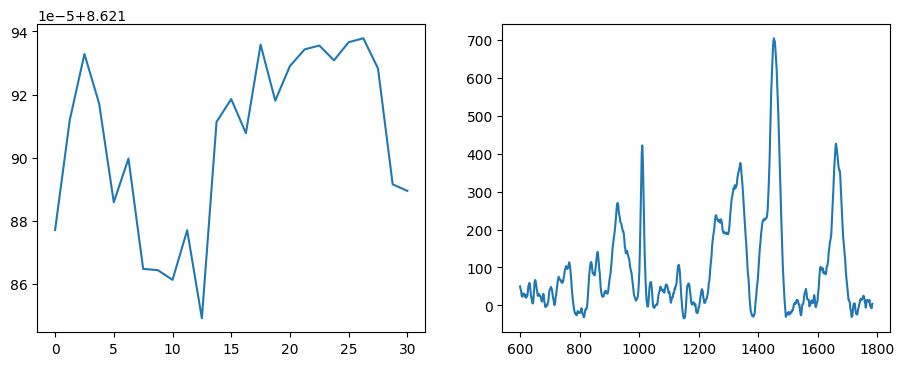

In [35]:
df_list = []
num_rep = 5
data_point = 1024
int_array = np.zeros((num_rep,data_point))
wa_array = np.zeros((num_rep,data_point))

exp_time = 10
(z_axis_range,entropy_graph) = autofocus(.1)

for rep in range(num_rep):
    wavenumbers, intensity = cam.camera_aquisition(exp_time)
    df = pd.DataFrame({
        'Wavelength':wavenumbers,
        'Intensity':intensity
    })
    df_list.append(df)
final_df = pd.concat(df_list)
final_df.to_csv(f'{folder_path}/{filenameline}_{newfilenum}_redone.txt',index=False,sep = ',',header = False)

collected_spectra = np.column_stack((wavenumbers,intensity))
processed = preprocessing(collected_spectra)
plt.figure()
plt.figure(figsize=(11,4))
plt.subplot(1,2,1)
plt.plot(z_axis_range,entropy_graph)
plt.subplot(1,2,2)
plt.plot(processed[:,0],processed[:,1])
plt.show()

In [ ]:
#re-zero z-axis mover, if needed
axis = c_uint(3)
pos = c_double(0)

# Move to a new position
error = mcldll.MCL_SingleWriteN(pos, axis, handle)

In [56]:
df = pd.read_csv(r"C:\Users\Carney Lab\Desktop\test\Automation Code\Production Code\data\Bec\20240515\20240515_346_plasma_60x_1mm_42mW_cw-853_grating3_quartz_1_01.txt")
file = df.to_numpy()
intensities = file[:,1]
ent = calculate_entropy(intensities)
#entropy_list.append(ent)